In [202]:
import torch
import torchvision
import torchvision.models as models
import torch.nn as nn
from torch.autograd import Variable
import torchvision.transforms as transforms
import numpy

In [2]:
def output_label(label):
    output_mapping = {
                 0: "T-shirt/Top",
                 1: "Trouser",
                 2: "Pullover",
                 3: "Dress",
                 4: "Coat", 
                 5: "Sandal", 
                 6: "Shirt",
                 7: "Sneaker",
                 8: "Bag",
                 9: "Ankle Boot"
                 }
    input = (label.item() if type(label) == torch.Tensor else label)
    return output_mapping[input]

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [6]:
train_set = torchvision.datasets.FashionMNIST("./Fashiondata", download=True, transform=
                                                transforms.Compose([transforms.ToTensor()]))
test_set = torchvision.datasets.FashionMNIST("./Fashiondata", download=True, train=False, transform=
                                                                    transforms.Compose([transforms.ToTensor()])) 

  0%|          | 0/26421880 [00:00<?, ?it/s]

Extracting ./Fashiondata/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./Fashiondata/FashionMNIST/raw



  0%|          | 0/29515 [00:00<?, ?it/s]

Extracting ./Fashiondata/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./Fashiondata/FashionMNIST/raw



  0%|          | 0/4422102 [00:00<?, ?it/s]

Extracting ./Fashiondata/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./Fashiondata/FashionMNIST/raw



  0%|          | 0/5148 [00:00<?, ?it/s]

Extracting ./Fashiondata/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./Fashiondata/FashionMNIST/raw

Processing...
Done!


/Users/badrinathsinghal/anaconda3/envs/embodyme_pytorch/lib/python3.7/site-packages/torchvision/datasets/mnist.py:502: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ../torch/csrc/utils/tensor_numpy.cpp:143.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [7]:
train_loader = torch.utils.data.DataLoader(train_set, 
                                           batch_size=100)
test_loader = torch.utils.data.DataLoader(test_set,
                                          batch_size=100)

In [26]:
train_set[5000][0].shape

torch.Size([1, 28, 28])

In [28]:
demo_loader = torch.utils.data.DataLoader(train_set, batch_size=10)

batch = next(iter(demo_loader))
images, labels = batch
print(images.shape, labels.shape)

torch.Size([10, 1, 28, 28]) torch.Size([10])


In [29]:
class FashionCNN(nn.Module):
    def __init__(self):
        super(FashionCNN, self).__init__()
        self.layer1 = nn.Sequential(nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        
        self.layer2 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        
        self.fc1 = nn.Linear(in_features=64*6*6, out_features=600)
        self.drop = nn.Dropout2d(0.25)
        self.fc2 = nn.Linear(in_features=600, out_features=120)
        self.fc3 = nn.Linear(in_features=120, out_features=10)
    
    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = out.view(out.size(0), -1)
        out = self.fc1(out)
        out = self.drop(out)
        out = self.fc2(out)
        out = self.fc3(out)
        
        return out
        

In [30]:
#Training a CNN FashionMNIST classifier

model = FashionCNN()
model.to(device)

error = nn.CrossEntropyLoss()

learning_rate = 0.001
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
print(model)

FashionCNN(
  (layer1): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (layer2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (fc1): Linear(in_features=2304, out_features=600, bias=True)
  (drop): Dropout2d(p=0.25, inplace=False)
  (fc2): Linear(in_features=600, out_features=120, bias=True)
  (fc3): Linear(in_features=120, out_features=10, bias=True)
)


In [34]:
num_epoch = 5
count = 0

loss_list = []
iteration_list = []
accuracy_list = []
predictions_list = []
labels_list = []

for epoch in range(num_epoch):
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        
        train = Variable(images.view(100,1,28,28))
        labels = Variable(labels)
        
        outputs = model(train)
        loss = error(outputs, labels)
        
        optimizer.zero_grad()
        
        loss.backward()
        optimizer.step()
        
        count += 1
        
        
        if not (count%50):
            total = 0
            correct = 0
            
            for images, labels in test_loader:
                images, labels = images.to(device), labels.to(device)
                labels_list.append(labels)
            
                test = Variable(images.view(100, 1, 28, 28))
            
                outputs = model(test)
            
                predictions = torch.max(outputs, 1)[1].to(device)
                predictions_list.append(predictions)
                correct += (predictions == labels).sum()
            
                total += len(labels)
            
            accuracy = correct * 100 / total
            loss_list.append(loss.data)
            iteration_list.append(count)
            accuracy_list.append(accuracy)
            
        if not (count%500):
            print("Iteration: {}, Loss: {}, Accuracy: {}%".format(count, loss.data, accuracy))

Iteration: 500, Loss: 0.23951312899589539, Accuracy: 90.9000015258789%
Iteration: 1000, Loss: 0.2449137270450592, Accuracy: 90.6500015258789%
Iteration: 1500, Loss: 0.164512500166893, Accuracy: 89.4800033569336%
Iteration: 2000, Loss: 0.13813412189483643, Accuracy: 90.44999694824219%
Iteration: 2500, Loss: 0.1388927400112152, Accuracy: 89.87000274658203%
Iteration: 3000, Loss: 0.10422789305448532, Accuracy: 90.19999694824219%


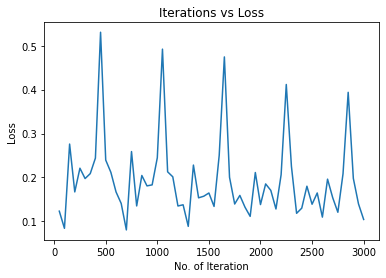

In [38]:
import matplotlib.pyplot as plt

plt.plot(iteration_list, loss_list)
plt.xlabel("No. of Iteration")
plt.ylabel("Loss")
plt.title("Iterations vs Loss")
plt.show()

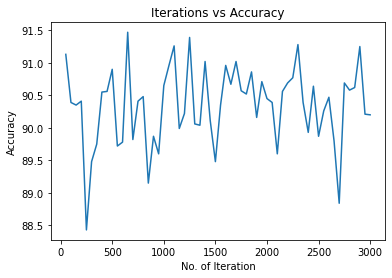

In [39]:
plt.plot(iteration_list, accuracy_list)
plt.xlabel("No. of Iteration")
plt.ylabel("Accuracy")
plt.title("Iterations vs Accuracy")
plt.show()

In [205]:
#Selecting query and test instances

#Two experiments will be conducted.

# 1. We will try to reduce distance between query and test instance by keeping test class same as the original test class
# 2. We will reduce distance between query and test instance and also change test class to that of query instance
from random import randint

query_set = train_set[randint(0,len(train_set))]
query_image, query_label = query_set[0].clone(), query_set[1]
# cf = torch.tensor(train_set[randint(0,len(train_set))][0].clone().detach(), requires_grad=True)
cf_set = train_set[randint(0,len(train_set))]
cf_image, cf_label = cf_set[0].clone(), cf_set[1]
cf_image.requires_grad = True

In [206]:
model.eval()

pdist = nn.PairwiseDistance(p=2.0, eps=1e-06, keepdim=False)
optimizer_cf = torch.optim.Adam([cf_image], lr=learning_rate)

-0.12102697044610977


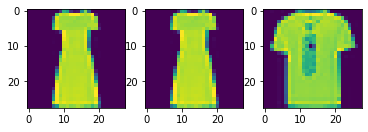

0.10195161402225494


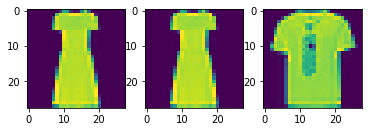

0.17767386138439178


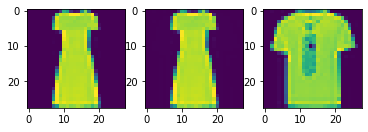

0.2146579474210739


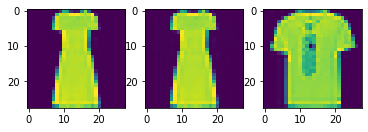

0.1789548695087433


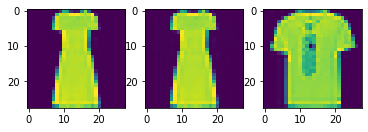

0.11495468765497208


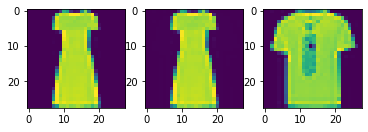

0.08680754899978638


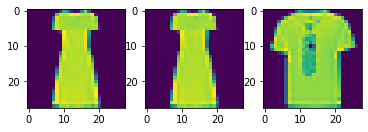

0.07125087082386017


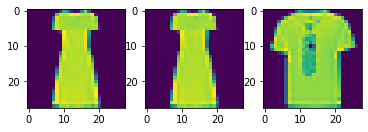

0.05700463801622391


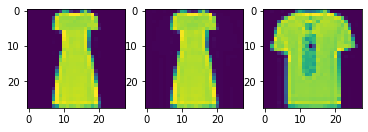

0.03967174142599106


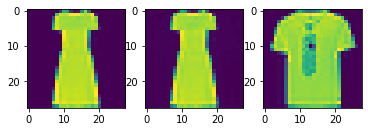

0.018364429473876953


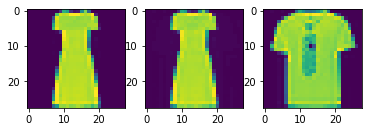

-0.0032277554273605347


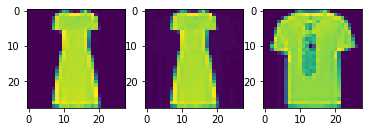

-0.015751458704471588


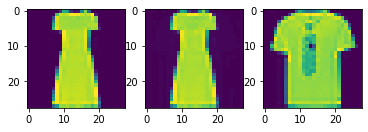

-0.008168347179889679


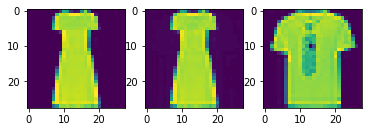

0.015836581587791443


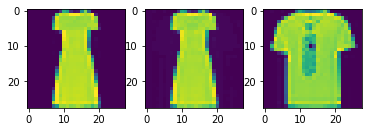

0.03865925967693329


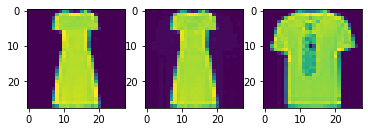

0.053182974457740784


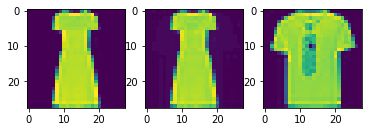

0.06140662729740143


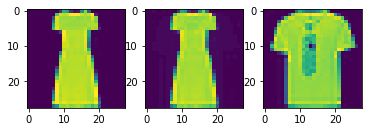

0.0660243034362793


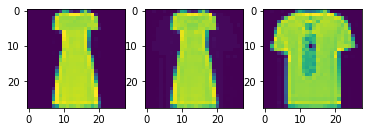

0.06861896812915802


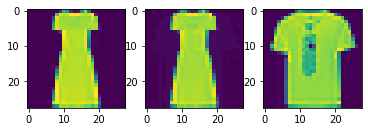

0.07003753632307053


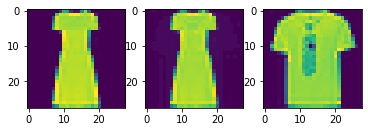

0.07124337553977966


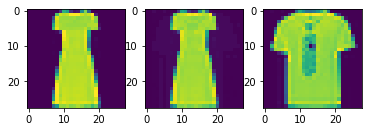

0.07245524227619171


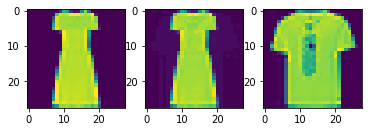

0.07364045083522797


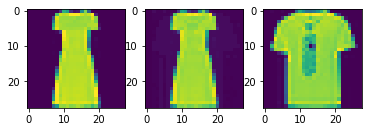

0.07457822561264038


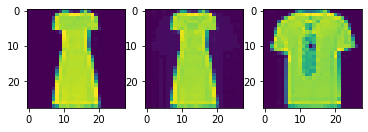

0.07483644783496857


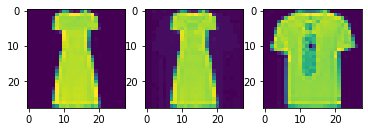

0.07368659228086472


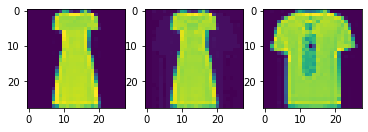

0.07002878934144974


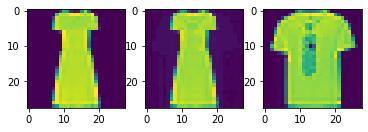

0.06242731213569641


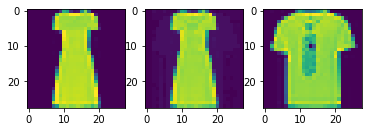

0.04949456453323364


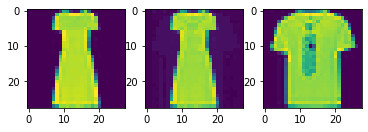

0.030856043100357056


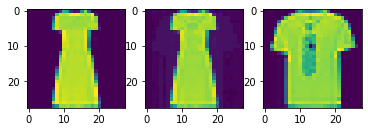

0.00824776291847229


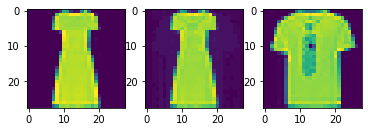

-0.014666341245174408


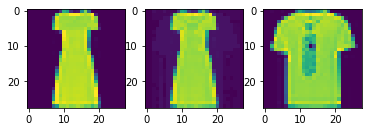

-0.03420642018318176


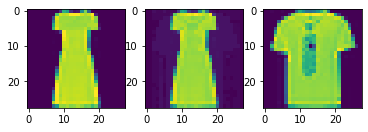

-0.048423394560813904


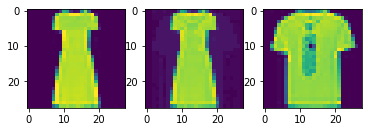

-0.0571666955947876


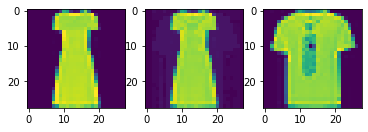

-0.061228394508361816


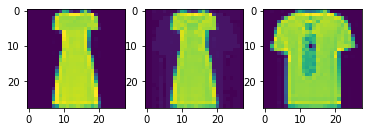

-0.061624787747859955


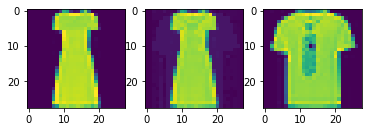

-0.05928388237953186


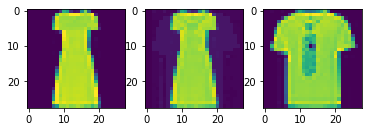

-0.05496513843536377


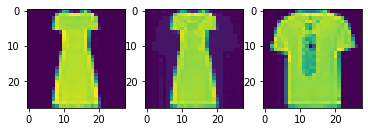

-0.049260228872299194


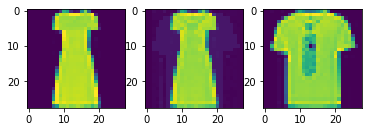

-0.042614325881004333


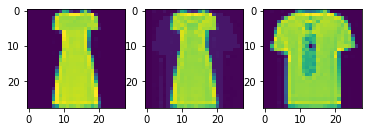

-0.03534023463726044


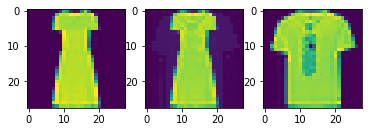

-0.027638643980026245


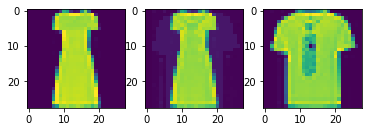

-0.019614197313785553


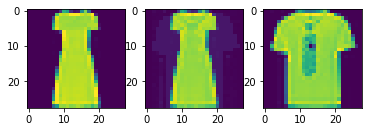

-0.011296972632408142


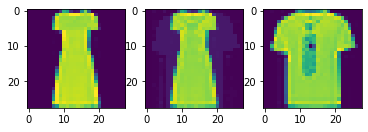

-0.0026622116565704346


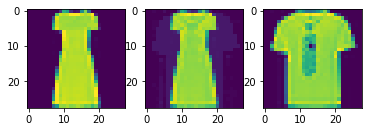

0.00635799765586853


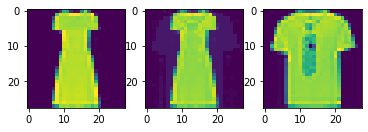

0.015861496329307556


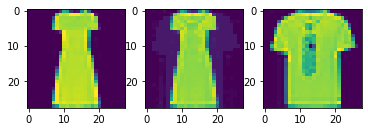

0.025974370539188385


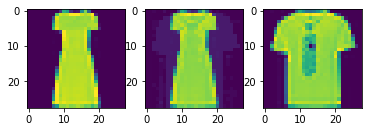

0.036865368485450745


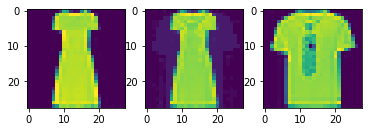

0.04873901605606079


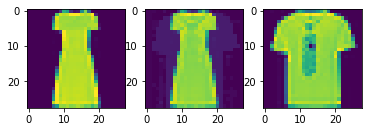

0.061816632747650146


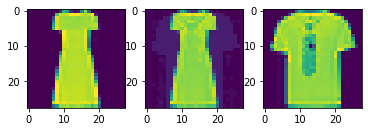

0.07636032998561859


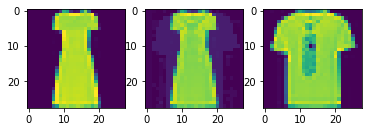

0.09194212406873703


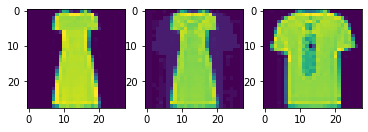

0.10883808135986328


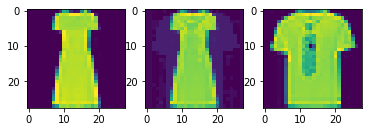

0.1272476613521576


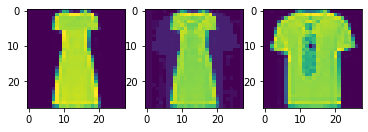

0.14709612727165222


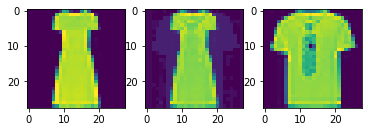

0.168034166097641


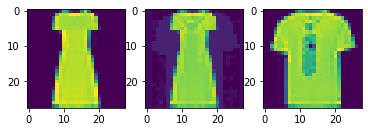

0.18954308331012726


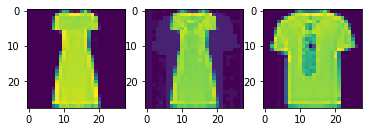

0.21081961691379547


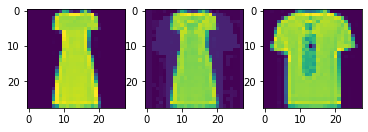

0.23105938732624054


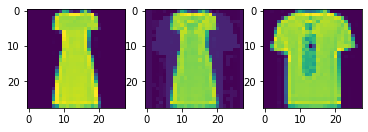

0.24947041273117065


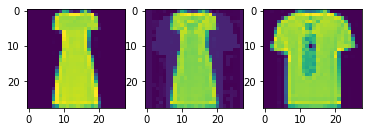

0.2654281556606293


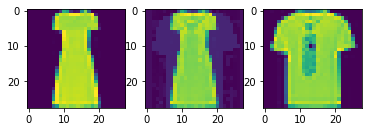

0.27857378125190735


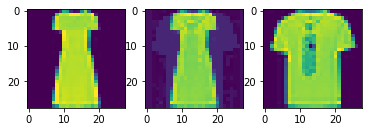

0.2887633740901947


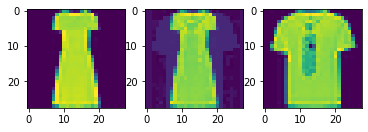

0.29618966579437256


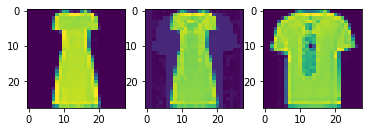

0.3007171154022217


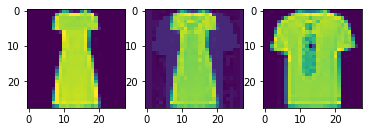

0.30243051052093506


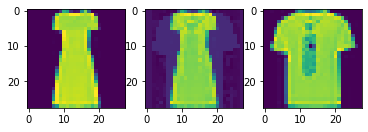

0.30163756012916565


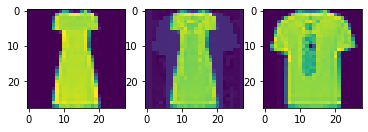

0.2989020347595215


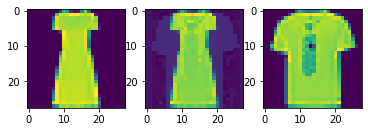

0.29393112659454346


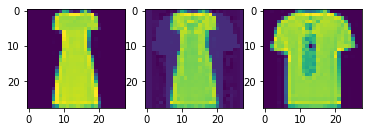

0.2876248359680176


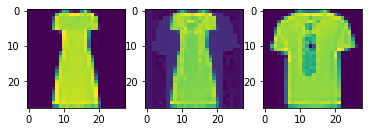

0.2807614207267761


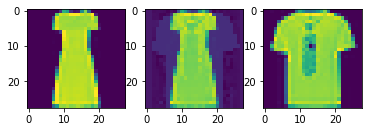

0.27394381165504456


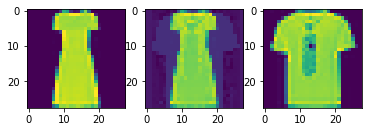

0.26722314953804016


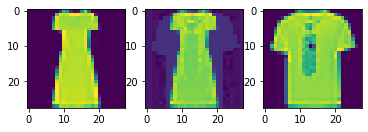

0.26034635305404663


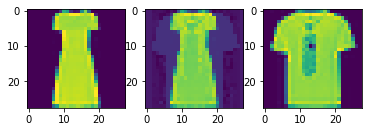

0.25292471051216125


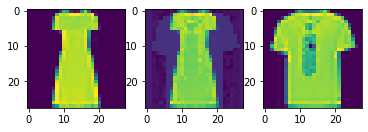

0.2448897361755371


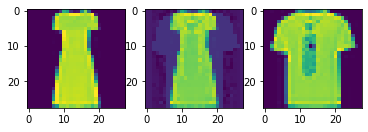

0.2366430163383484


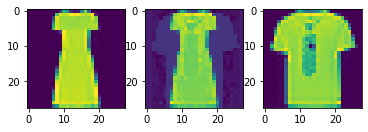

0.2279157042503357


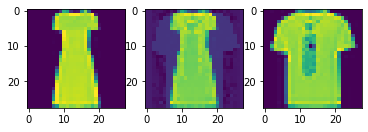

0.21831797063350677


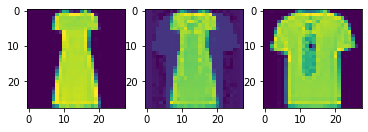

0.20766162872314453


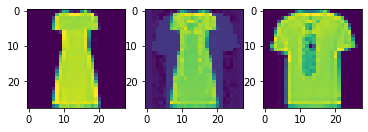

0.19561117887496948


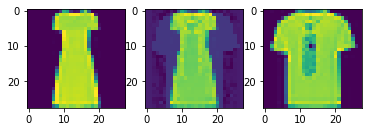

0.1826283484697342


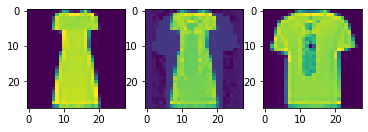

0.16903617978096008


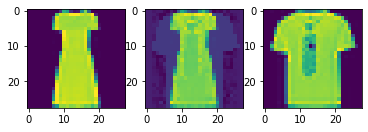

0.15499594807624817


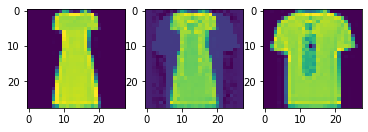

0.14148974418640137


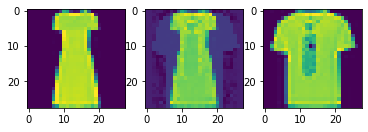

0.12857243418693542


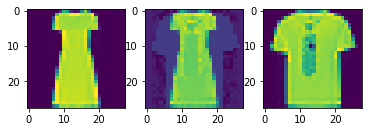

0.11622685194015503


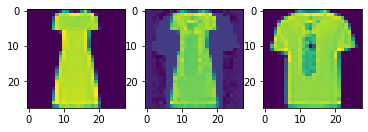

0.10425777733325958


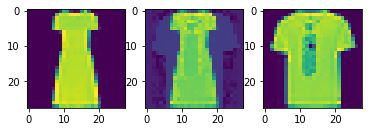

0.09305286407470703


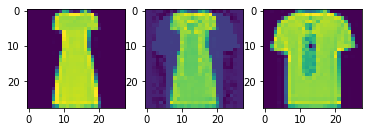

0.08297906816005707


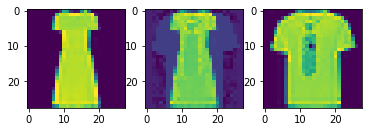

0.07401398569345474


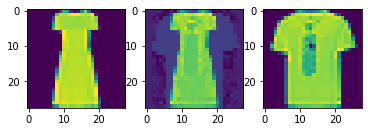

0.06579044461250305


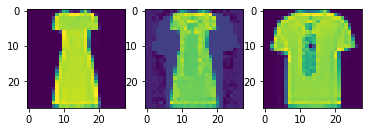

0.05803664028644562


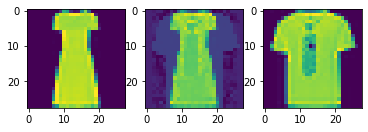

0.05057603865861893


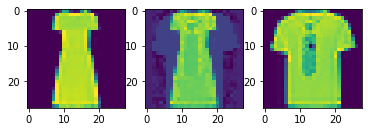

0.04339439421892166


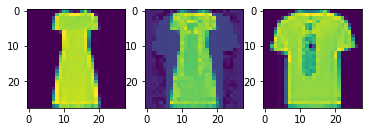

0.03659461438655853


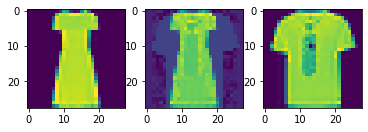

0.030119165778160095


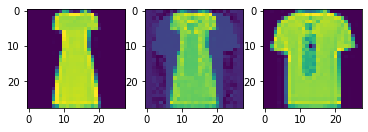

0.02410592883825302


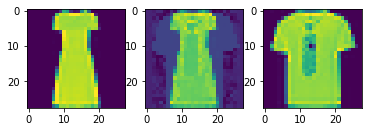

0.018705807626247406


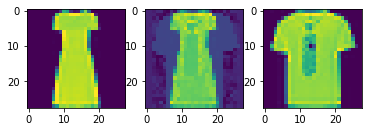

0.014091908931732178


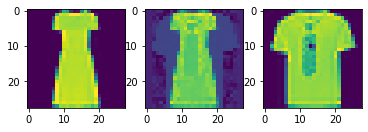

0.010013021528720856


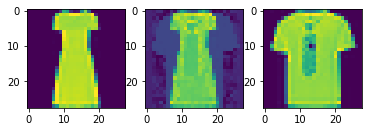

0.006608128547668457


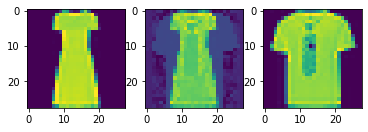

0.0038247108459472656


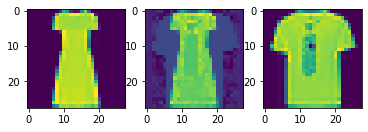

0.001645416021347046


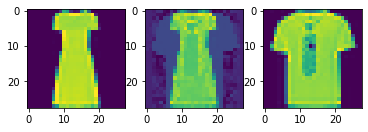

1.1071562767028809e-05


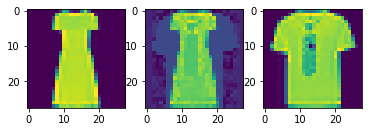

-0.0011995434761047363


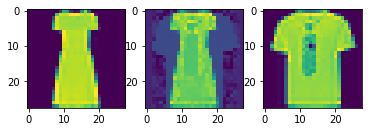

-0.0020012259483337402


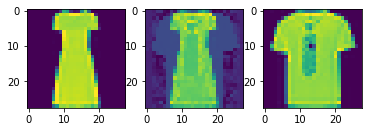

-0.0024566948413848877


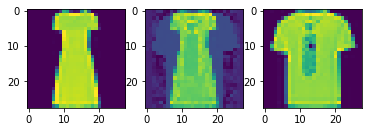

-0.0025135576725006104


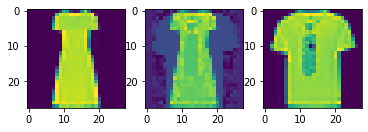

-0.0022358298301696777


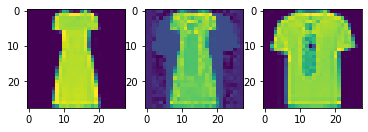

-0.0016958117485046387


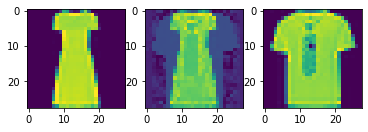

-0.0007873624563217163


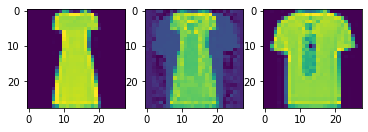

0.0004965364933013916


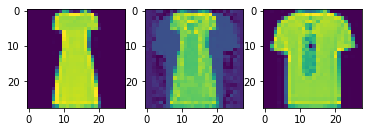

0.002103559672832489


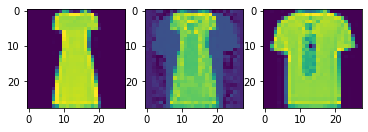

0.003900565207004547


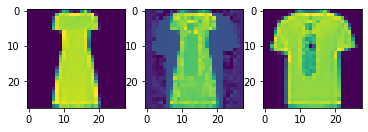

0.0059432536363601685


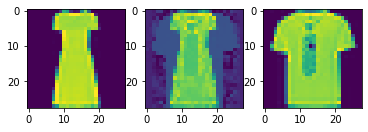

0.008221805095672607


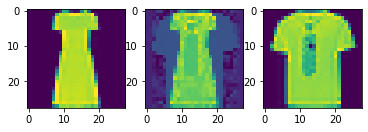

0.010749086737632751


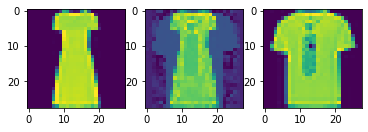

0.013559870421886444


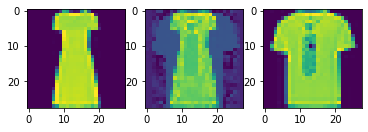

0.016560286283493042


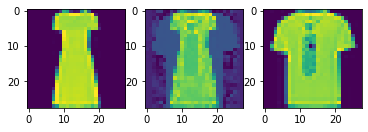

0.01985282450914383


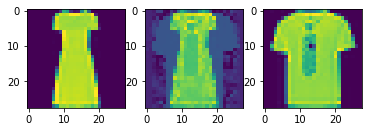

0.023426998406648636


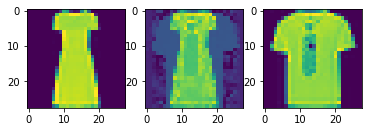

0.02723405510187149


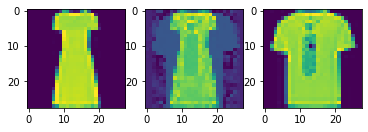

0.031336262822151184


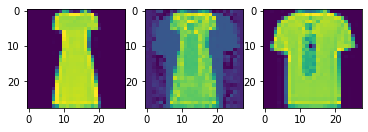

0.03561584651470184


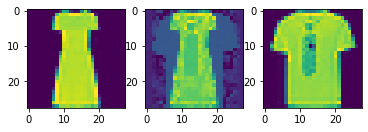

0.04005281627178192


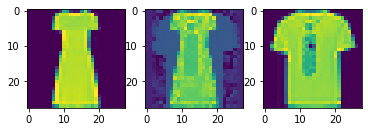

0.04472634568810463


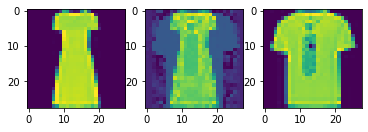

0.04957761615514755


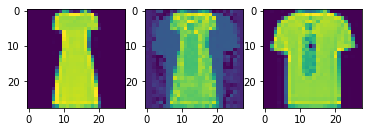

0.05451475828886032


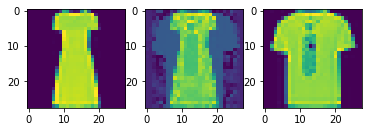

0.05954202264547348


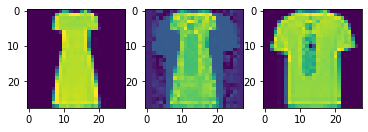

0.06468246877193451


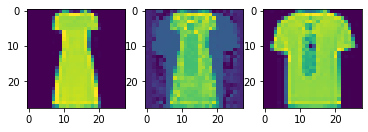

0.06996170431375504


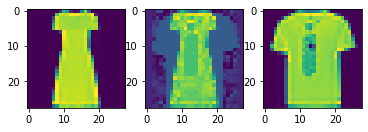

0.07533442974090576


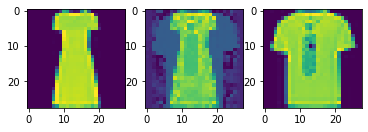

0.080762580037117


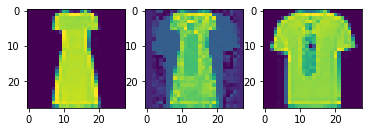

0.08622560650110245


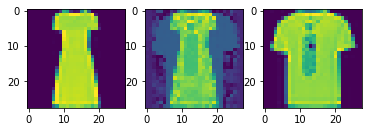

0.0917673110961914


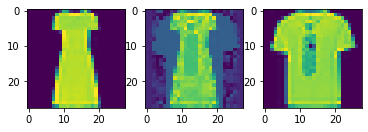

0.09741668403148651


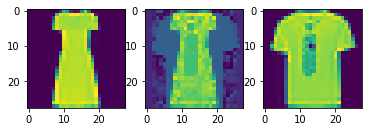

0.10317661613225937


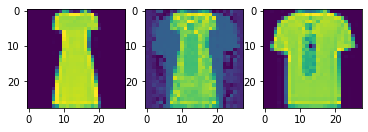

0.10903734713792801


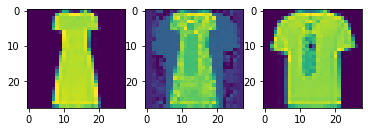

0.11504331976175308


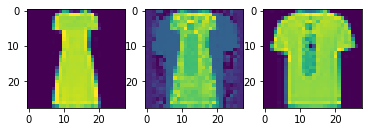

0.12121516466140747


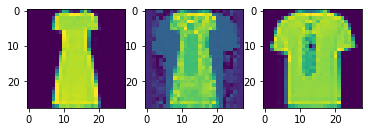

0.1275835484266281


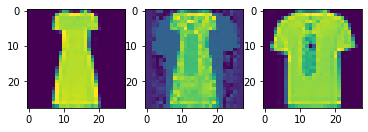

0.1341438740491867


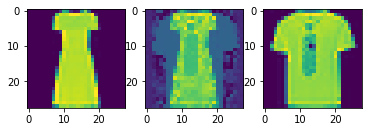

0.14094683527946472


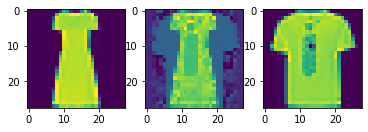

0.14795580506324768


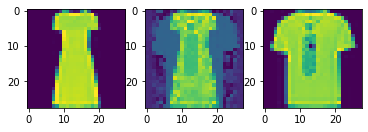

0.15513402223587036


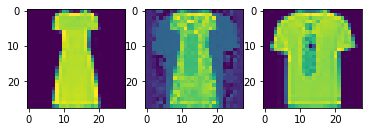

0.16245661675930023


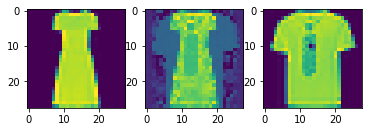

0.16987678408622742


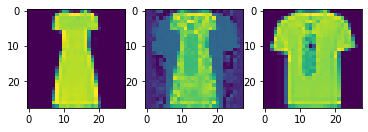

0.17733052372932434


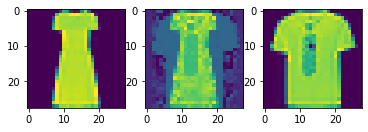

0.18481138348579407


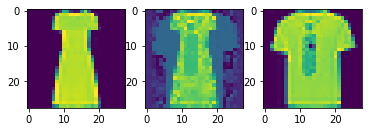

0.1922973096370697


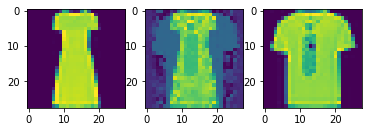

0.19979584217071533


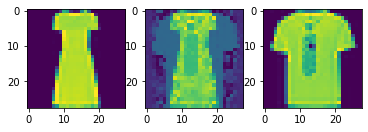

0.20726464688777924


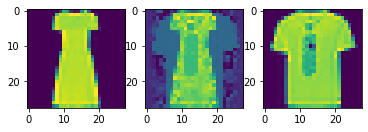

0.21469135582447052


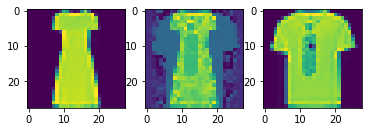

0.22206082940101624


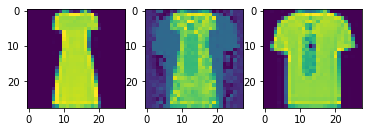

0.22936011850833893


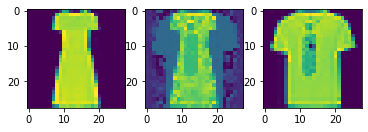

0.2365504801273346


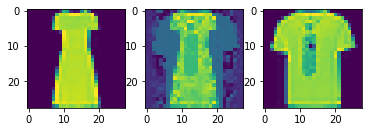

0.24363823235034943


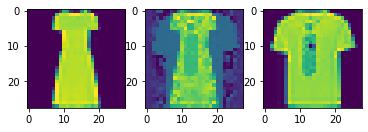

0.25062310695648193


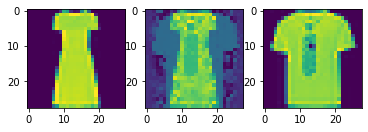

0.2575414478778839


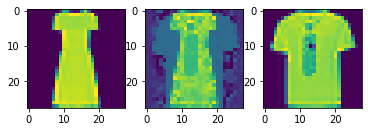

0.26443397998809814


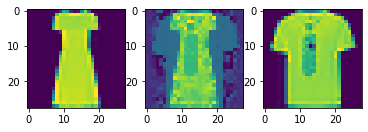

0.27131786942481995


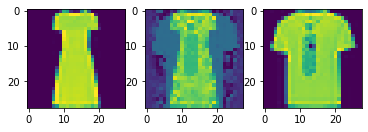

0.2782289385795593


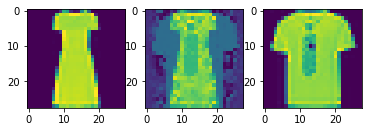

0.2851504683494568


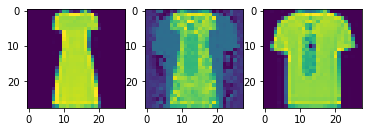

0.2920905351638794


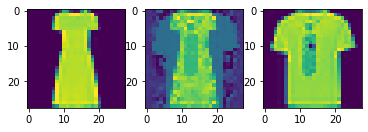

0.29902705550193787


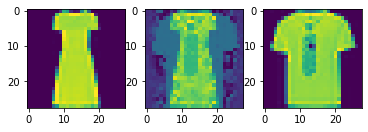

0.3059375286102295


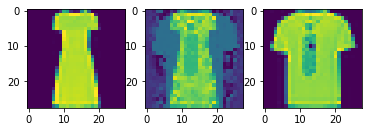

0.3127904534339905


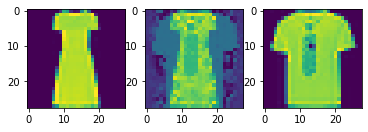

0.3195698857307434


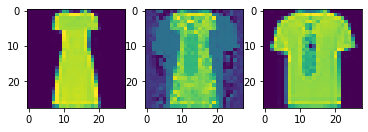

0.32627254724502563


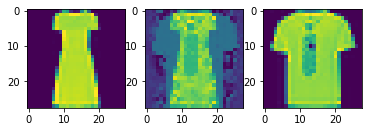

0.3329126834869385


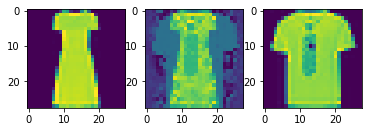

0.3394676148891449


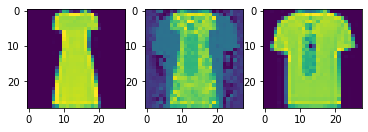

0.3459240794181824


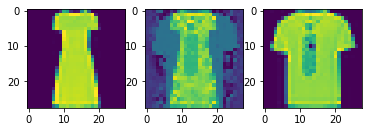

0.3522663116455078


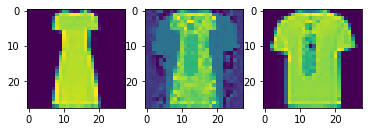

0.3584826588630676


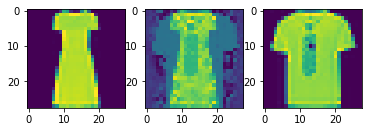

0.3645625114440918


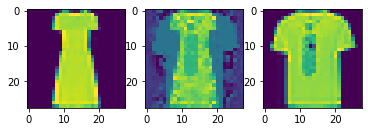

0.37049973011016846


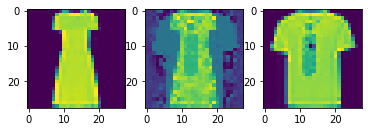

0.37628260254859924


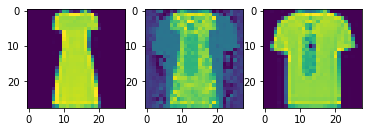

0.38193315267562866


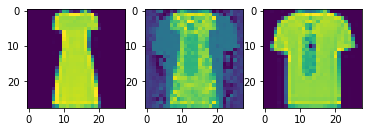

0.3874167203903198


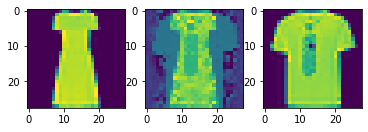

0.39269697666168213


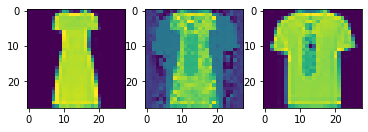

0.3977639079093933


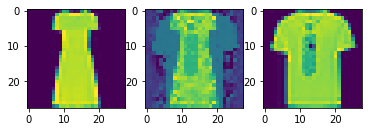

0.40259087085723877


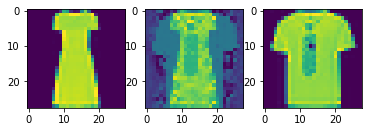

0.4072006940841675


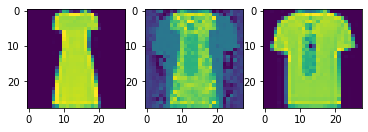

0.4115971028804779


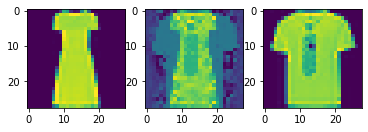

0.4157954752445221


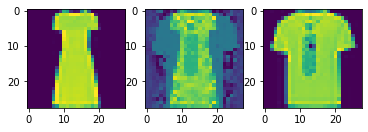

0.4198126792907715


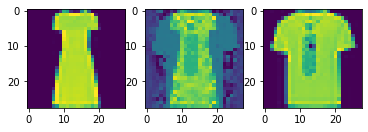

0.4236672520637512


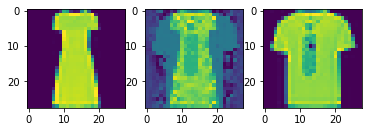

0.427334189414978


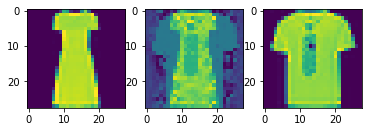

0.43081414699554443


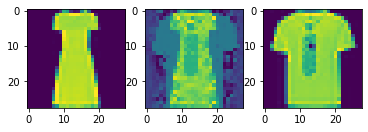

0.434103786945343


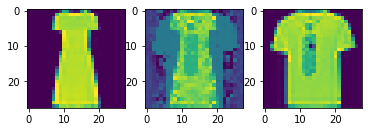

0.4372008442878723


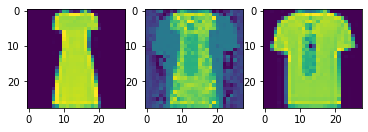

0.4401126205921173


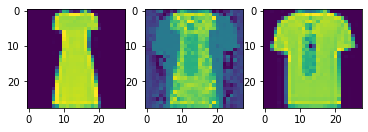

0.44283527135849


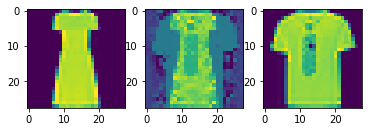

0.44537389278411865


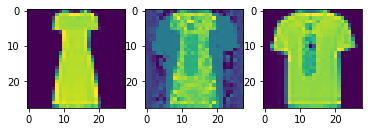

0.4477321207523346


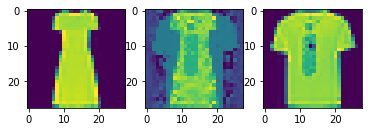

0.4499117434024811


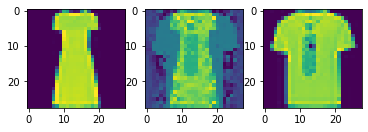

0.45191437005996704


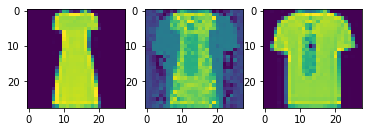

0.4537249803543091


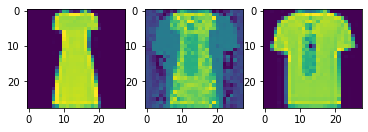

0.4553665220737457


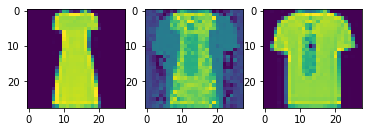

0.45683592557907104


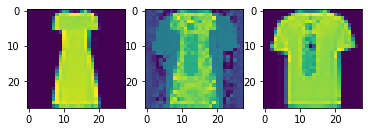

0.45812898874282837


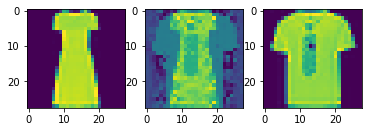

0.45923152565956116


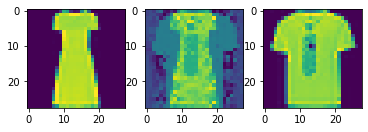

0.46013444662094116


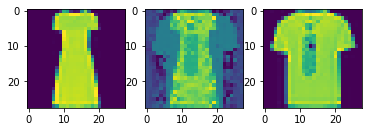

0.4608246982097626


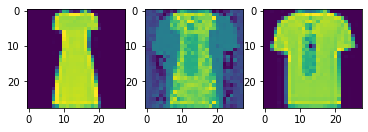

0.46130606532096863


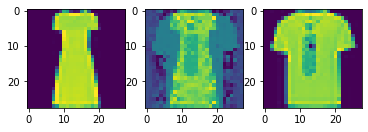

0.4615672826766968


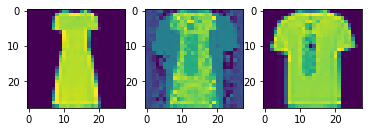

0.46160414814949036


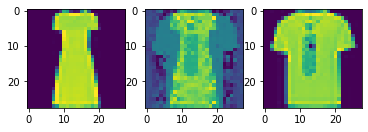

0.4614262878894806


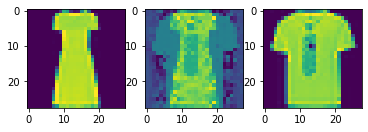

0.4610450267791748


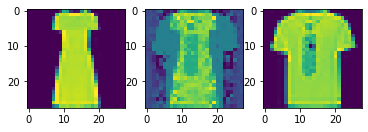

0.4604678750038147


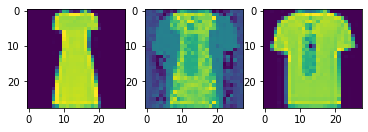

0.45972543954849243


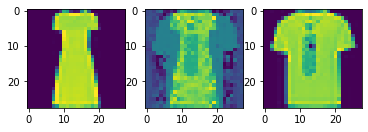

0.45881739258766174


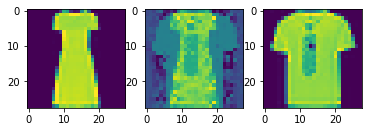

0.45773476362228394


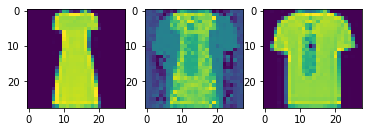

0.4564644396305084


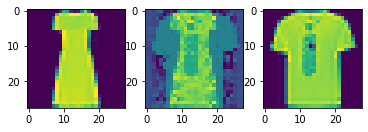

0.45502030849456787


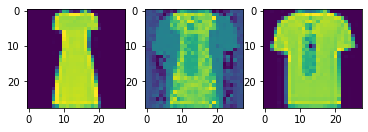

0.45341062545776367


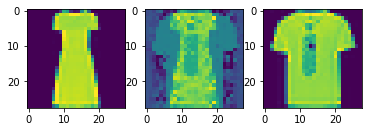

0.4516366720199585


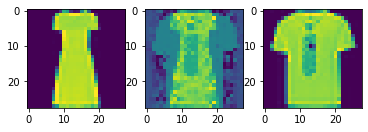

0.4497002959251404


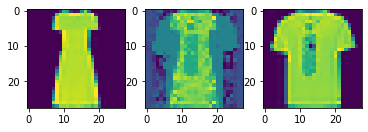

0.44760721921920776


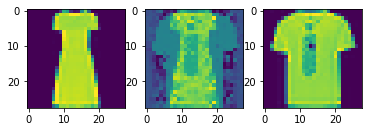

0.445361465215683


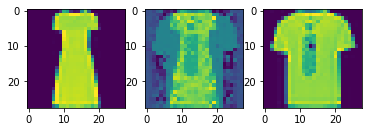

0.4429556131362915


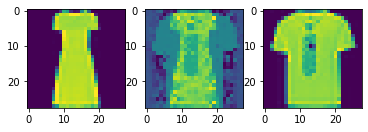

0.44039386510849


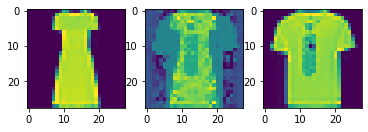

0.4376966655254364


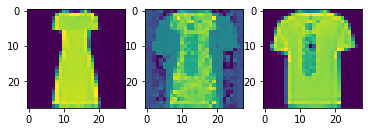

0.4348975718021393


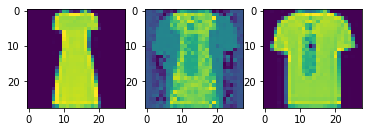

0.4320269227027893


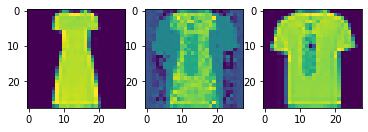

0.42909252643585205


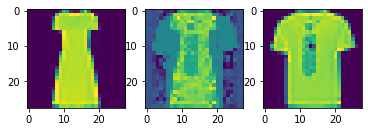

0.42609432339668274


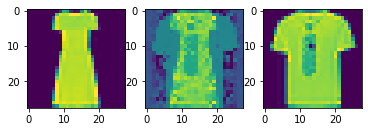

0.42303428053855896


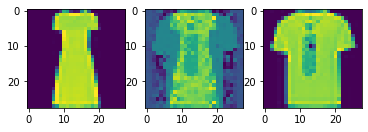

0.41991114616394043


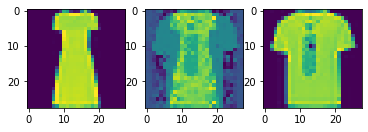

0.41673266887664795


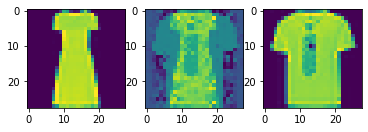

0.4134969115257263


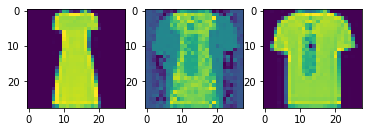

0.4101789891719818


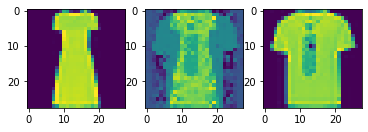

0.40679144859313965


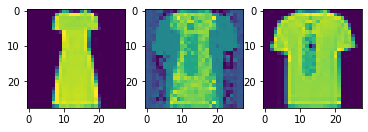

0.40332692861557007


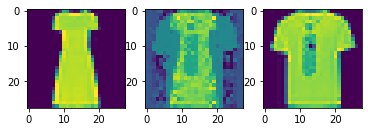

0.39978423714637756


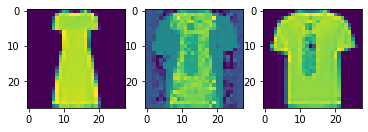

0.3961642384529114


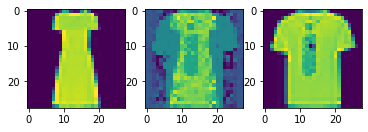

0.39247167110443115


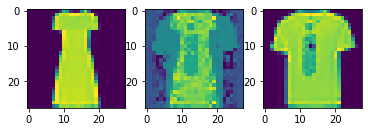

0.38868290185928345


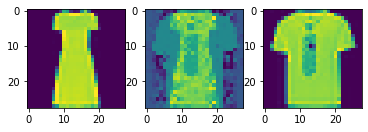

0.3848004937171936


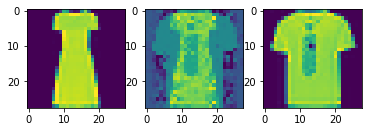

0.3808225989341736


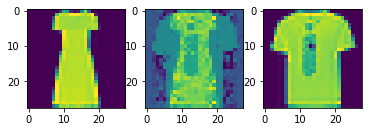

0.37676119804382324


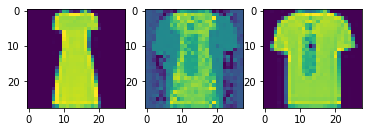

0.37262094020843506


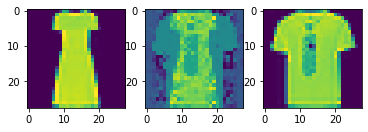

0.3684132397174835


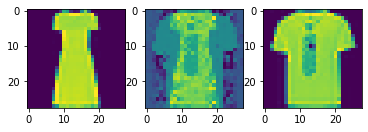

0.36414188146591187


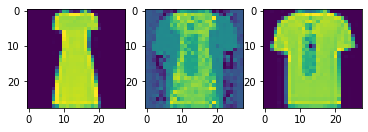

0.3598099946975708


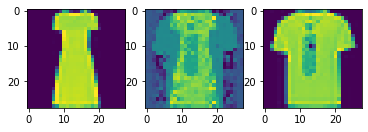

0.3554178774356842


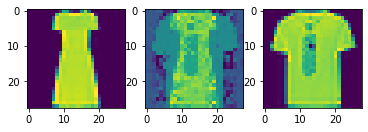

0.3509702682495117


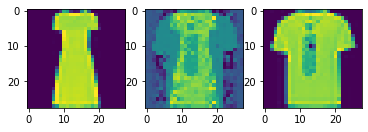

0.3464663028717041


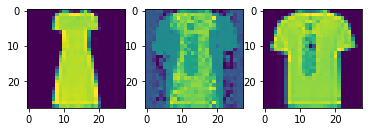

0.3419119119644165


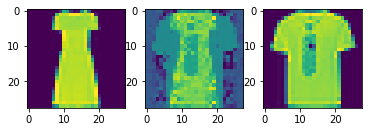

0.33730894327163696


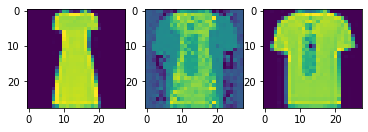

0.33266133069992065


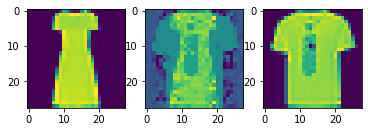

0.32798272371292114


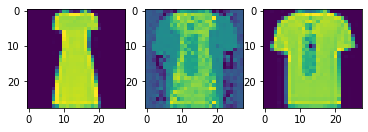

0.3232687711715698


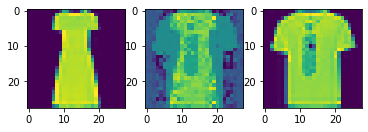

0.31852999329566956


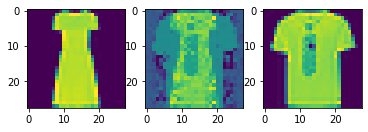

0.3137713670730591


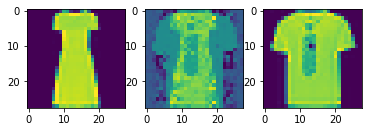

0.30899950861930847


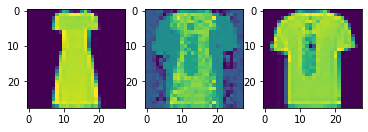

0.3042287230491638


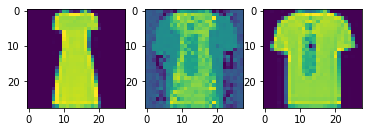

0.2994721829891205


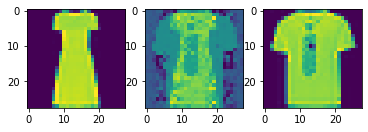

0.29471951723098755


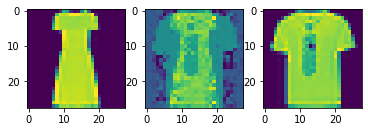

0.289980947971344


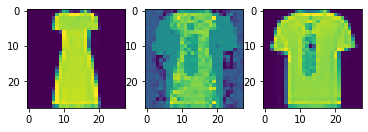

0.2852633595466614


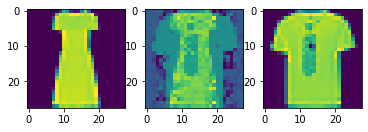

0.28059110045433044


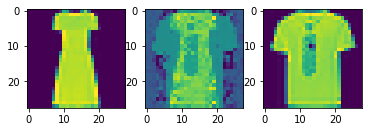

0.27595511078834534


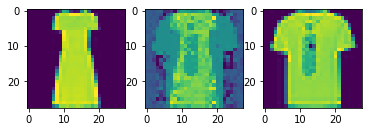

0.27136144042015076


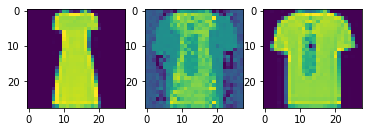

0.26681721210479736


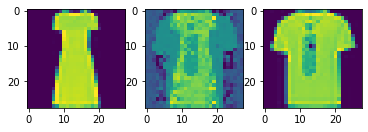

0.2623252272605896


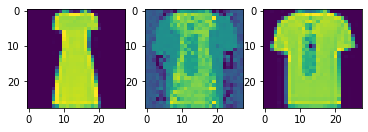

0.2579028308391571


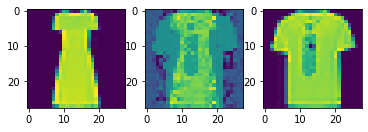

0.25355949997901917


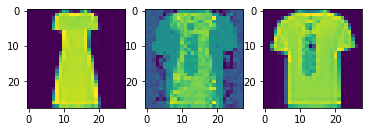

0.24928441643714905


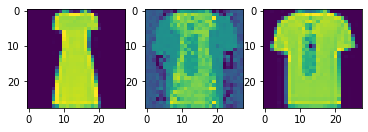

0.24509018659591675


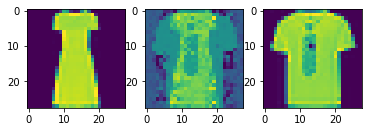

0.2409781515598297


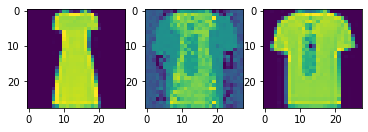

0.23694898188114166


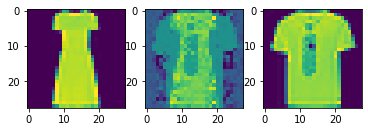

0.23301659524440765


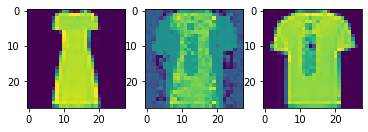

0.22917884588241577


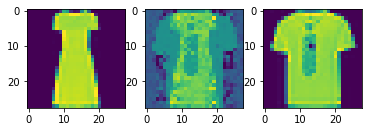

0.22543036937713623


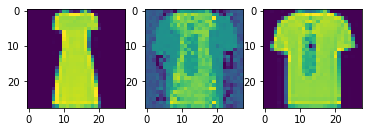

0.2217642068862915


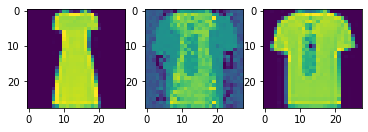

0.21817830204963684


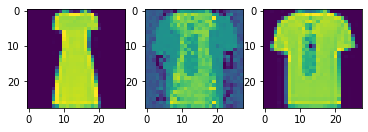

0.21466290950775146


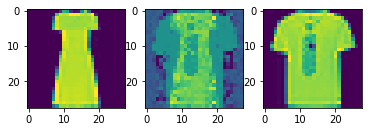

0.21121270954608917


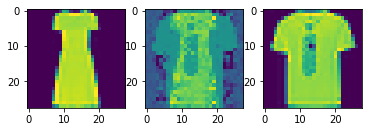

0.20783042907714844


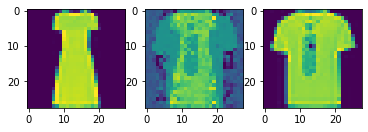

0.20452819764614105


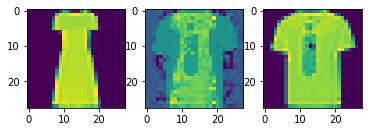

0.20131486654281616


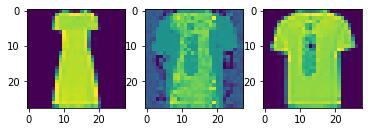

0.198194220662117


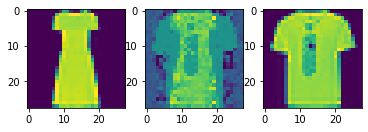

0.19516345858573914


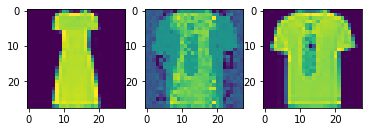

0.19222486019134521


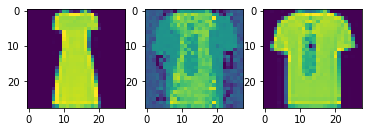

0.1893705278635025


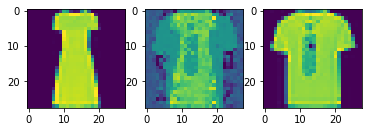

0.18661560118198395


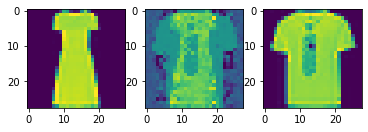

0.1839645802974701


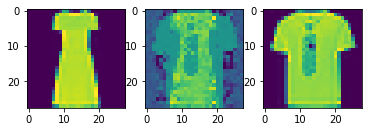

0.18142063915729523


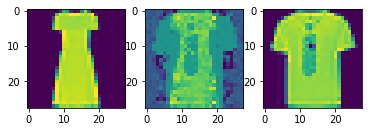

0.17897489666938782


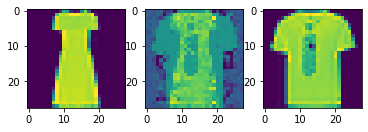

0.1766384392976761


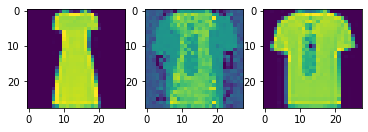

0.1743990182876587


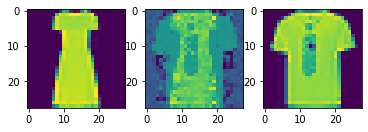

0.17225956916809082


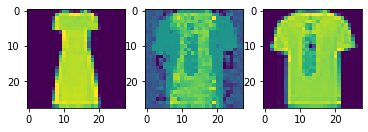

0.170217365026474


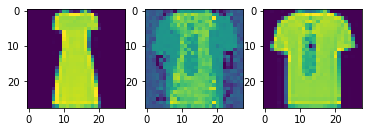

0.16826209425926208


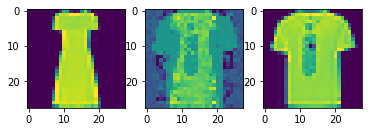

0.16639728844165802


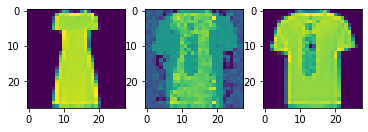

0.16461703181266785


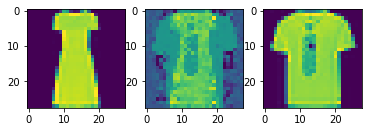

0.16293495893478394


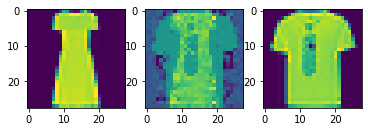

0.16134807467460632


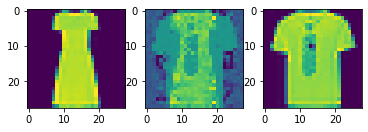

0.15984855592250824


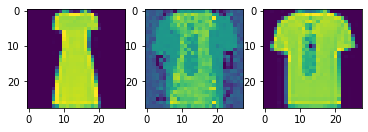

0.15843583643436432


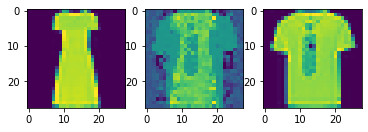

0.1570969820022583


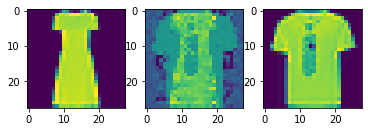

0.15583865344524384


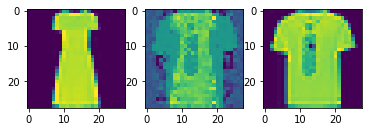

0.15465641021728516


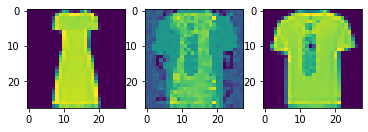

0.15355145931243896


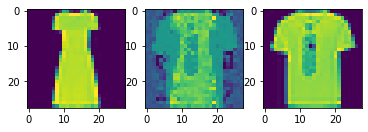

0.15251758694648743


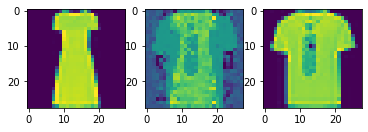

0.15155357122421265


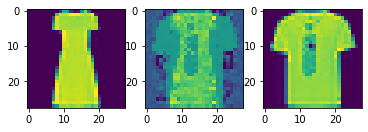

0.150678813457489


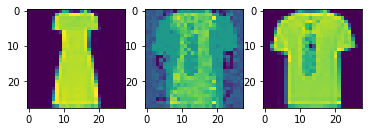

0.14988091588020325


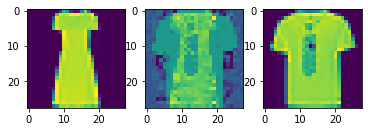

0.14915788173675537


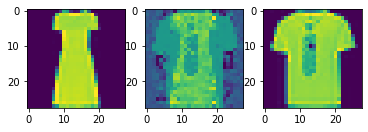

0.14851151406764984


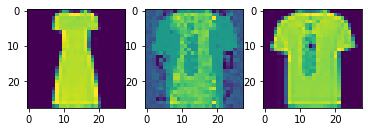

0.14794692397117615


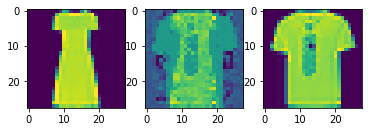

0.1474676877260208


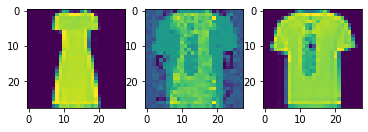

0.1470687985420227


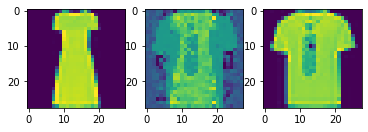

0.1467534452676773


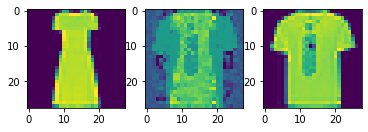

0.14652608335018158


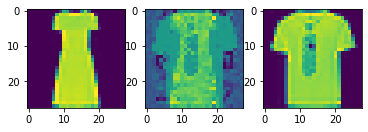

0.14638453722000122


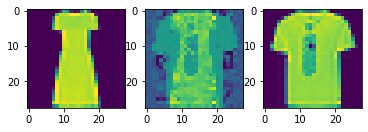

0.14632993936538696


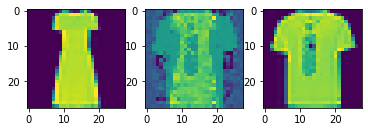

0.14636442065238953


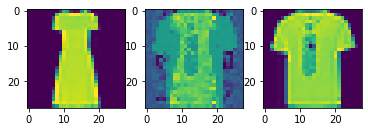

0.1464868187904358


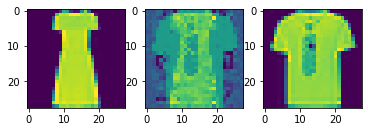

0.14670716226100922


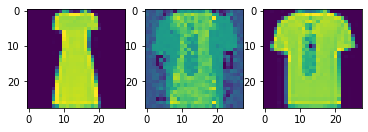

0.147015780210495


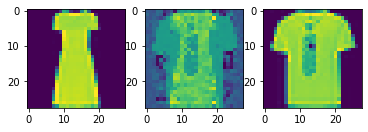

0.14741666615009308


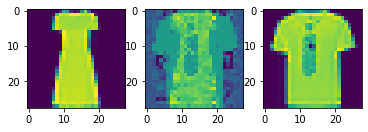

0.1478991061449051


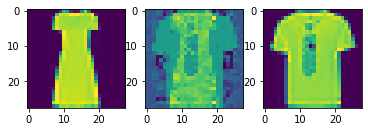

0.14845892786979675


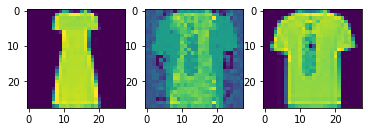

0.1490817368030548


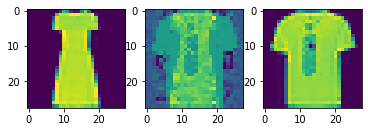

0.14976856112480164


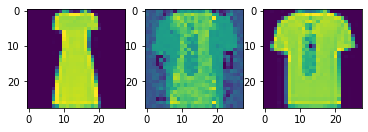

0.15051735937595367


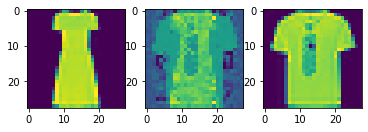

0.15133041143417358


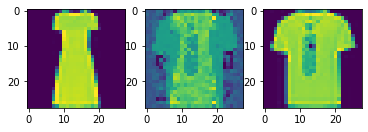

0.15220145881175995


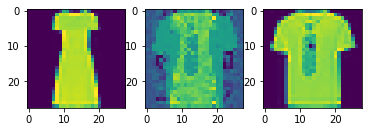

0.1531340777873993


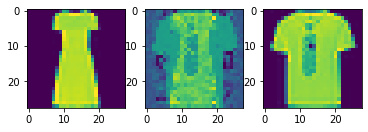

0.15412743389606476


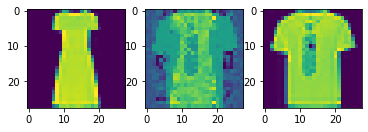

0.15518611669540405


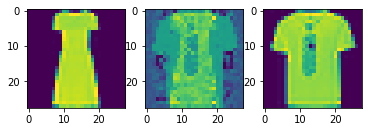

0.15631452202796936


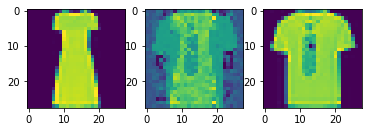

0.1575210690498352


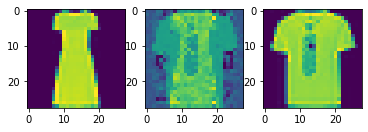

0.1588021218776703


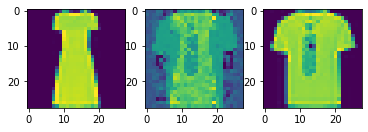

0.16016560792922974


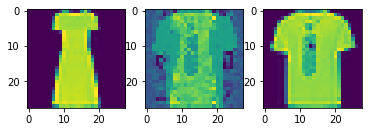

0.16159459948539734


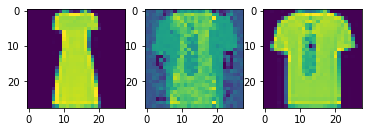

0.1630888432264328


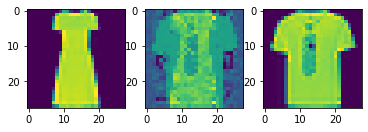

0.16463518142700195


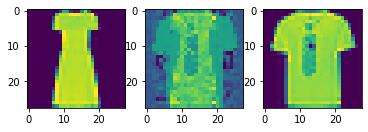

0.16623260080814362


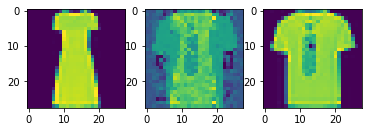

0.16786399483680725


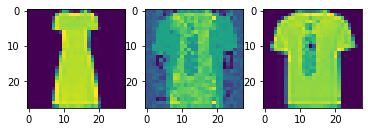

0.16953310370445251


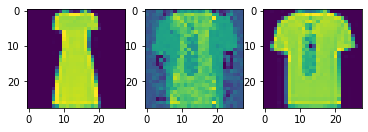

0.17123889923095703


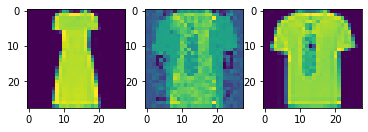

0.1729728877544403


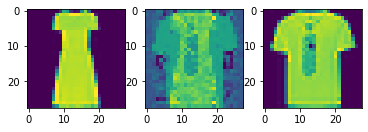

0.17473672330379486


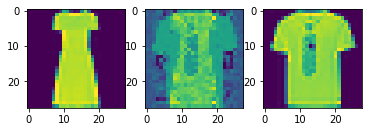

0.1765228509902954


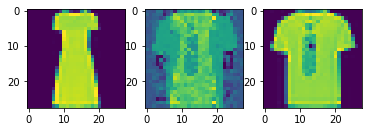

0.17833782732486725


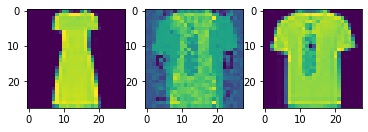

0.18016934394836426


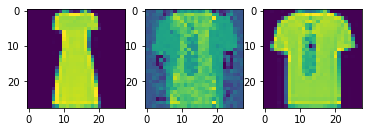

0.18201756477355957


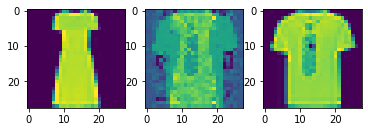

0.1838829517364502


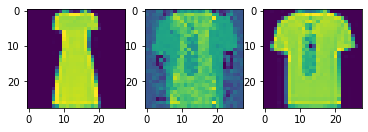

0.18576891720294952


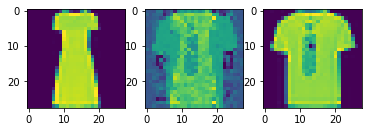

0.18768644332885742


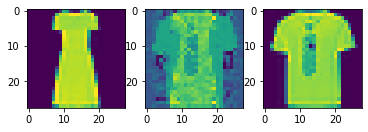

0.1896340250968933


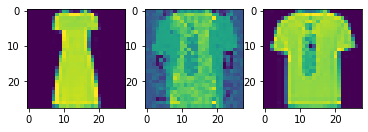

0.19161145389080048


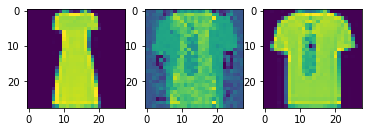

0.19361335039138794


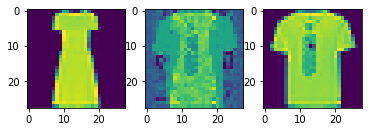

0.1956355720758438


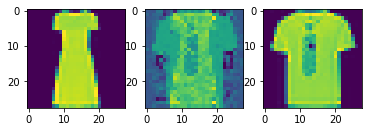

0.1976812481880188


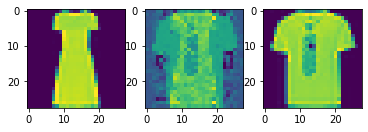

0.1997549682855606


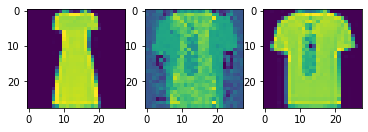

0.20185793936252594


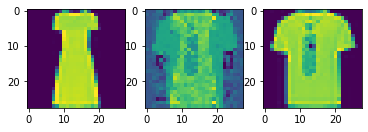

0.2039782702922821


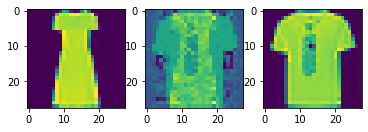

0.20611411333084106


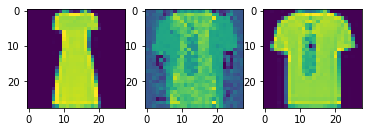

0.20824845135211945


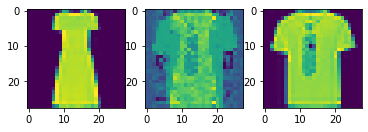

0.21037563681602478


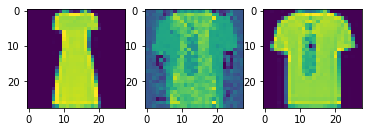

0.2125050127506256


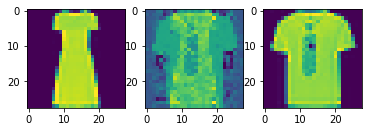

0.2146453708410263


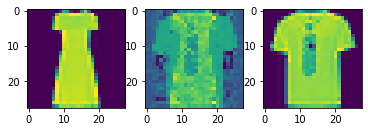

0.21679779887199402


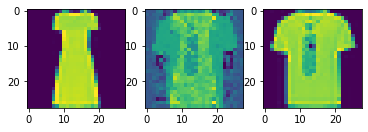

0.2189449667930603


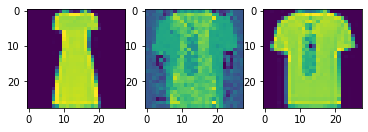

0.22108489274978638


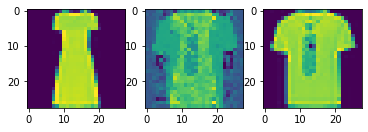

0.22322100400924683


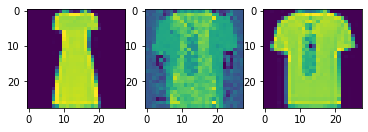

0.22535432875156403


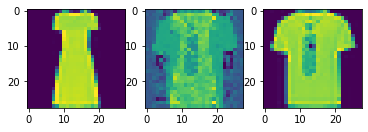

0.2274899184703827


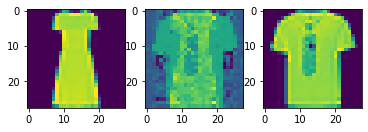

0.22962063550949097


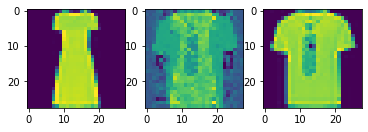

0.23174598813056946


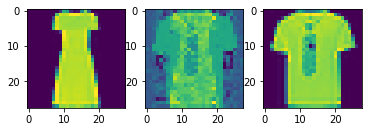

0.23386916518211365


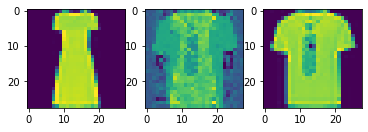

0.235984206199646


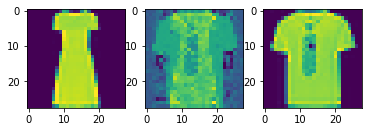

0.23808369040489197


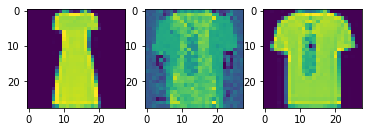

0.24017234146595


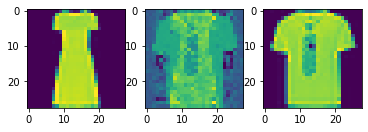

0.24225226044654846


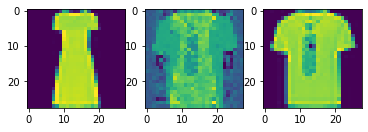

0.24432852864265442


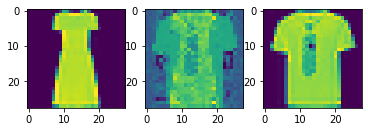

0.24640008807182312


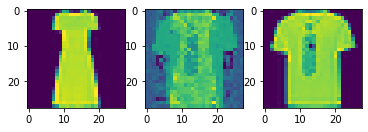

0.24846602976322174


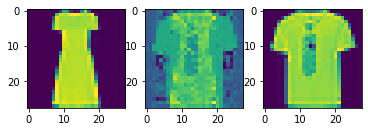

0.25052687525749207


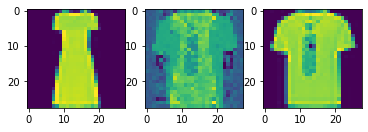

0.2525821626186371


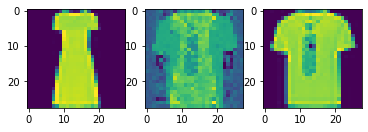

0.2546186149120331


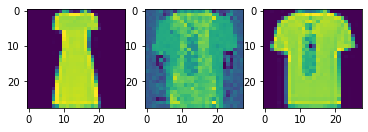

0.25664007663726807


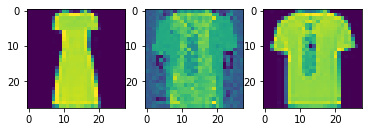

0.25865378975868225


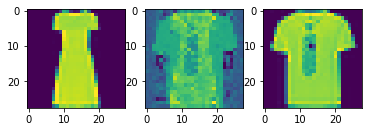

0.2606586515903473


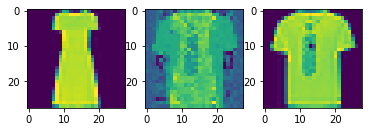

0.2626674175262451


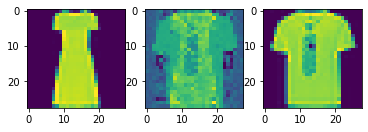

0.26467660069465637


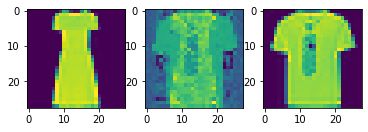

0.26669326424598694


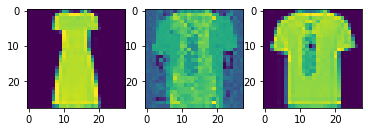

0.26870182156562805


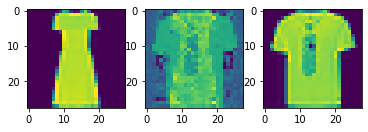

0.27069780230522156


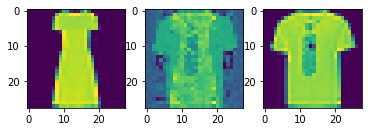

0.27268633246421814


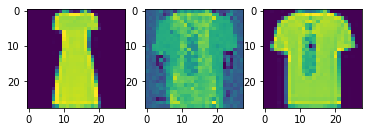

0.27466458082199097


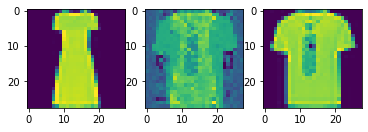

0.2766251564025879


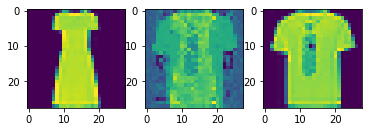

0.27857404947280884


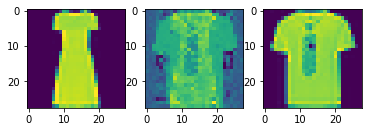

0.28050750494003296


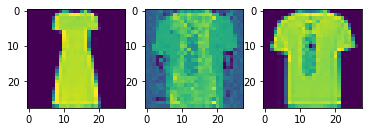

0.28242647647857666


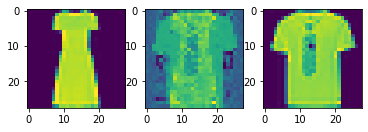

0.2843274176120758


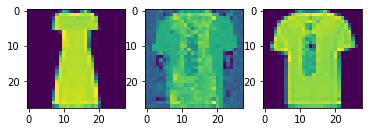

0.28620705008506775


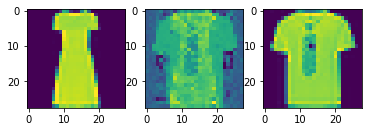

0.28805819153785706


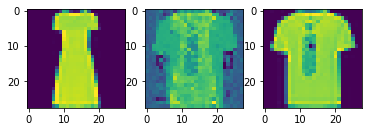

0.2898798882961273


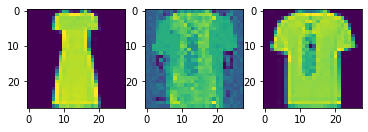

0.2916768193244934


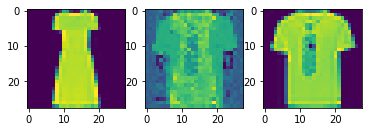

0.2934500277042389


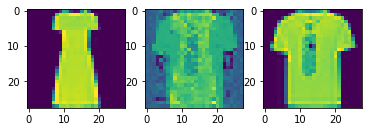

0.2952026128768921


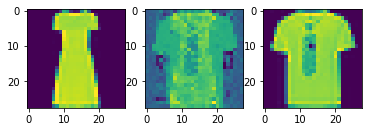

0.2969323694705963


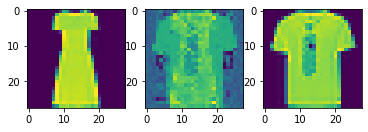

0.29864078760147095


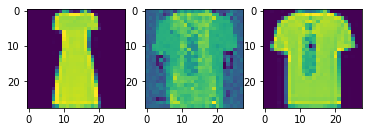

0.30032503604888916


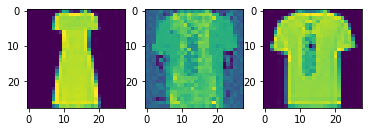

0.30198347568511963


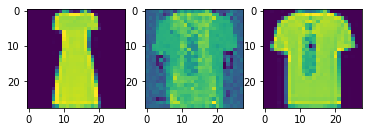

0.30361828207969666


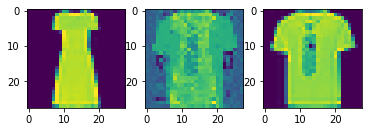

0.305229514837265


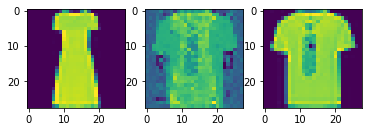

0.30682316422462463


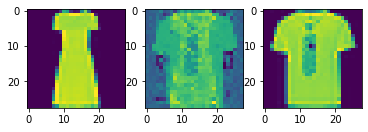

0.3084060847759247


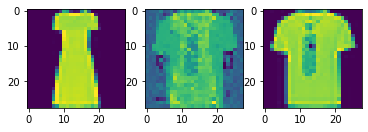

0.3099740743637085


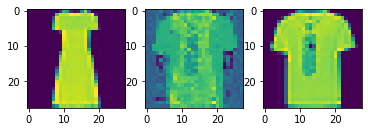

0.3115253448486328


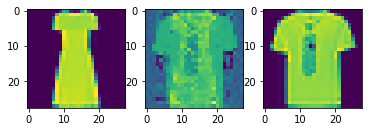

0.3130576014518738


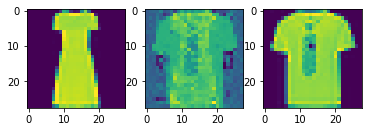

0.3145678639411926


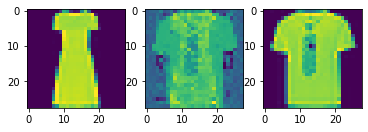

0.3160581588745117


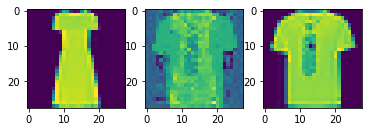

0.31753259897232056


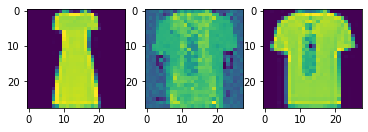

0.3189893662929535


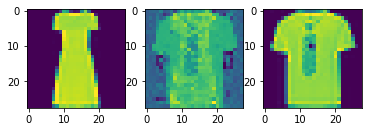

0.3204258382320404


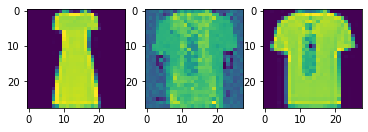

0.32184338569641113


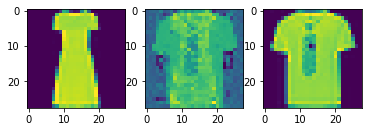

0.3232375979423523


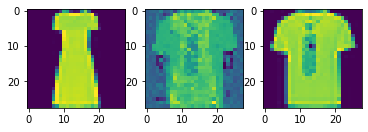

0.32459914684295654


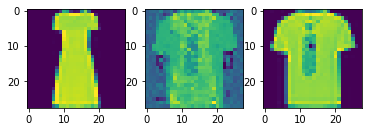

0.32593703269958496


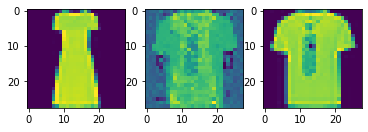

0.3272431790828705


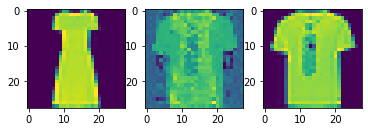

0.32852333784103394


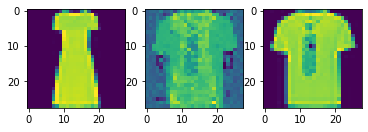

0.32977867126464844


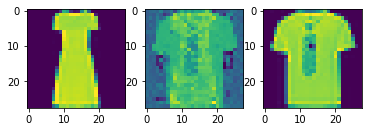

0.33100706338882446


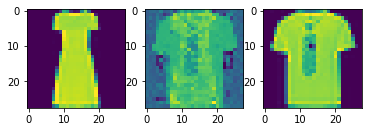

0.33221739530563354


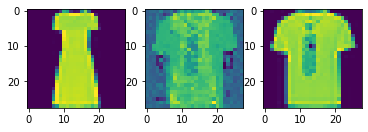

0.333406001329422


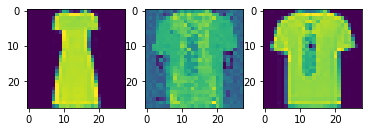

0.33456355333328247


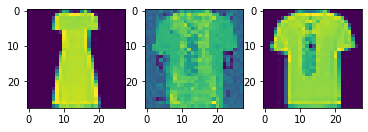

0.3356851041316986


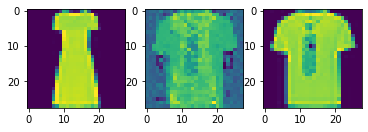

0.33677127957344055


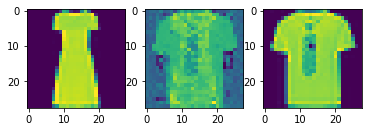

0.3378097414970398


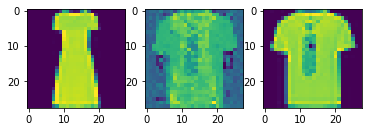

0.3388073444366455


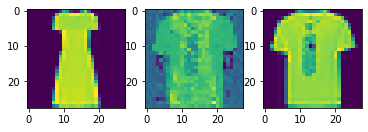

0.33975207805633545


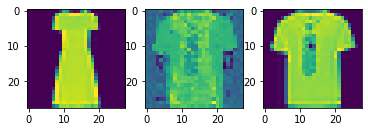

0.3406361937522888


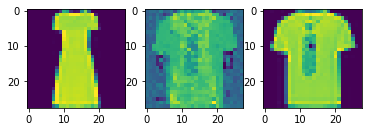

0.34145110845565796


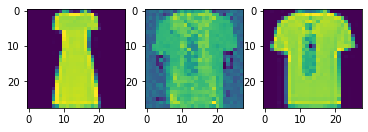

0.3421947956085205


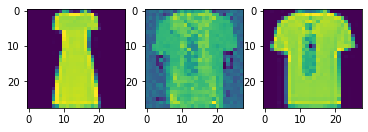

0.3428648114204407


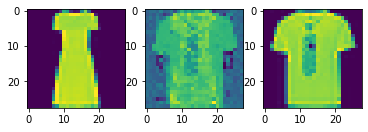

0.34345555305480957


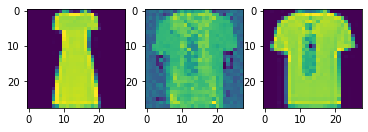

0.3439720869064331


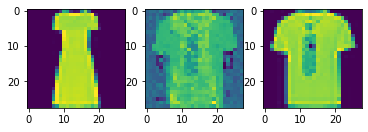

0.3444206416606903


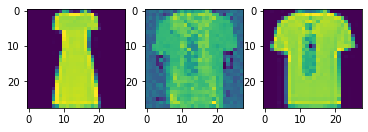

0.3448062539100647


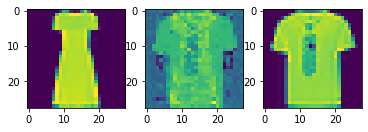

0.34513145685195923


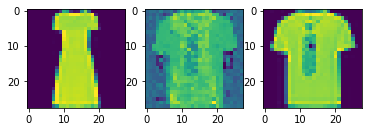

0.3453977108001709


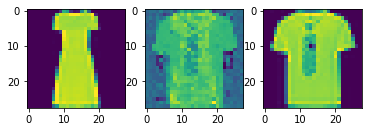

0.3456096053123474


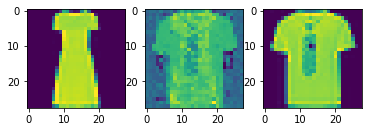

0.34576690196990967


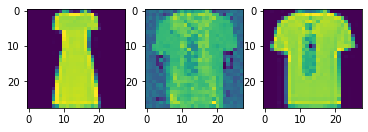

0.34586986899375916


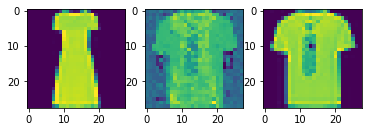

0.345892995595932


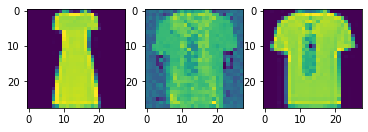

0.34583714604377747


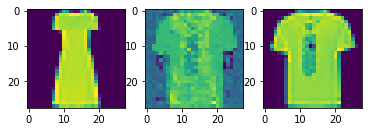

0.34570181369781494


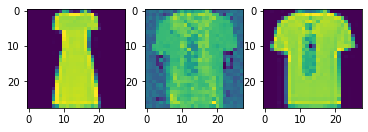

0.3454914689064026


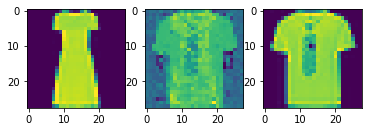

0.3452184200286865


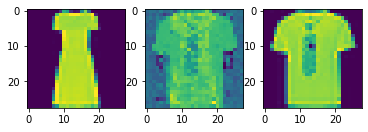

0.34488600492477417


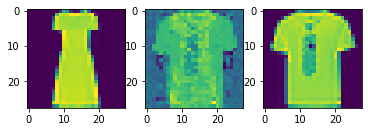

0.34449511766433716


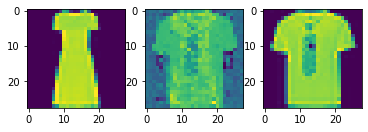

0.3440459072589874


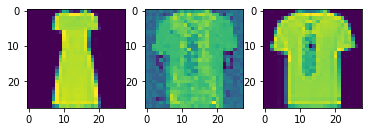

0.3435311019420624


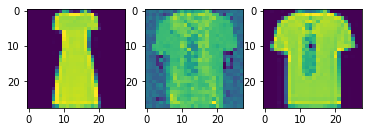

0.3429511487483978


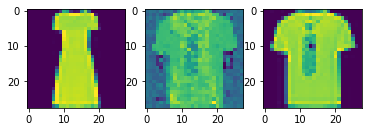

0.34231036901474


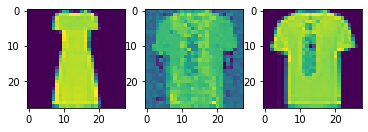

0.3415995240211487


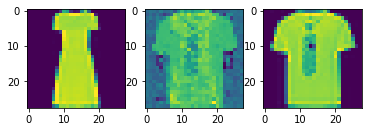

0.3408184349536896


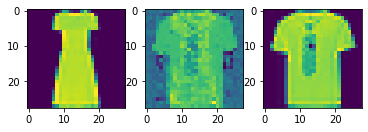

0.33997565507888794


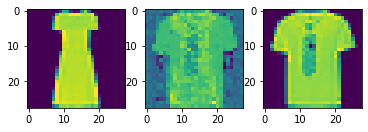

0.3390766978263855


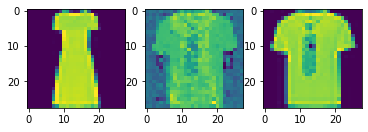

0.3381229341030121


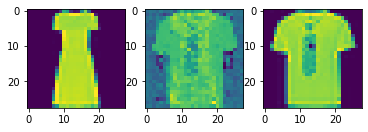

0.33711495995521545


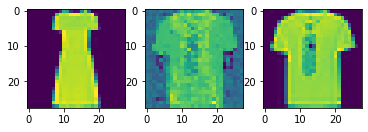

0.3360540270805359


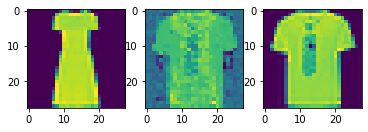

0.3349373936653137


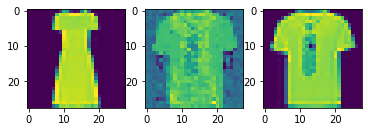

0.33376479148864746


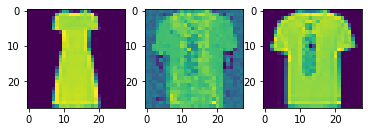

0.33254024386405945


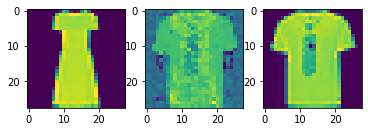

0.3312666416168213


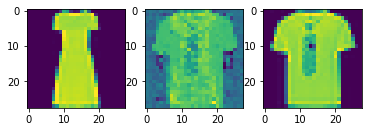

0.3299429714679718


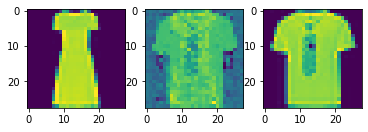

0.328580379486084


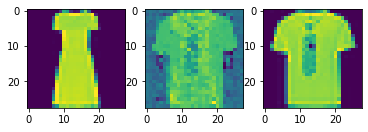

0.32717961072921753


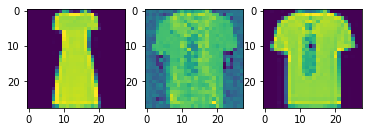

0.3257557153701782


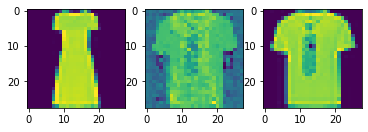

0.3243076503276825


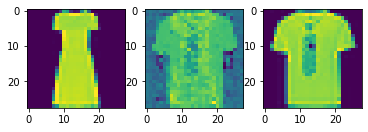

0.3228437900543213


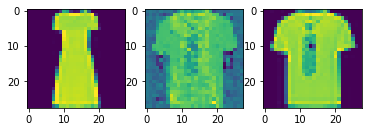

0.32135459780693054


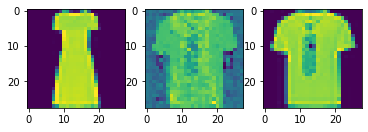

0.31985074281692505


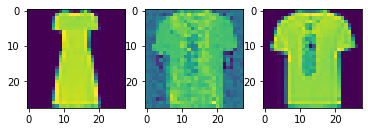

0.31833335757255554


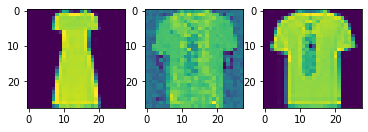

0.3168089985847473


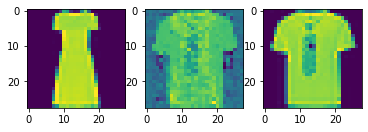

0.3152780532836914


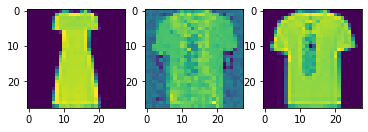

0.31373846530914307


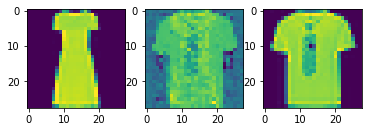

0.3121921420097351


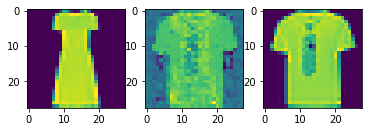

0.31064245104789734


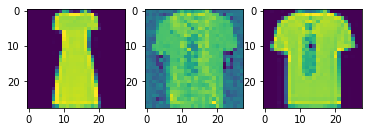

0.3090897798538208


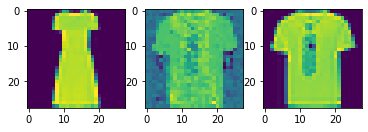

0.3075401782989502


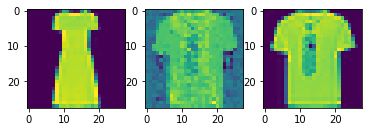

0.30600279569625854


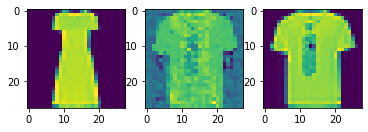

0.3044731616973877


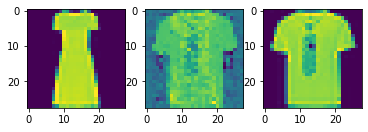

0.30294761061668396


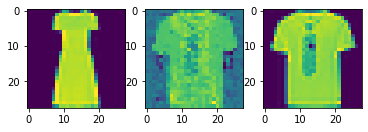

0.30142420530319214


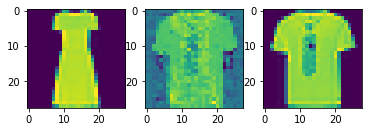

0.29990115761756897


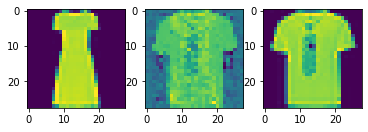

0.2983770966529846


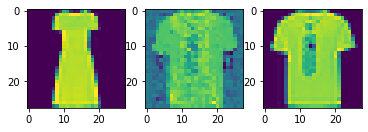

0.2968546152114868


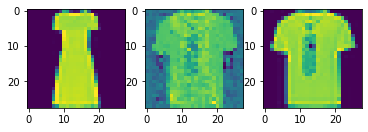

tensor([[ 32.9497, -18.1977,  -4.9641, -42.1747, -17.5274,   4.5223,  14.6074,
         -19.0138, -13.5118, -34.9775]], grad_fn=<AddmmBackward>) 3 0


In [177]:
#Experiment 1

import matplotlib.pyplot as plt
cf_before = cf_image.detach().clone().numpy()
cf_image_copy = cf_image.detach().clone().numpy()
for i in range(500):
    output = model(cf_image.unsqueeze(0))
#     print(query_label.unsqueeze(0))
    loss_cf = pdist(cf_image, query_image).sum() - 0.1*error(output, torch.tensor(cf_label).unsqueeze(0))
#     print(loss_cf)
    loss_cf.backward()
    optimizer_cf.step()
    diff = cf_image.detach().numpy() - cf_before
    print(diff.sum().item())
    cf_before = cf_image.detach().clone().numpy()
    plt.figure()
    plt.subplot(1,3,1)
    plt.imshow(cf_image_copy[0,:,:])
    plt.subplot(1,3,2)
#     plt.imshow(diff[0,:,:])
    plt.imshow(cf_image.detach().clone().numpy()[0,:,:])
    plt.subplot(1,3,3)
    plt.imshow(query_image[0,:,:])
    plt.show()
    
print(model(cf_image.unsqueeze(0)), cf_label, query_label)

-0.04599884897470474


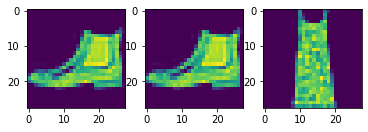

-0.031371887773275375


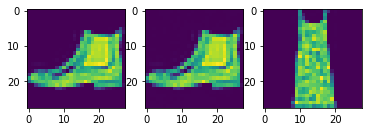

-0.02463204599916935


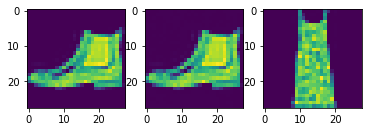

-0.020891591906547546


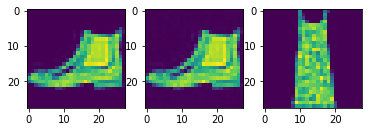

-0.01740284264087677


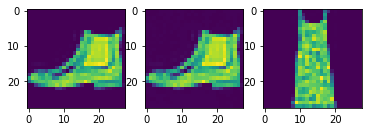

-0.016070708632469177


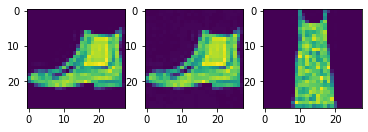

-0.014222744852304459


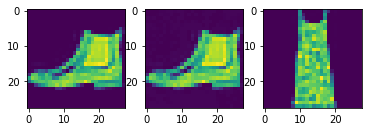

-0.01418595016002655


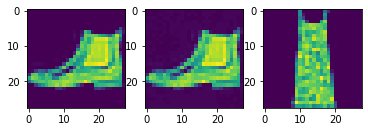

-0.014428853988647461


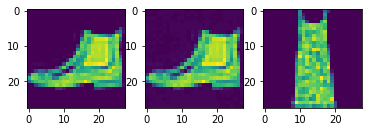

-0.014879714697599411


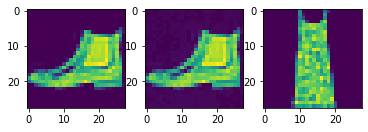

-0.015380270779132843


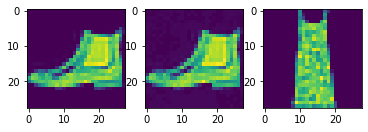

-0.01585765928030014


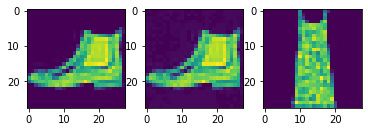

-0.015930216759443283


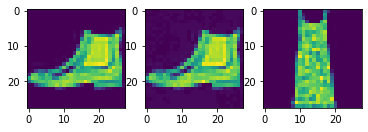

-0.01549086719751358


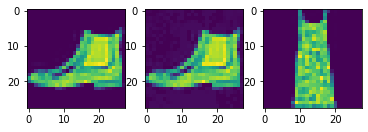

-0.015654459595680237


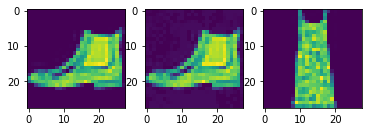

-0.01749524101614952


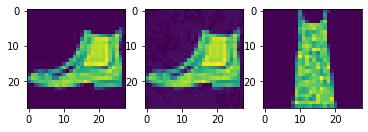

-0.019635334610939026


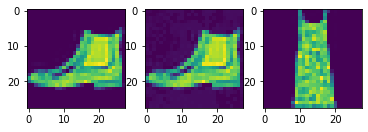

-0.02049563080072403


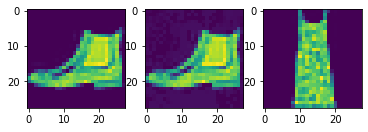

-0.021154988557100296


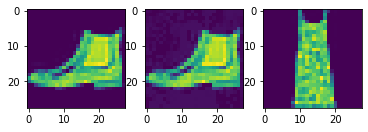

-0.022213932126760483


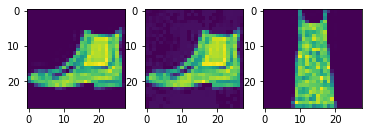

-0.02401718869805336


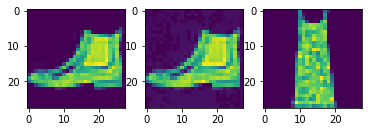

-0.026403844356536865


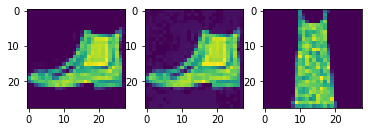

-0.028672657907009125


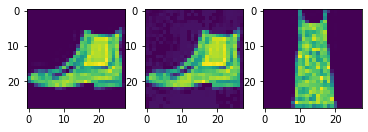

-0.031034663319587708


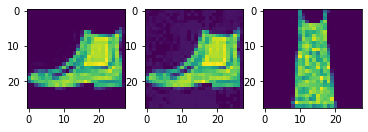

-0.03362546116113663


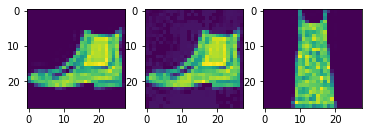

-0.036215271800756454


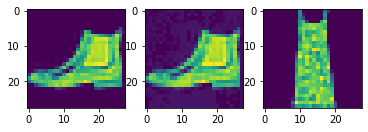

-0.03842737525701523


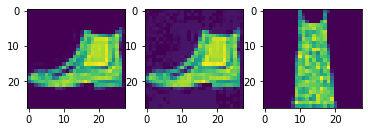

-0.04054495692253113


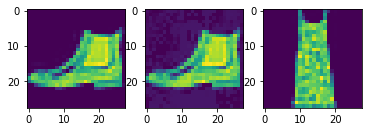

-0.04254037141799927


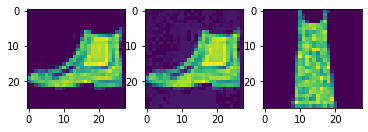

-0.044672172516584396


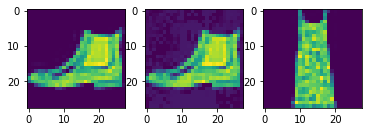

-0.047239791601896286


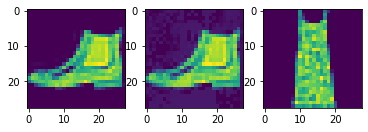

-0.0502765029668808


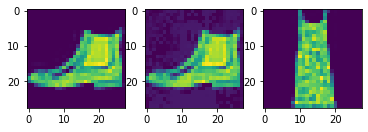

-0.05374439060688019


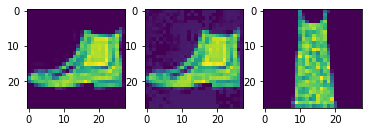

-0.05735994130373001


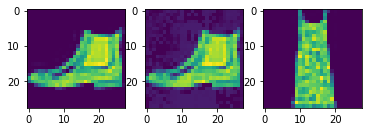

-0.06085320562124252


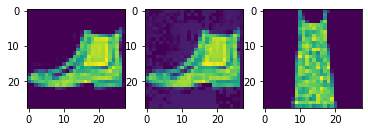

-0.06402240693569183


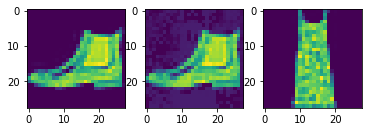

-0.0666545033454895


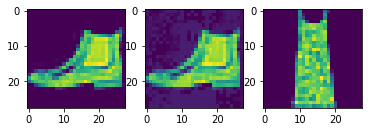

-0.06856685131788254


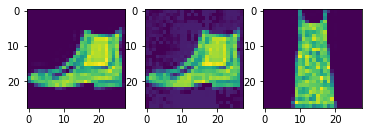

-0.06961763650178909


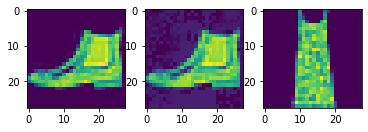

-0.06973867863416672


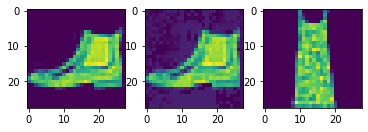

-0.0690118819475174


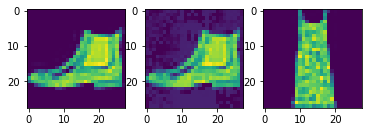

-0.06782495975494385


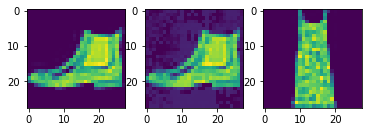

-0.0662870854139328


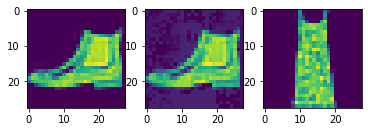

-0.06466567516326904


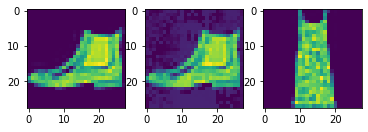

-0.06285786628723145


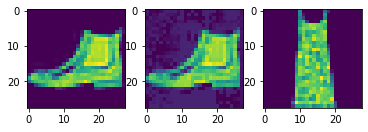

-0.06096533313393593


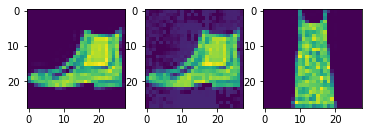

-0.05907386541366577


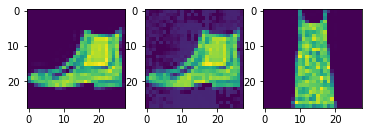

-0.057277824729681015


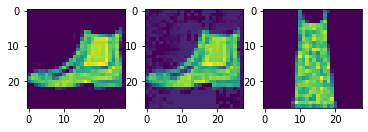

-0.05557321757078171


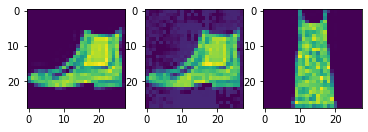

-0.05392543599009514


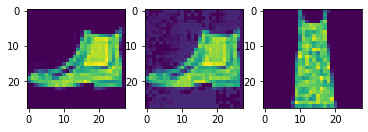

-0.05235022306442261


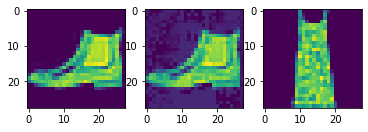

-0.05099033936858177


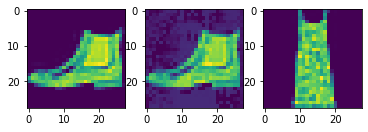

-0.04984224960207939


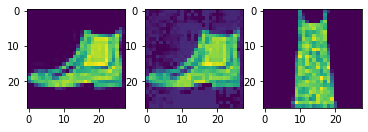

-0.04885579273104668


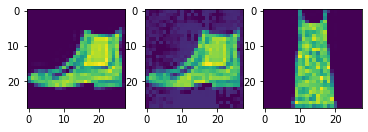

-0.048008762300014496


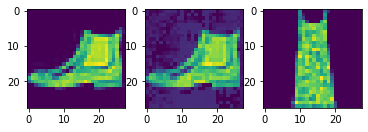

-0.047299858182668686


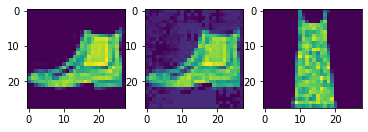

-0.046736348420381546


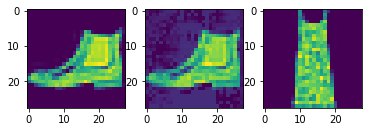

-0.04631751775741577


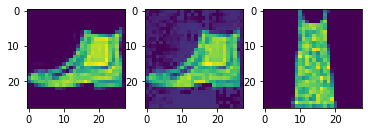

-0.046038415282964706


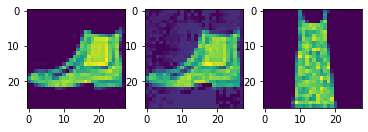

-0.04592442139983177


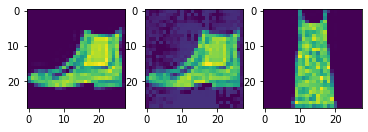

-0.045968376100063324


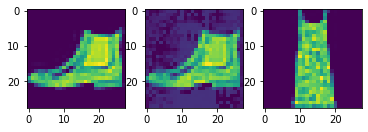

-0.046126075088977814


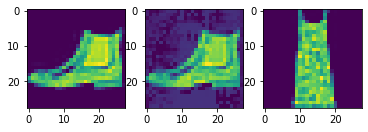

-0.046411219984292984


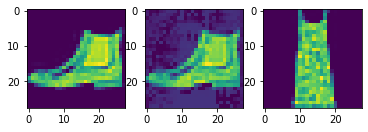

-0.046759702265262604


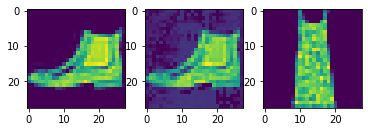

-0.047142043709754944


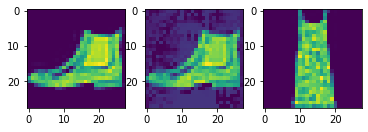

-0.047533340752124786


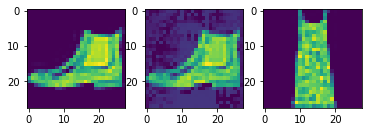

-0.04789239540696144


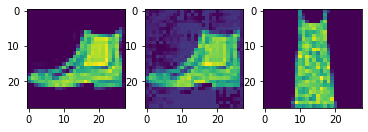

-0.04822035878896713


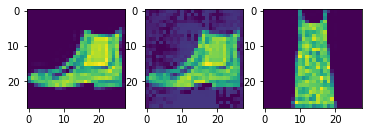

-0.04847108572721481


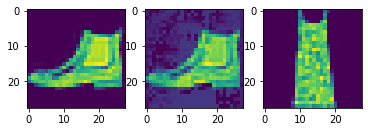

-0.048607565462589264


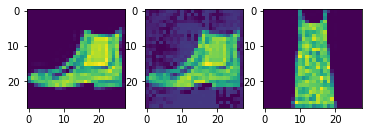

-0.0485709048807621


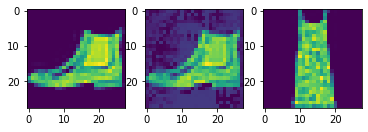

-0.048373252153396606


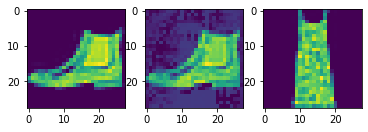

-0.048024166375398636


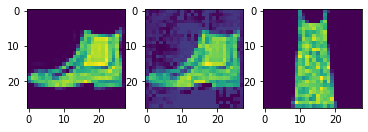

-0.047587212175130844


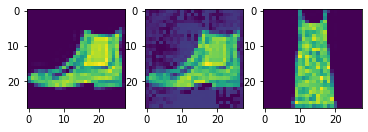

-0.04708639904856682


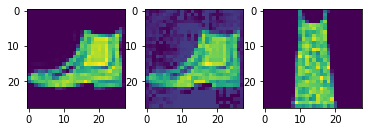

-0.04653976485133171


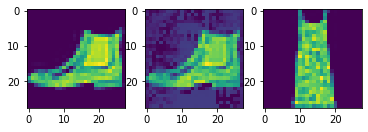

-0.04599631950259209


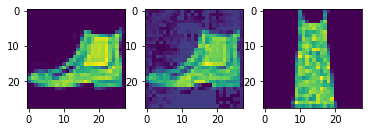

-0.045495763421058655


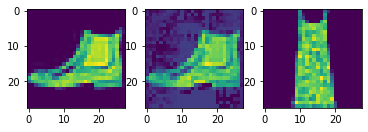

-0.04498298093676567


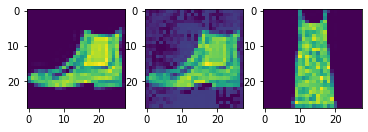

-0.04446088522672653


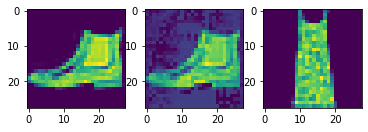

-0.04396884888410568


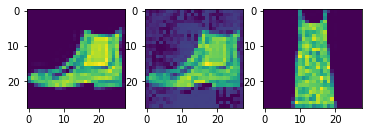

-0.04348962381482124


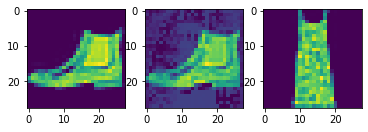

-0.043015144765377045


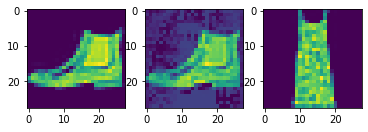

-0.04256518930196762


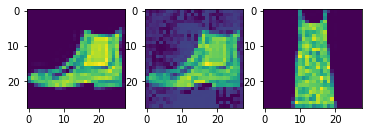

-0.04215676710009575


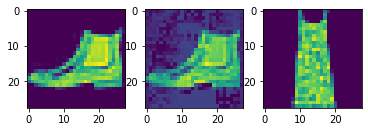

-0.04178769886493683


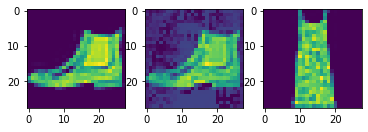

-0.04141697287559509


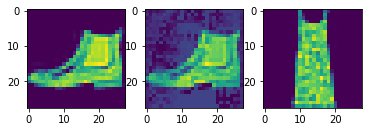

-0.0410381443798542


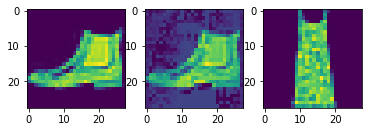

-0.040640316903591156


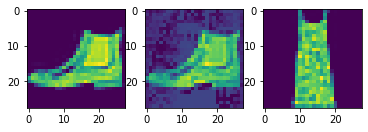

-0.04020288586616516


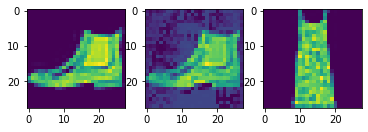

-0.03972998261451721


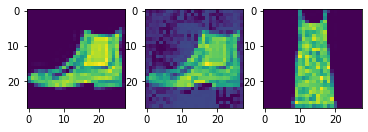

-0.03921294957399368


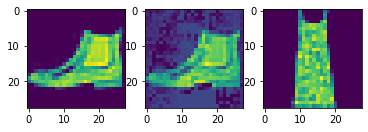

-0.03861512243747711


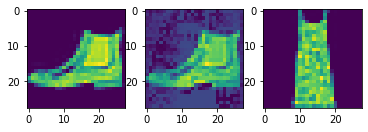

-0.03795274347066879


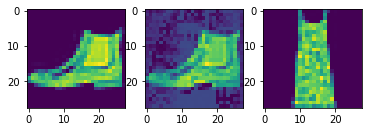

-0.03721027821302414


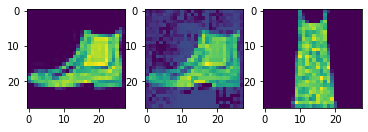

-0.03640010952949524


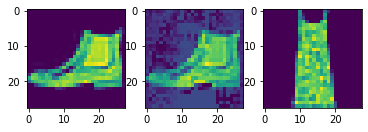

-0.03553895652294159


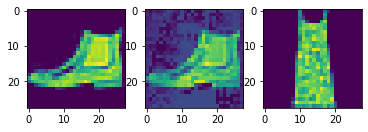

-0.034651242196559906


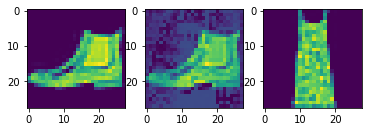

-0.03375900164246559


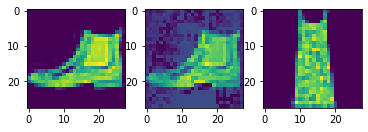

-0.032869599759578705


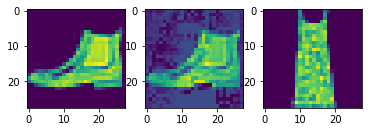

-0.031994156539440155


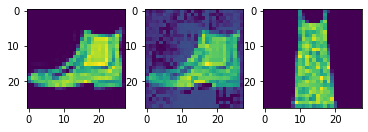

-0.031146787106990814


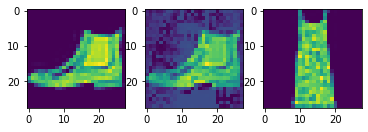

-0.03030066192150116


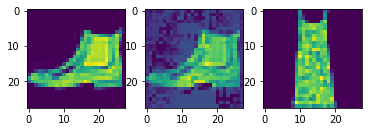

-0.02951129525899887


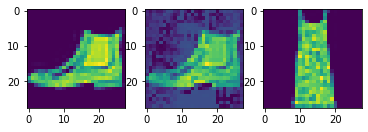

-0.02877601608633995


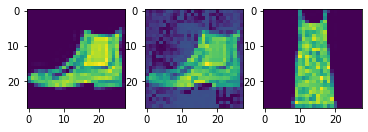

-0.028139647096395493


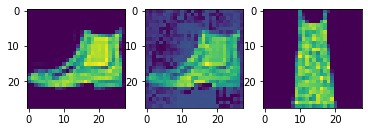

-0.027601193636655807


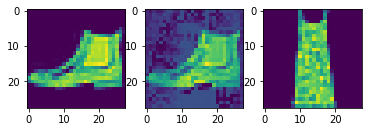

-0.027180522680282593


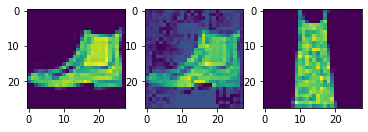

-0.026905406266450882


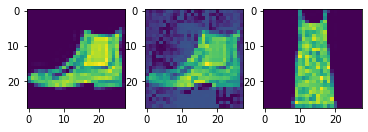

-0.026811007410287857


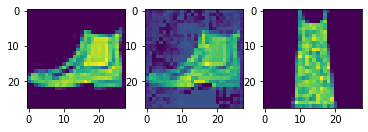

-0.026871249079704285


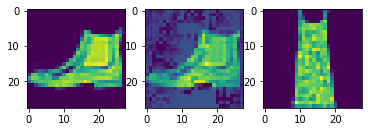

-0.027062326669692993


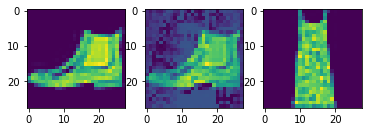

-0.027372941374778748


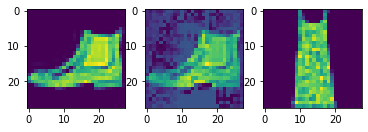

-0.027795452624559402


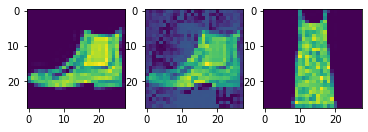

-0.028298966586589813


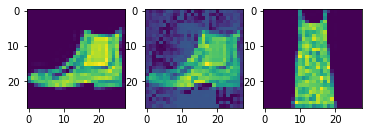

-0.028884172439575195


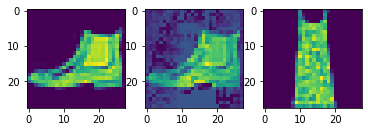

-0.02956584095954895


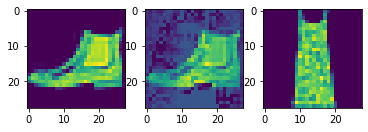

-0.030318044126033783


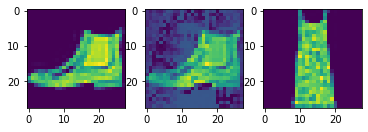

-0.03118056058883667


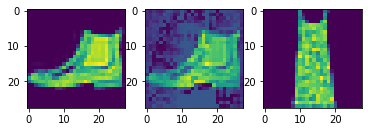

-0.032141465693712234


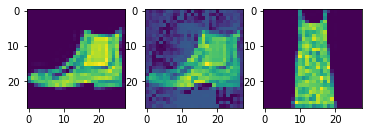

-0.033255476504564285


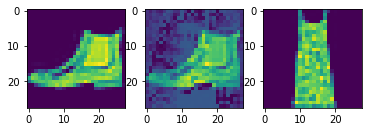

-0.034516990184783936


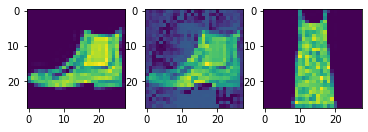

-0.03591384366154671


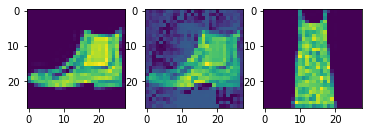

-0.03745710849761963


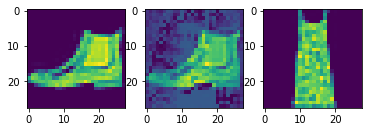

-0.039128612726926804


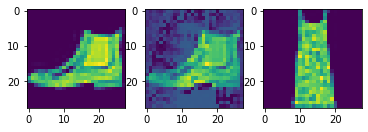

-0.04090530425310135


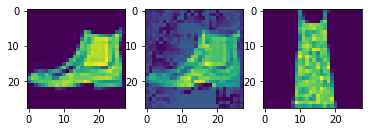

-0.04273252934217453


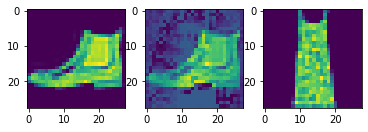

-0.04457893967628479


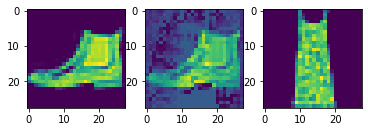

-0.04643101990222931


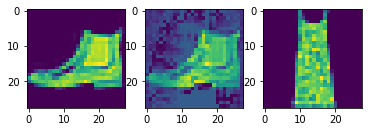

-0.04826892539858818


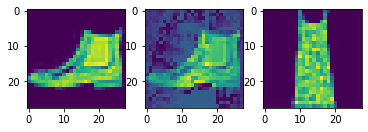

-0.050086669623851776


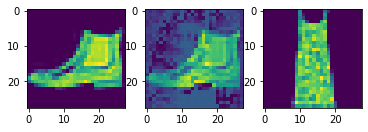

-0.05186231806874275


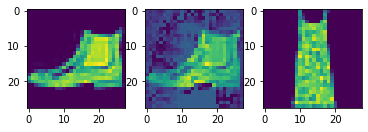

-0.05359123647212982


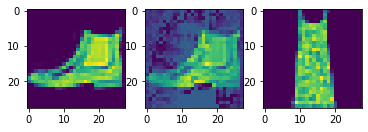

-0.05528033524751663


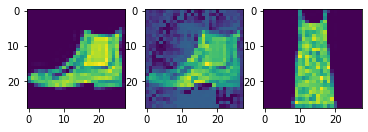

-0.056919366121292114


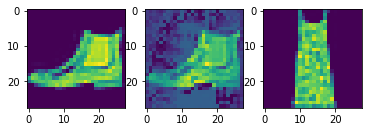

-0.058528486639261246


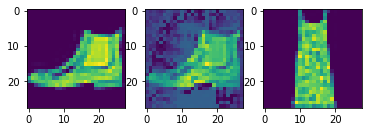

-0.06014562025666237


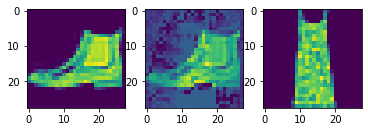

-0.06177336722612381


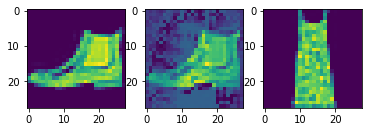

-0.0634210854768753


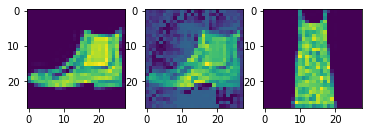

-0.06505630910396576


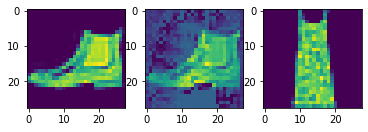

-0.06668881326913834


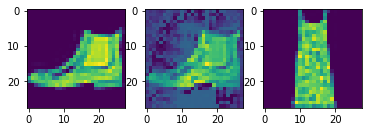

-0.06834615767002106


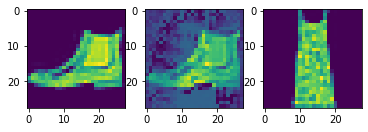

-0.07003216445446014


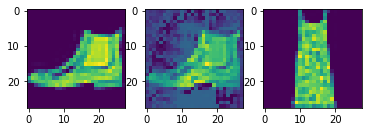

-0.07172830402851105


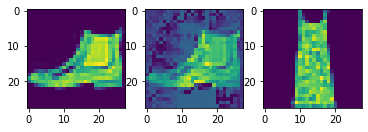

-0.07341332733631134


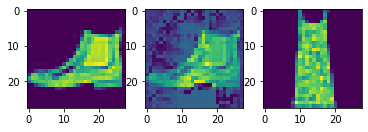

-0.07508085668087006


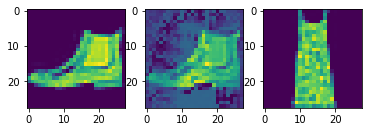

-0.07674586772918701


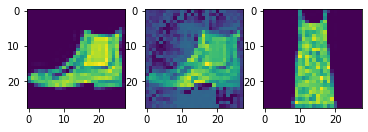

-0.07840782403945923


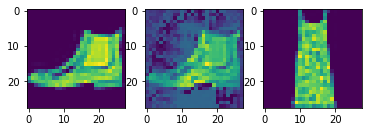

-0.0800633430480957


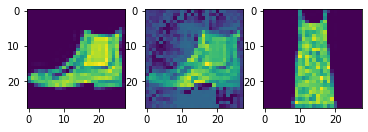

-0.08170682191848755


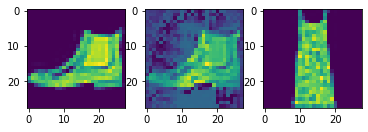

-0.0833355188369751


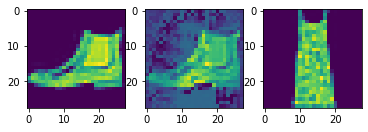

-0.08494967222213745


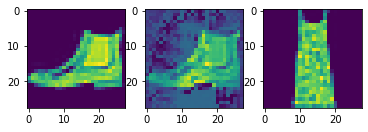

-0.08655254542827606


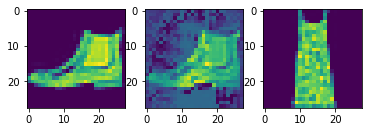

-0.08814509212970734


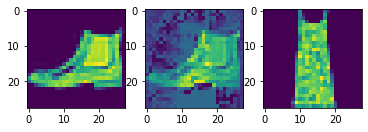

-0.08971860259771347


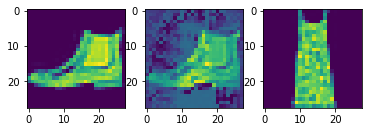

-0.0912780910730362


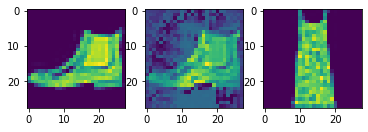

-0.09281717240810394


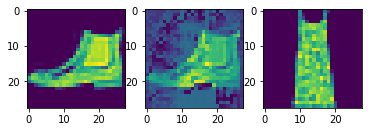

-0.09432321786880493


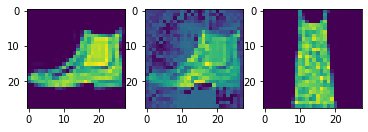

-0.09579287469387054


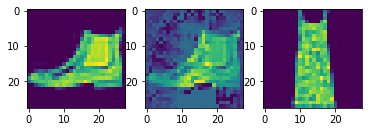

-0.09722603112459183


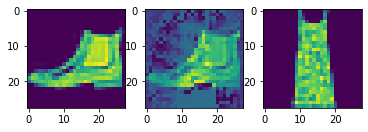

-0.09860746562480927


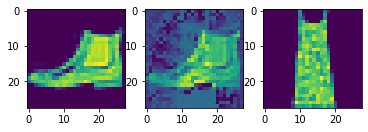

-0.09992952644824982


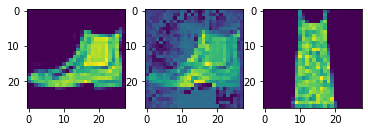

-0.10118792951107025


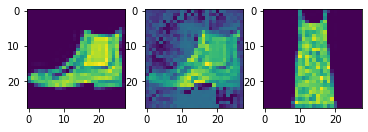

-0.10237421095371246


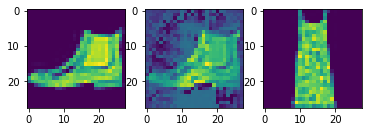

-0.10348212718963623


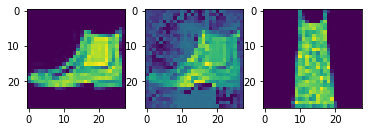

-0.10451267659664154


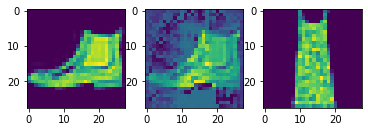

-0.10546255111694336


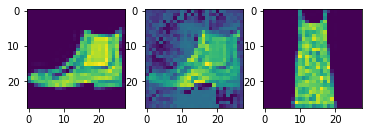

-0.10633254796266556


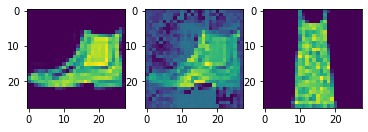

-0.10713019967079163


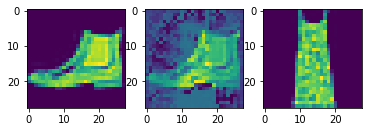

-0.10785125195980072


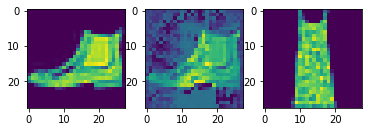

-0.10848736763000488


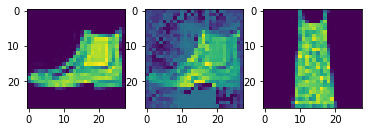

-0.10903330147266388


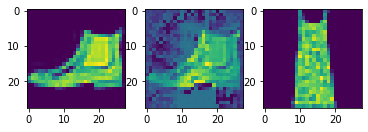

-0.10950319468975067


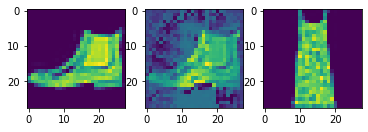

-0.10989193618297577


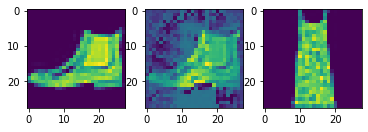

-0.11022640764713287


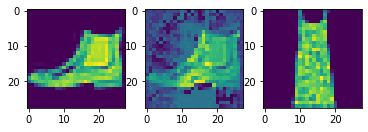

-0.11051563173532486


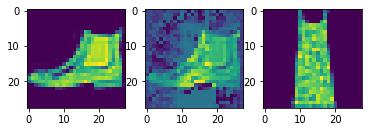

-0.11075377464294434


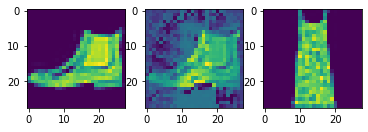

-0.11094943434000015


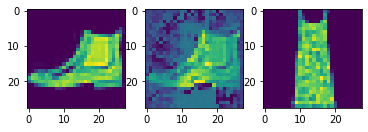

-0.11110667884349823


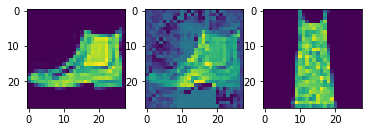

-0.11122667789459229


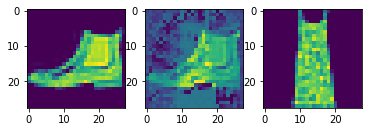

-0.11130426079034805


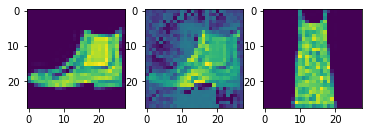

-0.11133203655481339


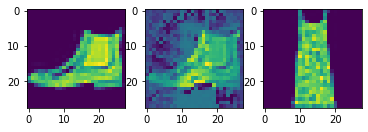

-0.11131270229816437


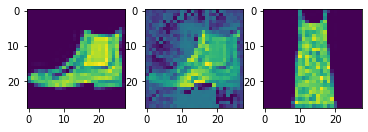

-0.11125797778367996


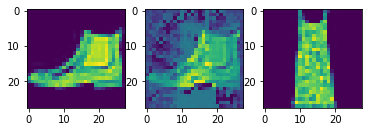

-0.1111697107553482


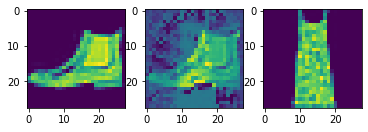

-0.11105627566576004


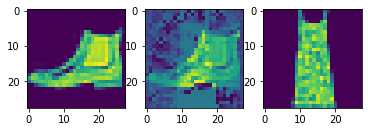

-0.11092875897884369


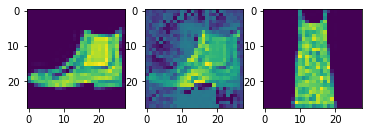

-0.11078754812479019


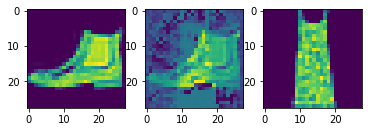

-0.11064648628234863


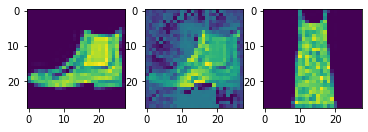

-0.11050558090209961


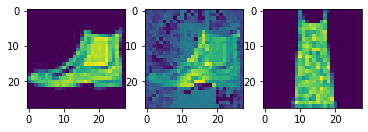

-0.11036473512649536


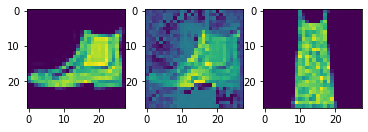

-0.11022412031888962


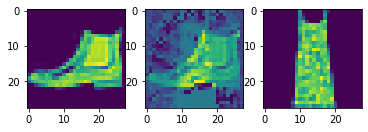

-0.11008422076702118


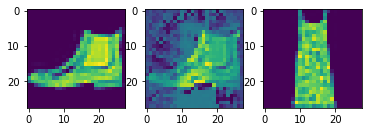

-0.10993777960538864


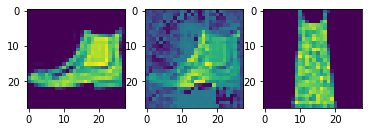

-0.1097818911075592


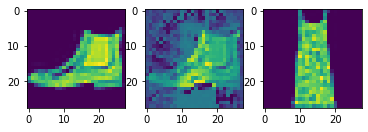

-0.10961070656776428


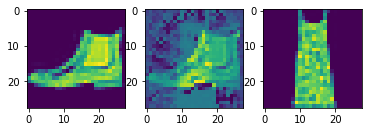

-0.10941866785287857


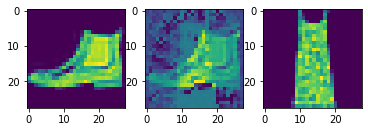

-0.10920819640159607


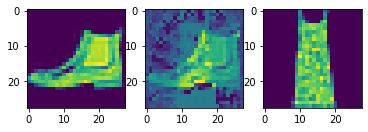

-0.10897006094455719


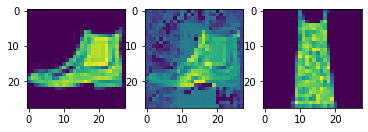

-0.10870771110057831


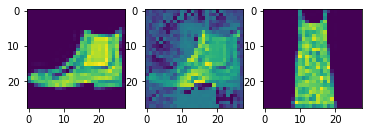

-0.10841642320156097


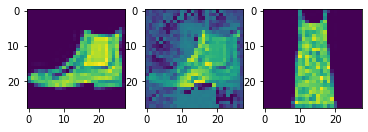

-0.10808929055929184


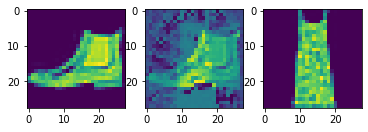

-0.1077399030327797


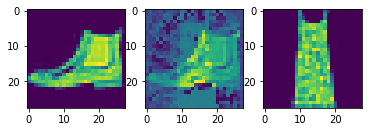

-0.10736434161663055


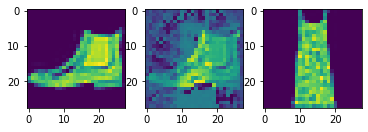

-0.10696856677532196


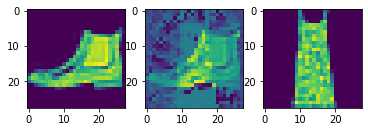

-0.10654473304748535


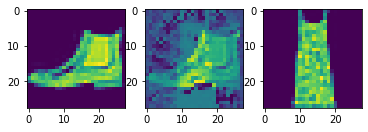

-0.10609174519777298


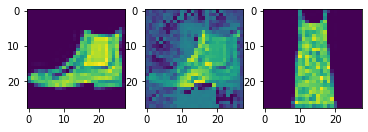

-0.105611152946949


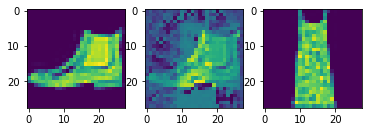

-0.10508744418621063


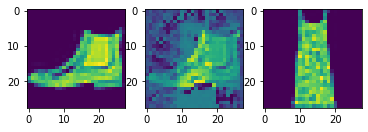

-0.1045176237821579


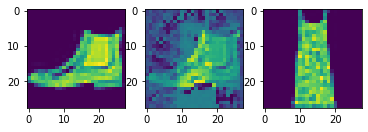

-0.1038990467786789


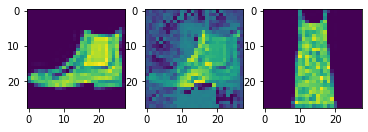

-0.10322649031877518


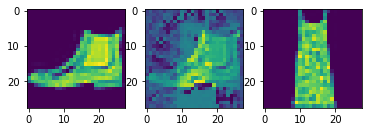

-0.1024937704205513


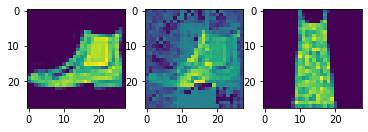

-0.1017046570777893


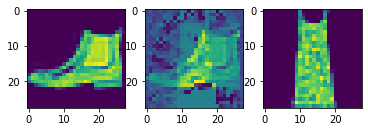

-0.10087214410305023


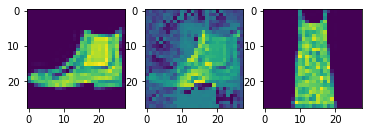

-0.09998966753482819


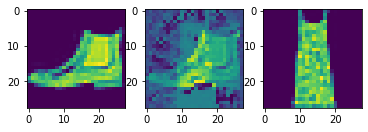

-0.09906323254108429


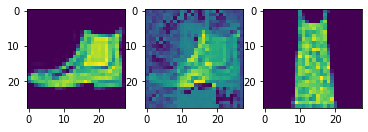

-0.0981082022190094


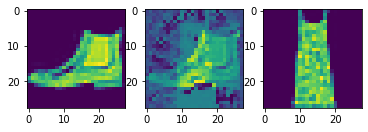

-0.09713993966579437


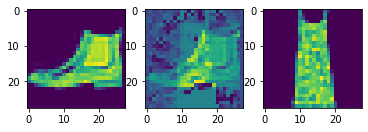

-0.09615295380353928


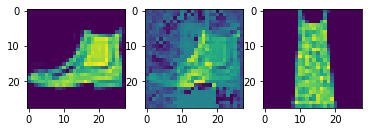

-0.09515978395938873


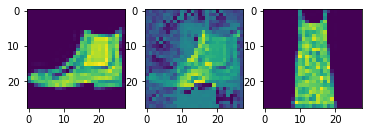

-0.0941440686583519


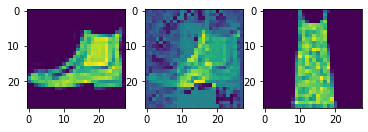

-0.09310276806354523


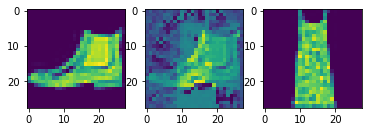

-0.09204806387424469


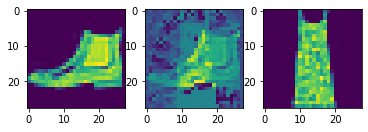

-0.09097994118928909


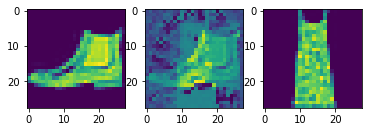

-0.08990123867988586


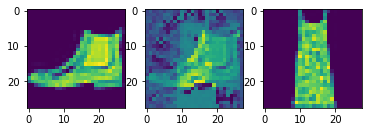

-0.08881314098834991


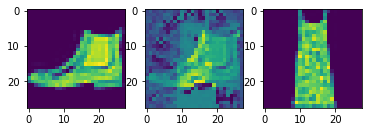

-0.08773774653673172


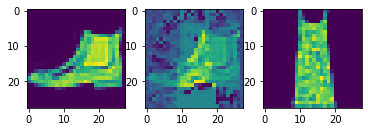

-0.0866762176156044


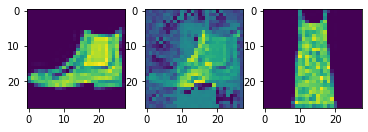

-0.08563008904457092


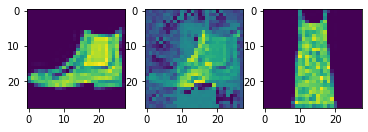

-0.08460254967212677


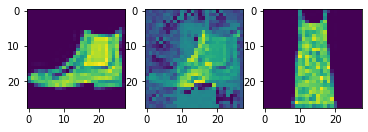

-0.08360085636377335


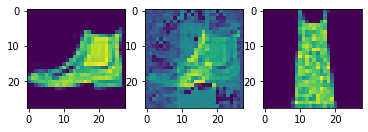

-0.08262472599744797


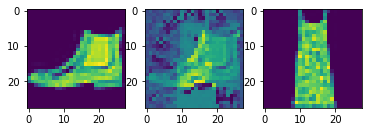

-0.08166485279798508


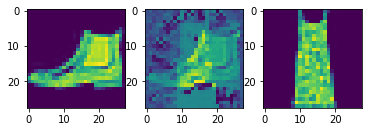

-0.0807146430015564


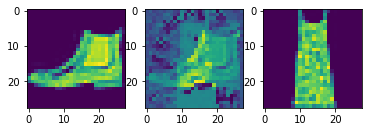

-0.07977063208818436


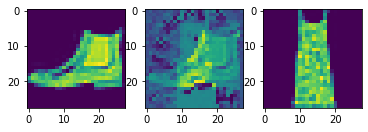

-0.07883244007825851


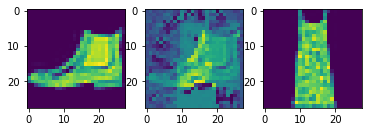

-0.07790060341358185


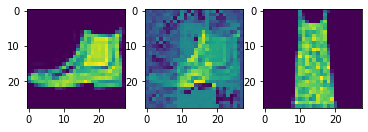

-0.07697514444589615


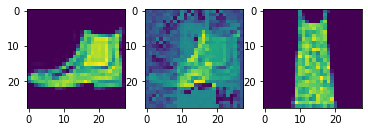

-0.07606546580791473


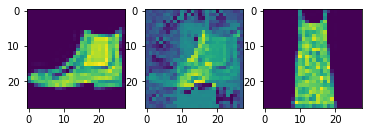

-0.07518320530653


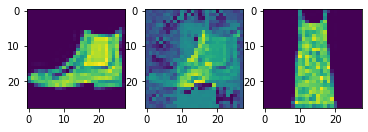

-0.0743306428194046


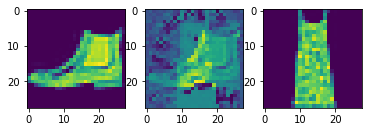

-0.0735006108880043


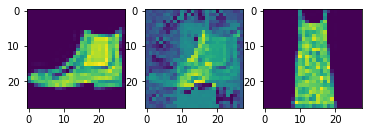

-0.07269761711359024


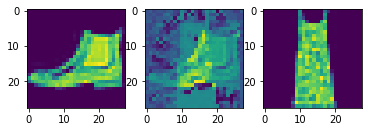

-0.07191559672355652


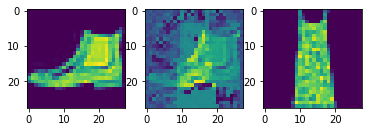

-0.07115348428487778


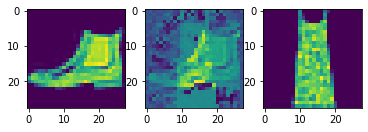

-0.07041382789611816


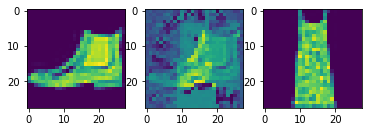

-0.06970374286174774


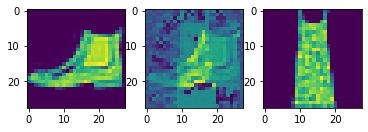

-0.06903238594532013


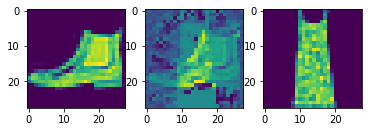

-0.06840100139379501


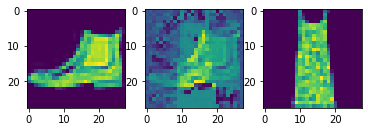

-0.06779951602220535


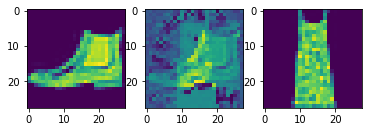

-0.06722962856292725


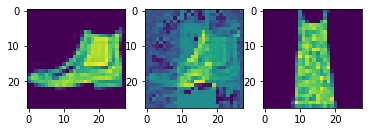

-0.06669925898313522


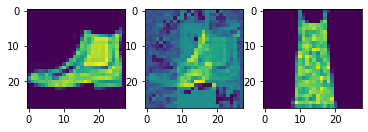

-0.06620277464389801


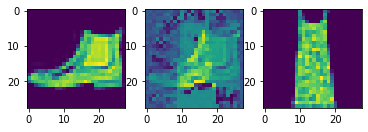

-0.06573107093572617


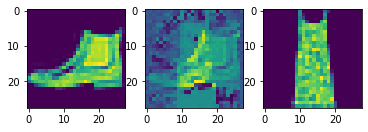

-0.06528285890817642


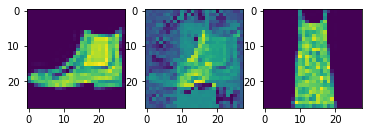

-0.06485578417778015


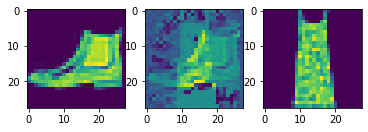

-0.06446154415607452


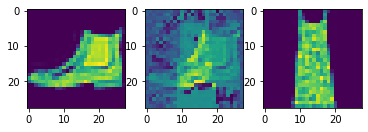

-0.06410452723503113


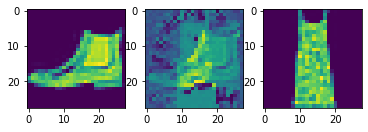

-0.06378313899040222


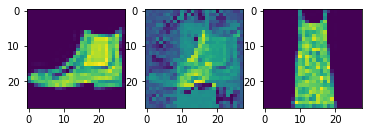

-0.06349228322505951


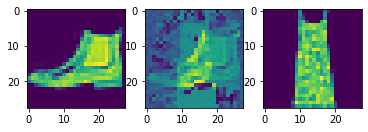

-0.06323470175266266


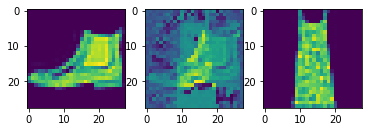

-0.06300303339958191


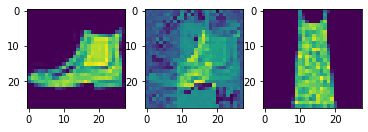

-0.06279878318309784


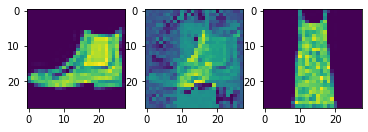

-0.06263121217489243


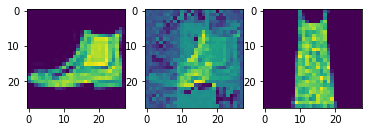

-0.062481801956892014


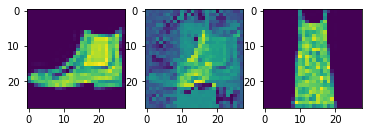

-0.062345728278160095


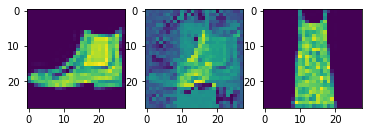

-0.06222677230834961


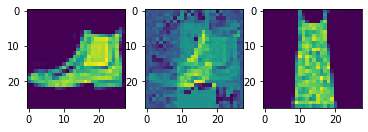

-0.062123194336891174


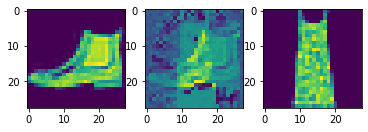

-0.0620257630944252


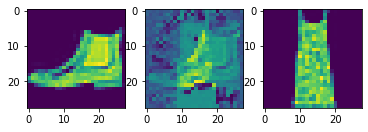

-0.06194061413407326


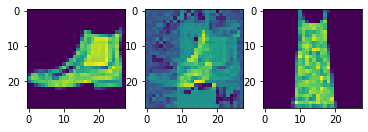

-0.0618647001683712


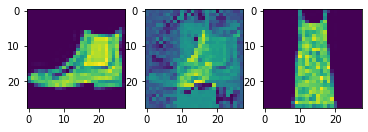

-0.06179526448249817


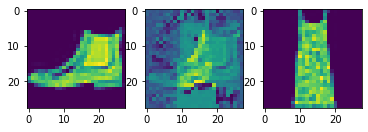

-0.06173476204276085


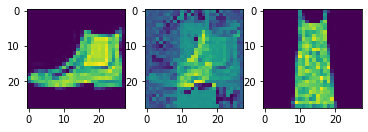

-0.06169041618704796


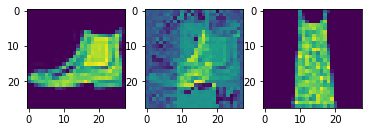

-0.06166747212409973


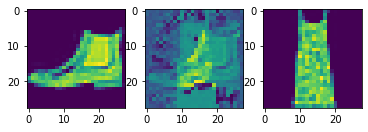

-0.06165969744324684


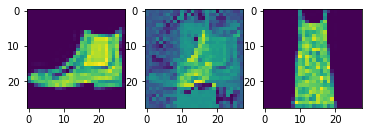

-0.06167060509324074


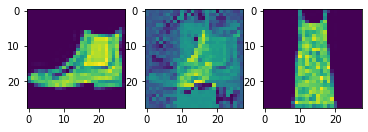

-0.0617009773850441


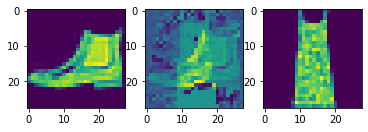

-0.06173495203256607


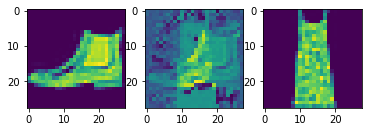

-0.061769384890794754


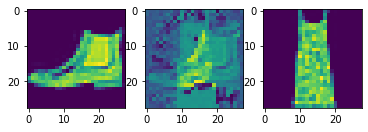

-0.06180620938539505


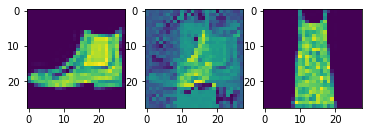

-0.06183525547385216


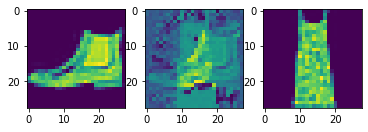

-0.06185711920261383


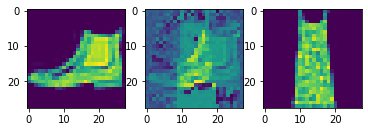

-0.061868004500865936


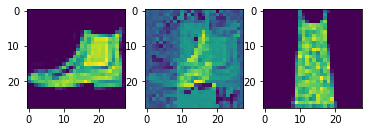

-0.06186280399560928


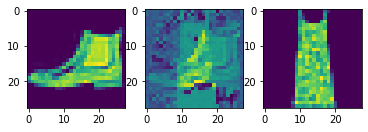

-0.06183156371116638


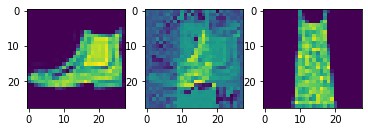

-0.0617762990295887


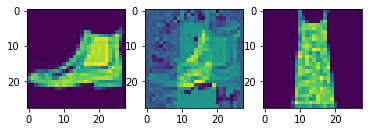

-0.061708539724349976


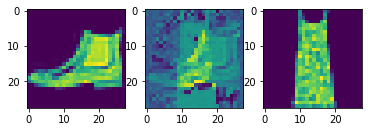

-0.06162387877702713


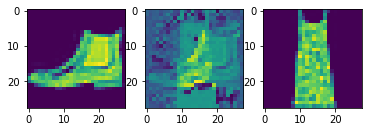

-0.0615106076002121


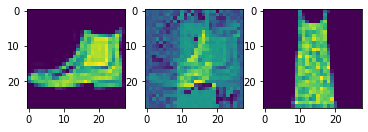

-0.06136785075068474


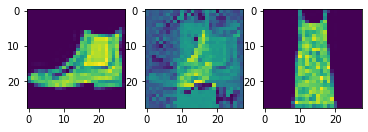

-0.06119139865040779


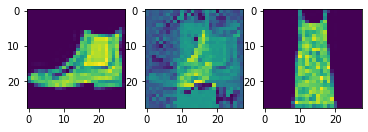

-0.06097834184765816


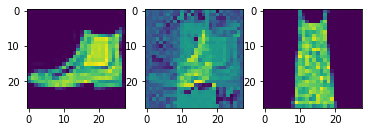

-0.06071697920560837


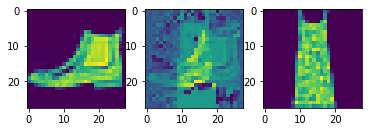

-0.06040285900235176


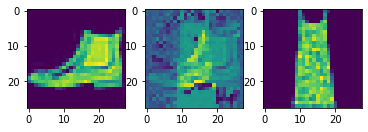

-0.06003584712743759


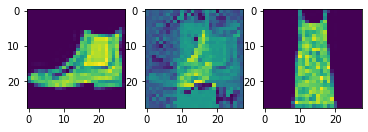

-0.0596141442656517


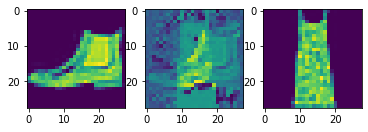

-0.05913636460900307


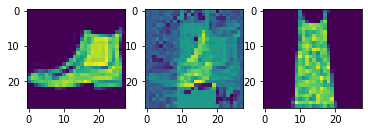

-0.0585981085896492


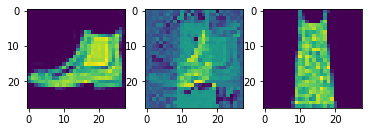

-0.05799632519483566


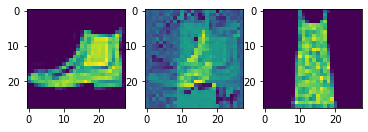

-0.057327691465616226


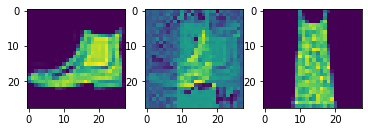

-0.05659636855125427


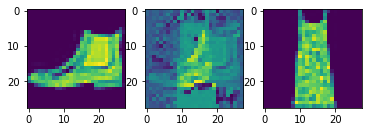

-0.055804960429668427


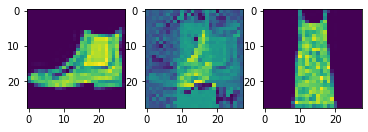

-0.05496906116604805


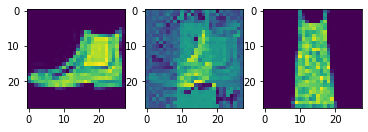

-0.054097093641757965


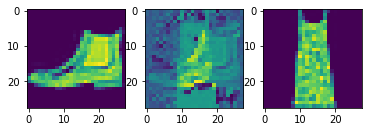

-0.05318763852119446


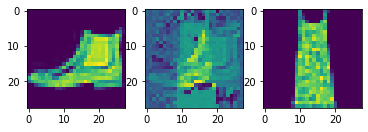

-0.052242591977119446


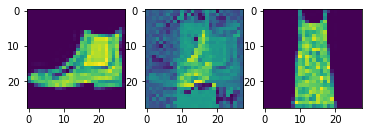

-0.05126849561929703


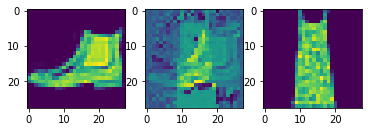

-0.05026540532708168


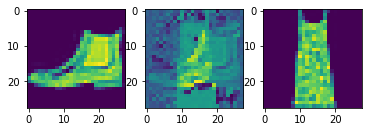

-0.049242082983255386


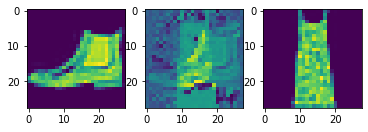

-0.048214491456747055


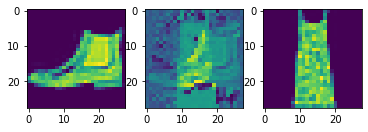

-0.04718552157282829


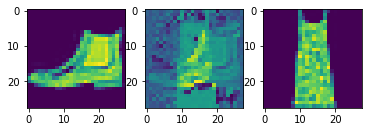

-0.04616062715649605


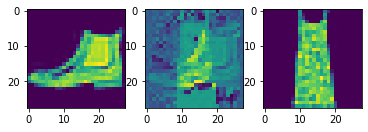

-0.04515637457370758


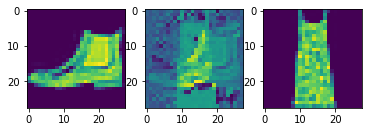

-0.044166285544633865


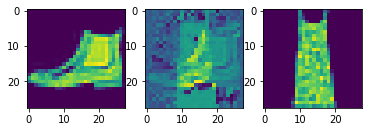

-0.04320133849978447


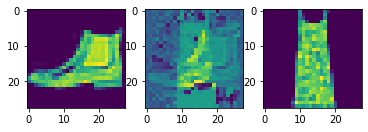

-0.04225973039865494


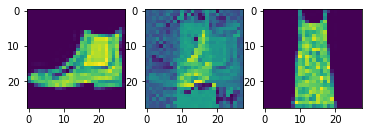

-0.04135417938232422


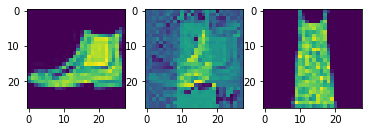

-0.04047880694270134


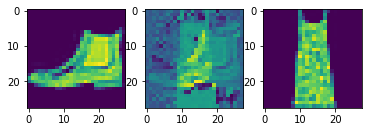

-0.039638977497816086


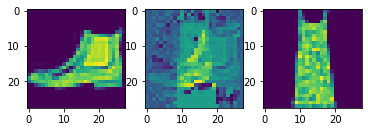

-0.038831908255815506


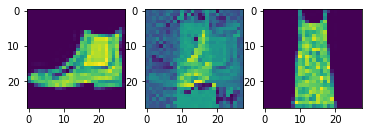

-0.038057807832956314


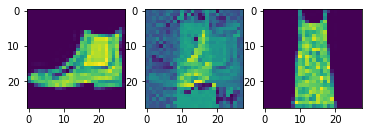

-0.037316564470529556


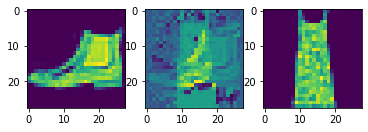

-0.036607302725315094


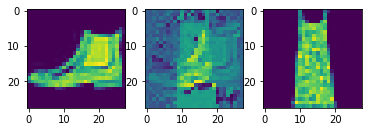

-0.035919513553380966


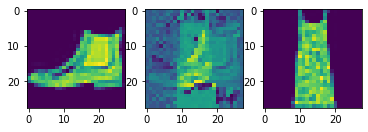

-0.035249851644039154


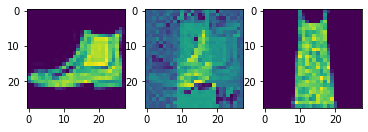

-0.03460495546460152


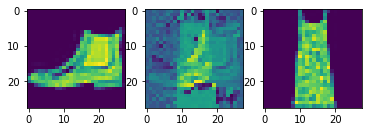

-0.03398718684911728


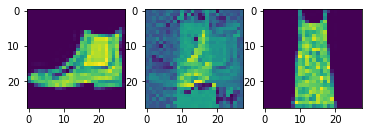

-0.03339303657412529


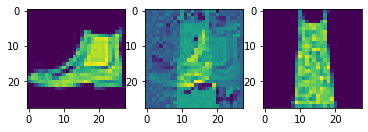

-0.03281980752944946


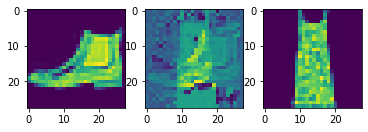

-0.032267339527606964


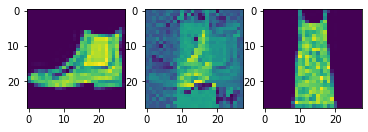

-0.03173947334289551


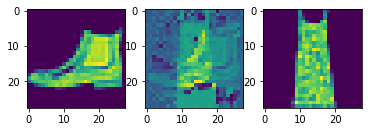

-0.031233537942171097


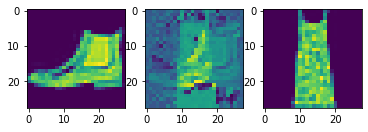

-0.03074691817164421


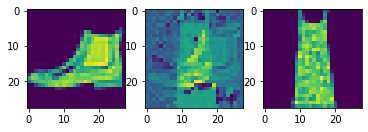

-0.030284859240055084


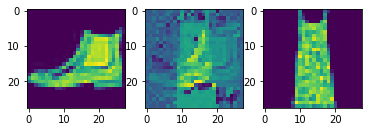

-0.02983768656849861


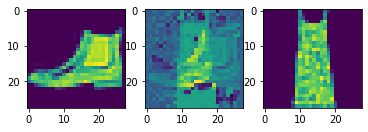

-0.029411133378744125


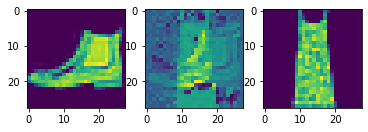

-0.02900535613298416


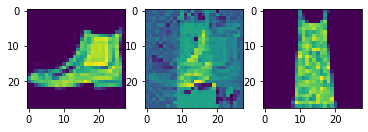

-0.028616715222597122


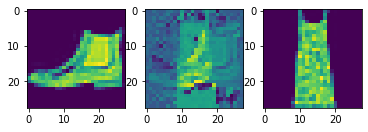

-0.02824428305029869


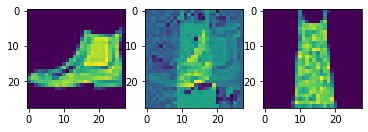

-0.027880176901817322


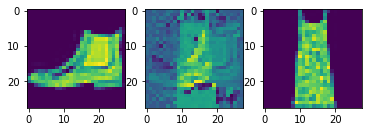

-0.02751321718096733


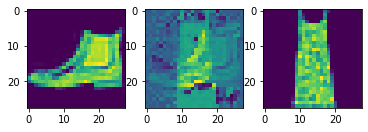

-0.02714286372065544


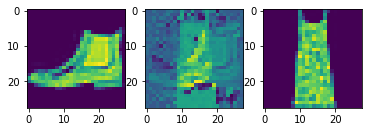

-0.026761263608932495


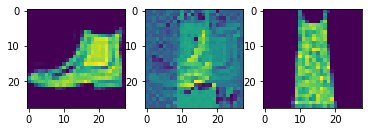

-0.02637408673763275


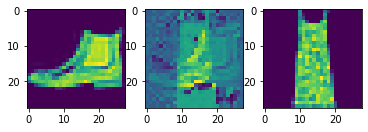

-0.025981556624174118


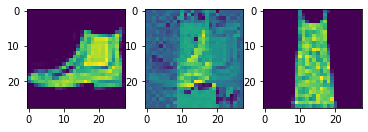

-0.025592010468244553


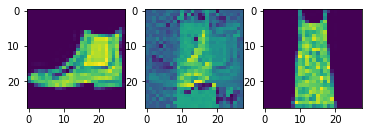

-0.025205478072166443


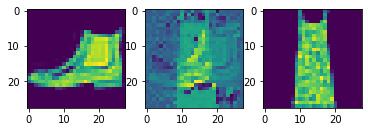

-0.024835187941789627


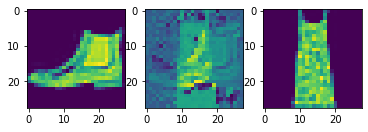

-0.02448881044983864


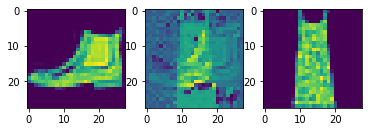

-0.024166319519281387


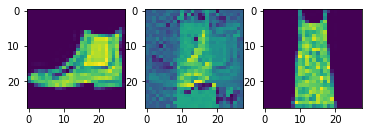

-0.023862913250923157


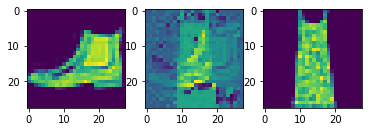

-0.023583922535181046


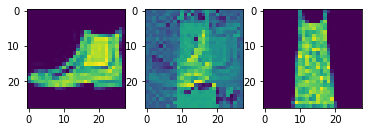

-0.02332621067762375


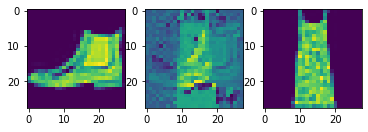

-0.023093126714229584


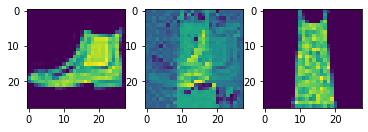

-0.022876258939504623


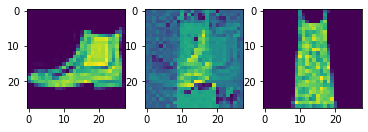

-0.022675585001707077


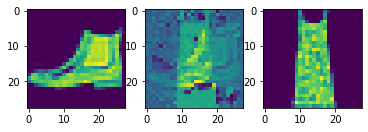

-0.022482171654701233


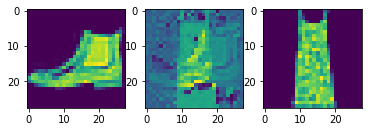

-0.022285304963588715


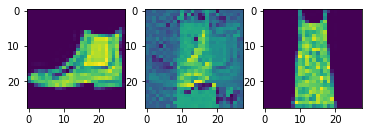

-0.022087346762418747


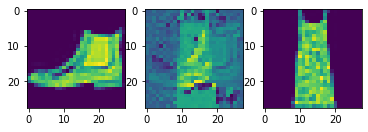

-0.021878208965063095


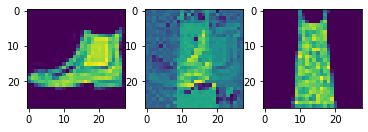

-0.021659333258867264


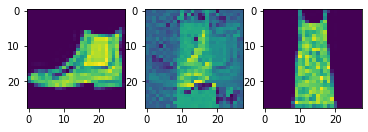

-0.02143658697605133


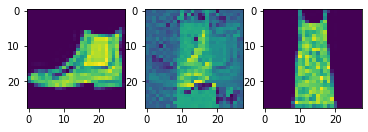

-0.021212611347436905


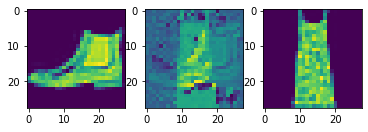

-0.020991455763578415


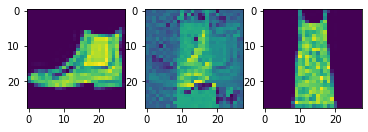

-0.020774397999048233


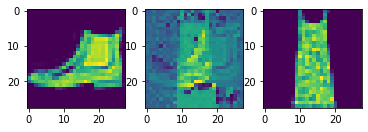

-0.02057051658630371


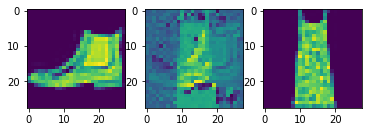

-0.02037692442536354


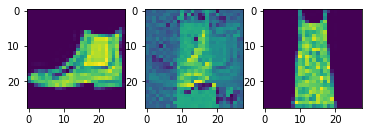

-0.02018848806619644


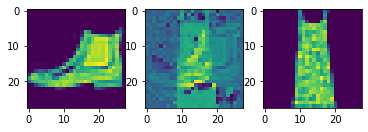

-0.020003095269203186


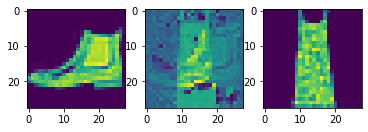

-0.019810833036899567


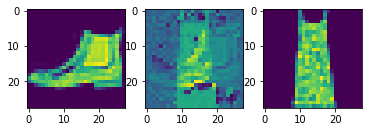

-0.0196080319583416


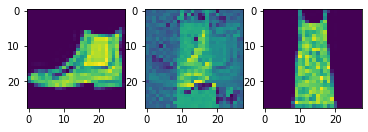

-0.019400641322135925


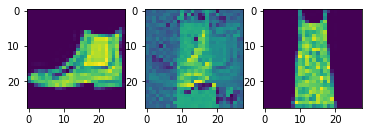

-0.019188426434993744


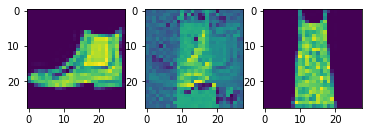

-0.018970370292663574


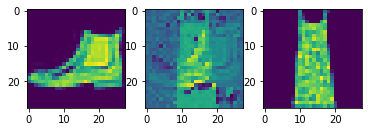

-0.018748346716165543


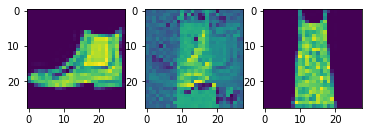

-0.018516361713409424


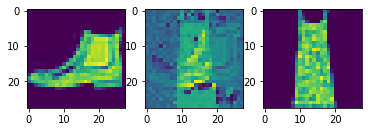

-0.01827070116996765


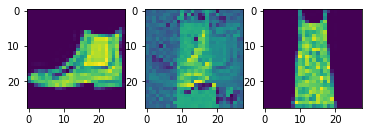

-0.0180116705596447


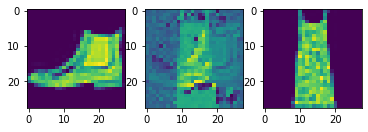

-0.017731424421072006


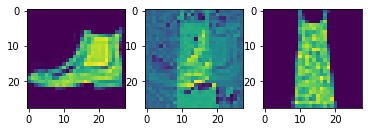

-0.01743404194712639


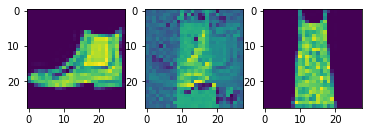

-0.017118986696004868


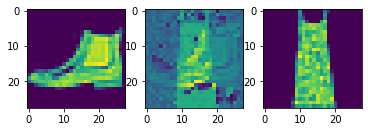

-0.016789354383945465


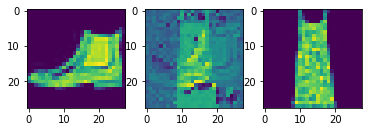

-0.016449060291051865


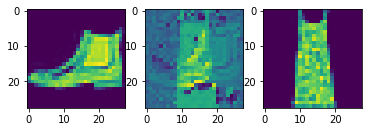

-0.016097676008939743


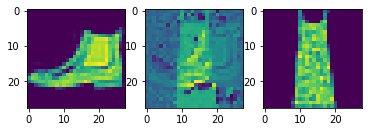

-0.015739675611257553


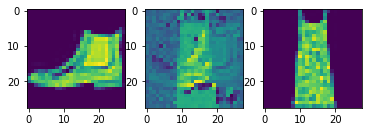

-0.015367183834314346


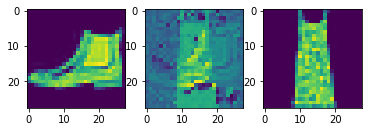

-0.014988843351602554


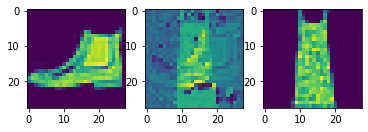

-0.014608662575483322


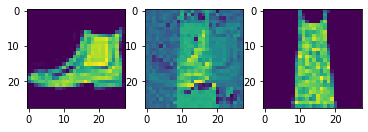

-0.01422879472374916


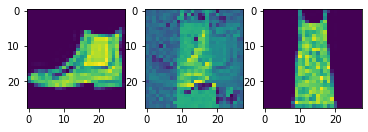

-0.013848114758729935


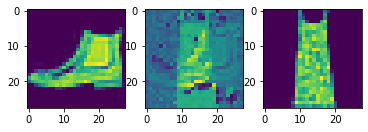

-0.013476811349391937


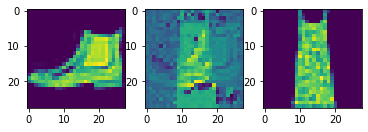

-0.0131293386220932


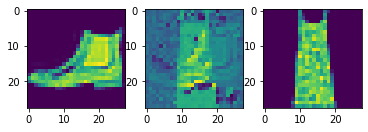

-0.012798000127077103


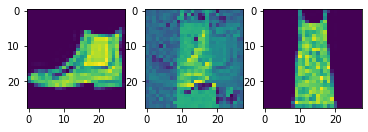

-0.01247875764966011


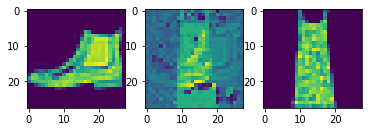

-0.012165889143943787


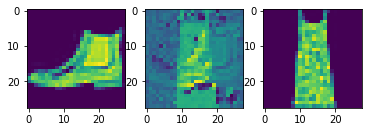

-0.011857245117425919


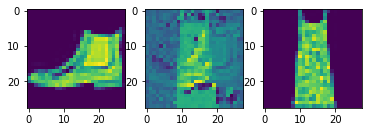

-0.011561345309019089


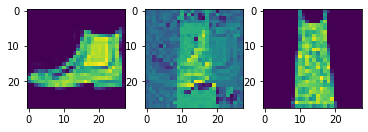

-0.011279776692390442


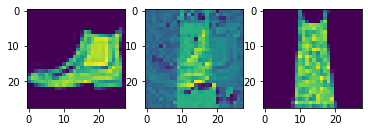

-0.011009979993104935


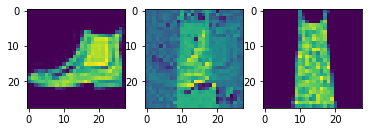

-0.010741405189037323


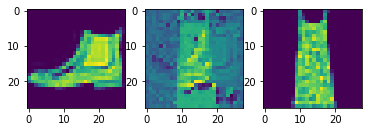

-0.010471101850271225


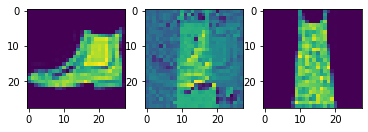

-0.010194055736064911


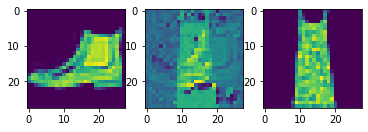

-0.00991080328822136


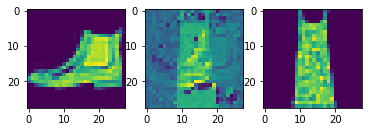

-0.009617973119020462


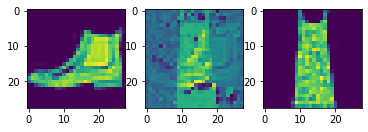

-0.009316109120845795


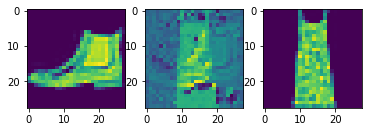

-0.009013902395963669


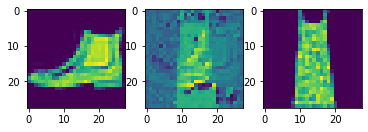

-0.008696474134922028


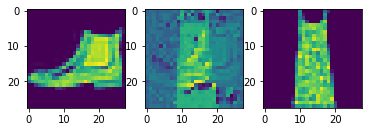

-0.008375342935323715


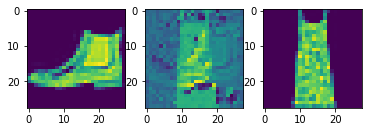

-0.008053120225667953


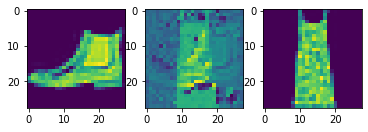

-0.007727771997451782


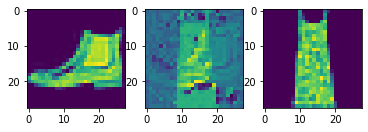

-0.007398635149002075


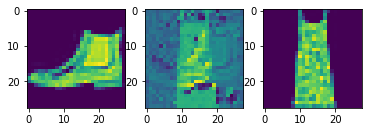

-0.007077004760503769


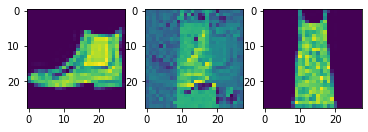

-0.0067627765238285065


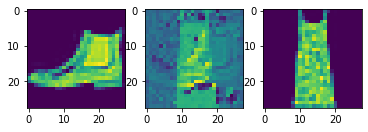

-0.006457429379224777


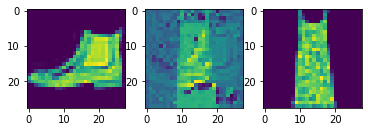

-0.006162010133266449


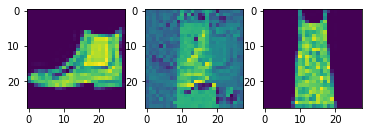

-0.005874980241060257


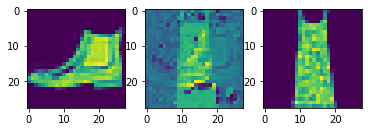

-0.005594417452812195


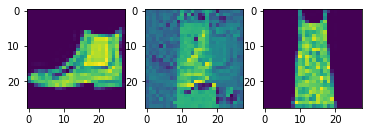

-0.005317091941833496


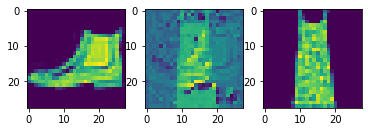

-0.0050412677228450775


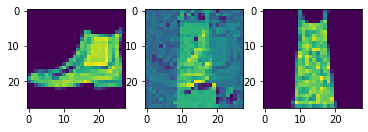

-0.004770774394273758


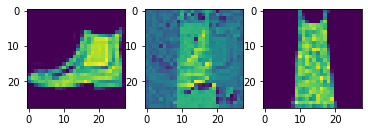

-0.00450187548995018


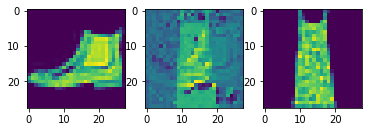

-0.004231631755828857


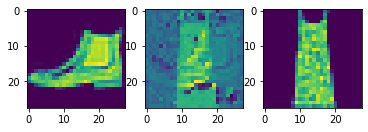

-0.00396391749382019


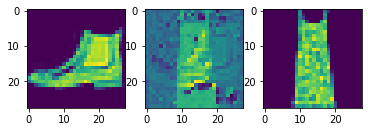

-0.0036997050046920776


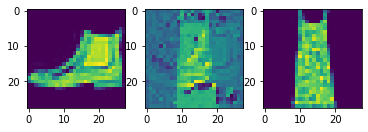

-0.0034380629658699036


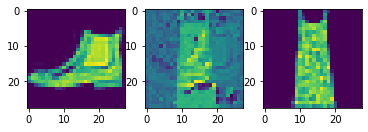

-0.003178022801876068


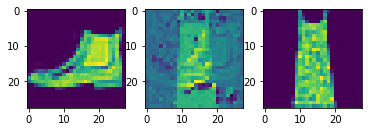

-0.0029229260981082916


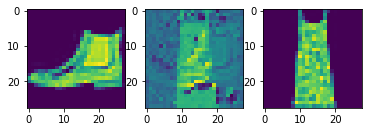

-0.002674143761396408


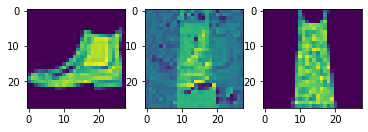

-0.0024302639067173004


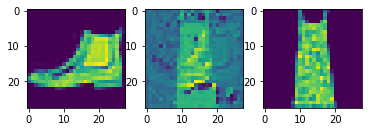

-0.002187807112932205


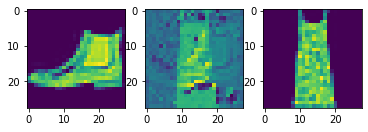

-0.0019456036388874054


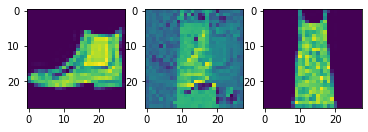

-0.0017005428671836853


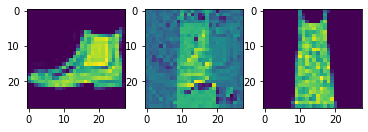

-0.0014498308300971985


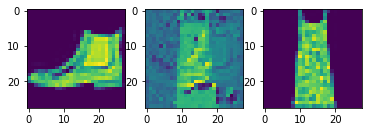

-0.0011946074664592743


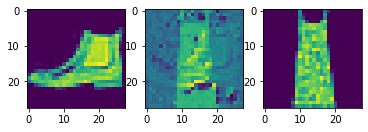

-0.0009398125112056732


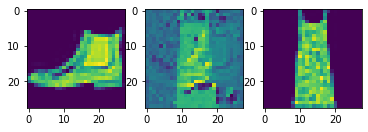

-0.0006849728524684906


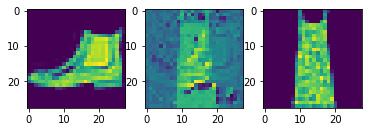

-0.0004329383373260498


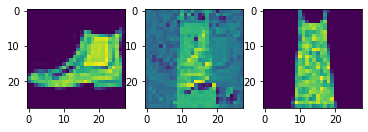

-0.00019023939967155457


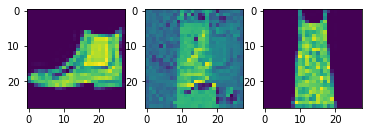

4.4990330934524536e-05


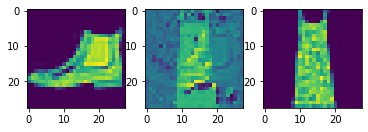

0.00027251988649368286


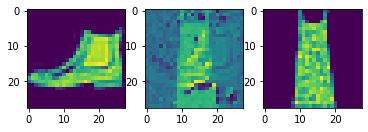

0.0004927963018417358


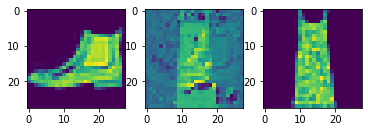

0.0007068514823913574


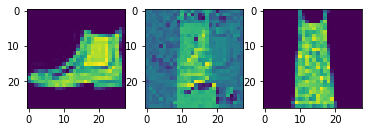

0.0009218305349349976


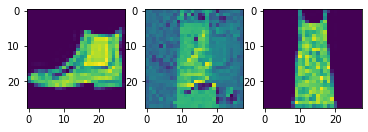

0.001135699450969696


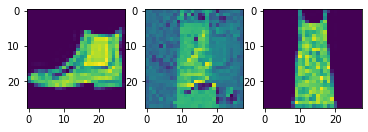

0.0013471469283103943


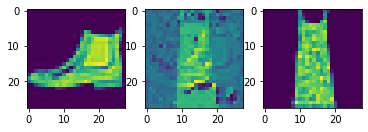

0.0015513598918914795


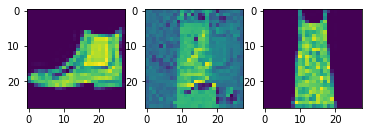

0.0017502456903457642


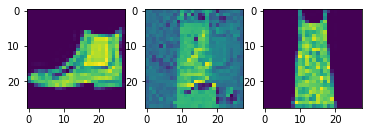

0.0019413791596889496


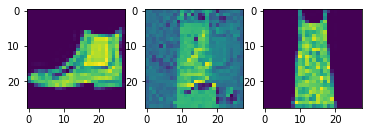

0.0021213404834270477


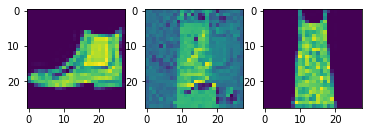

0.0022886954247951508


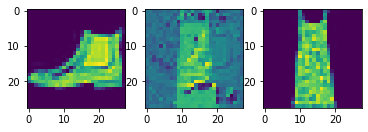

0.0024431198835372925


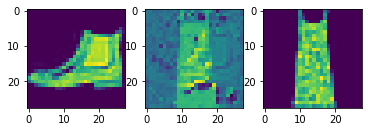

0.0025837644934654236


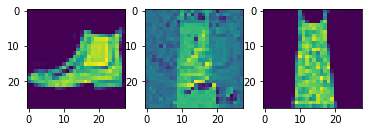

0.0027128197252750397


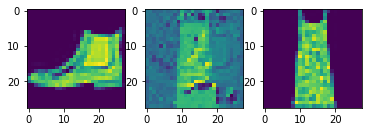

0.0028269365429878235


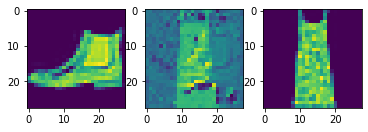

0.002927713096141815


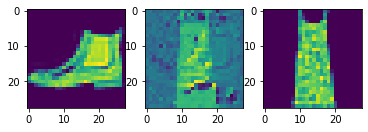

0.003009580075740814


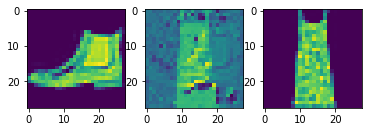

0.003074314445257187


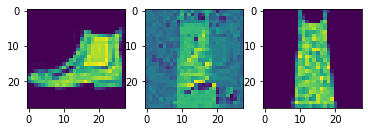

0.0031159520149230957


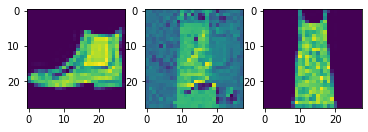

0.003141317516565323


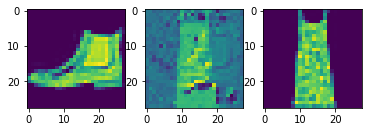

0.003157094120979309


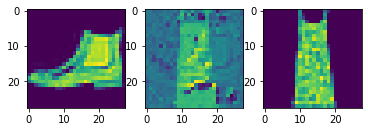

0.0031642988324165344


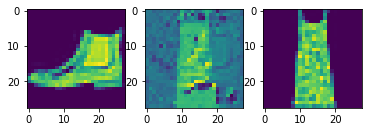

0.0031577572226524353


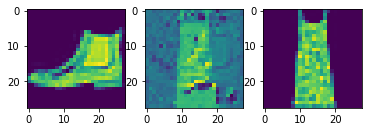

0.0031397975981235504


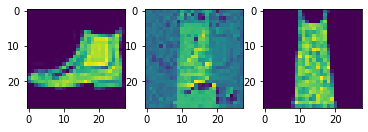

0.003109864890575409


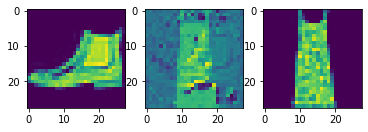

0.0030652210116386414


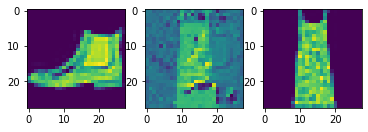

0.0030090734362602234


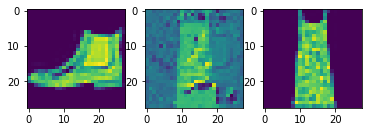

0.0029331333935260773


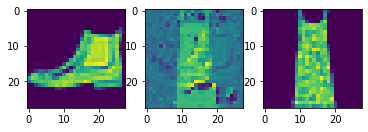

0.002835724502801895


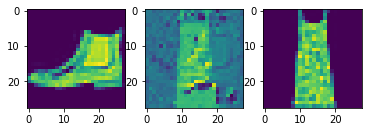

0.0027249567210674286


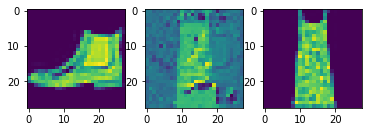

0.0026015229523181915


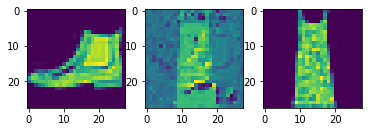

0.0024716518819332123


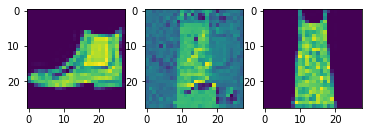

0.002329055219888687


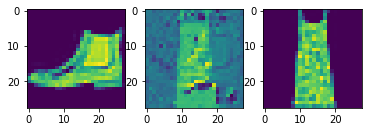

0.0021820291876792908


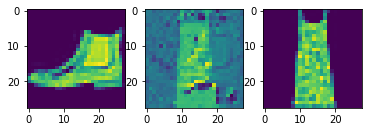

0.002034001052379608


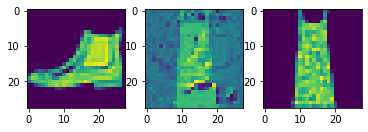

0.0018871724605560303


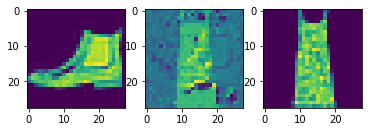

0.0017433278262615204


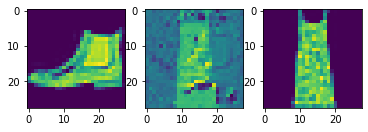

0.001598406583070755


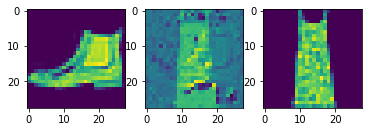

0.0014522597193717957


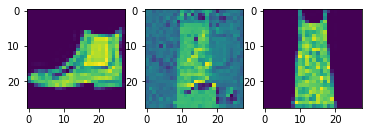

0.0012988336384296417


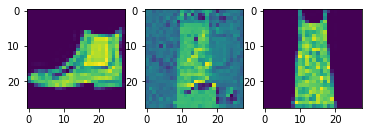

0.001141134649515152


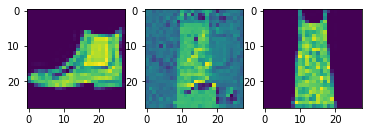

0.00098365917801857


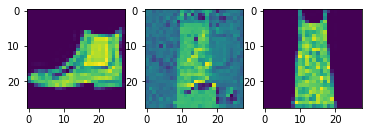

0.000825878232717514


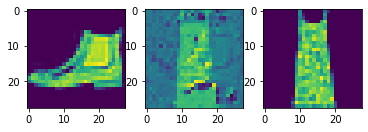

0.0006683208048343658


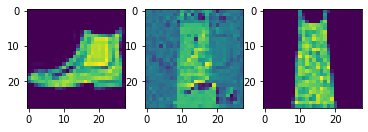

0.0005092434585094452


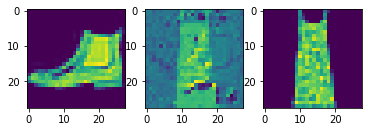

0.00034764036536216736


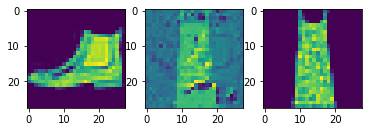

0.0001839958131313324


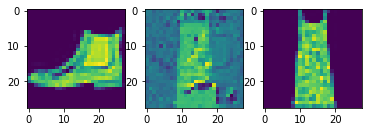

1.6983598470687866e-05


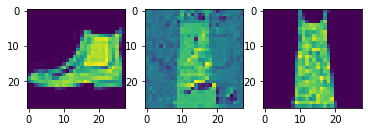

-0.0001536048948764801


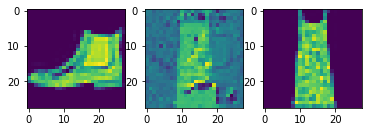

-0.0003282614052295685


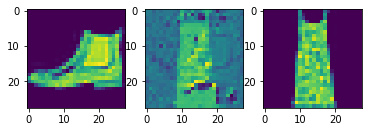

-0.0005090087652206421


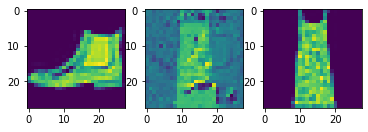

-0.0007010921835899353


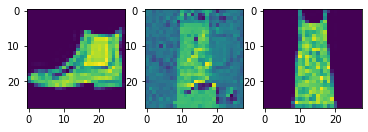

-0.000911422073841095


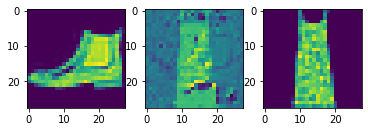

-0.0011396706104278564


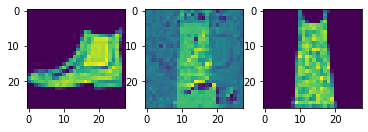

-0.0013854242861270905


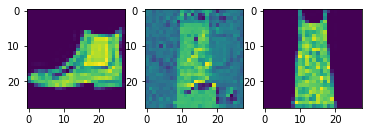

-0.0016476772725582123


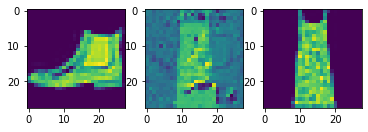

-0.0019233860075473785


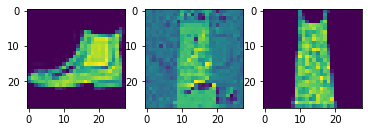

-0.002213466912508011


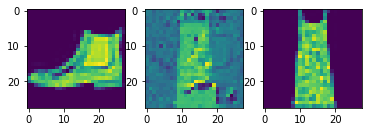

-0.0025150254368782043


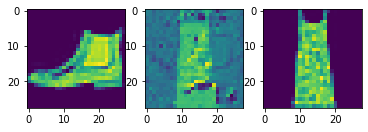

tensor([[-24.9112,  23.3306, -49.6727, -70.9072, -45.1913,  48.0285,  -5.4783,
          12.8002,  47.8373,  79.9755]], grad_fn=<AddmmBackward>) 9 3


In [183]:
#Experiment 2

import matplotlib.pyplot as plt
cf_before = cf_image.detach().clone().numpy()
cf_image_copy = cf_image.detach().clone().numpy()
for i in range(500):
    output = model(cf_image.unsqueeze(0))
#     print(query_label.unsqueeze(0))
    loss_cf = pdist(cf_image, query_image).sum() - 0.1*error(output, torch.tensor(query_label).unsqueeze(0))
#     print(loss_cf)
    loss_cf.backward()
    optimizer_cf.step()
    diff = cf_image.detach().numpy() - cf_before
    print(diff.sum().item())
    cf_before = cf_image.detach().clone().numpy()
    plt.figure()
    plt.subplot(1,3,1)
    plt.imshow(cf_image_copy[0,:,:])
    plt.subplot(1,3,2)
#     plt.imshow(diff[0,:,:])
    plt.imshow(cf_image.detach().clone().numpy()[0,:,:])
    plt.subplot(1,3,3)
    plt.imshow(query_image[0,:,:])
    plt.show()
    
print(model(cf_image.unsqueeze(0)), cf_label, query_label)

-0.5379965901374817


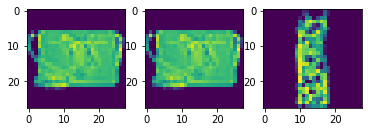

-0.773045539855957


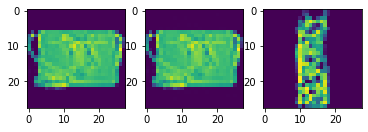

-0.8028583526611328


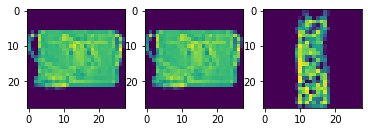

-0.6854152679443359


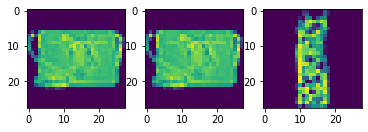

-0.4628218412399292


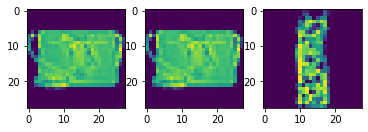

-0.16687481105327606


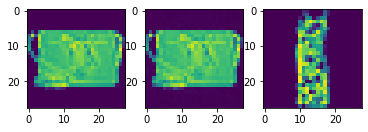

0.17886295914649963


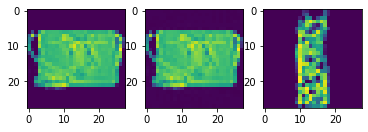

0.5531512498855591


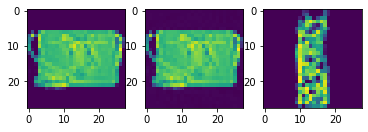

0.9355075359344482


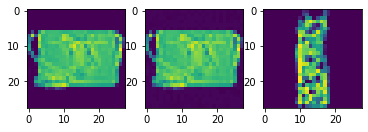

1.3073663711547852


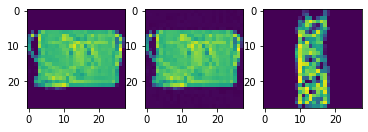

1.6522650718688965


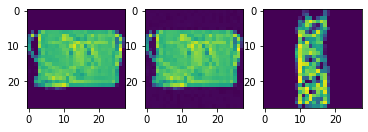

1.9562363624572754


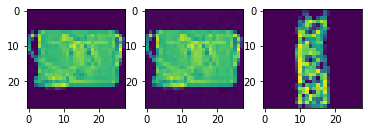

2.2091360092163086


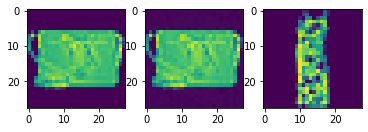

2.4049735069274902


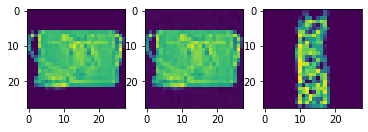

2.541170120239258


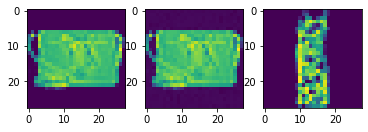

2.6175546646118164


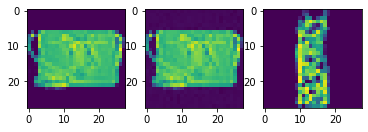

2.635294198989868


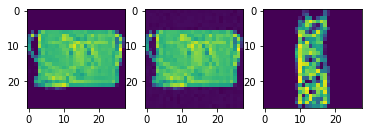

2.5973470211029053


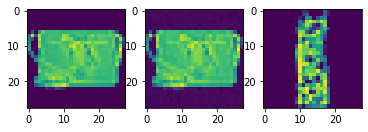

2.508195400238037


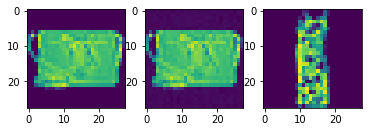

2.372765302658081


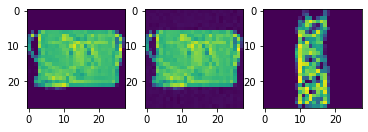

2.196427345275879


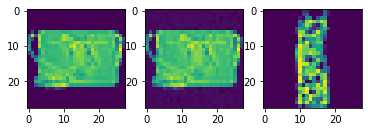

1.9849371910095215


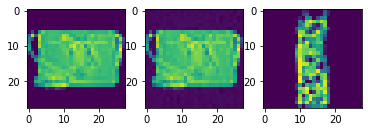

1.7439465522766113


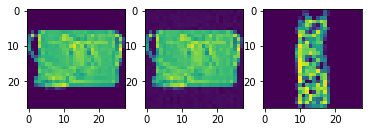

1.4786479473114014


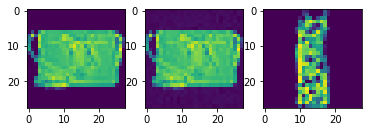

1.1941167116165161


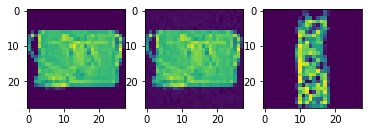

0.8949419260025024


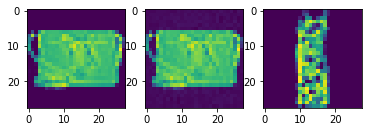

0.5856058597564697


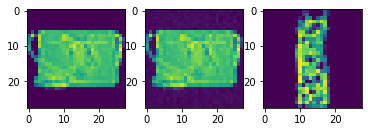

0.27008557319641113


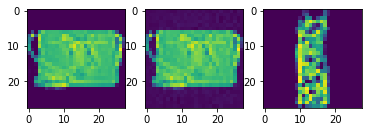

-0.04805418848991394


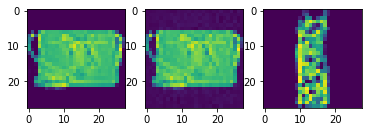

-0.36559656262397766


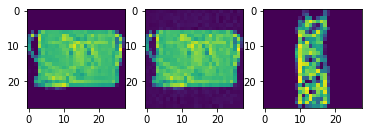

-0.6795940399169922


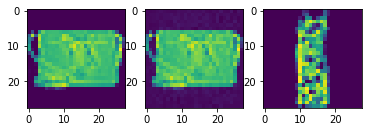

-0.9873189926147461


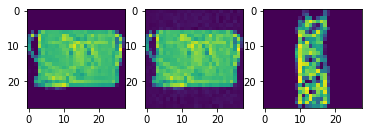

-1.2861437797546387


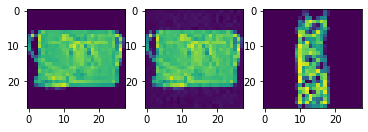

-1.5737168788909912


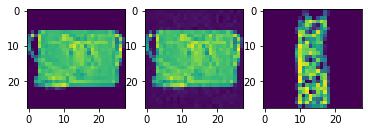

-1.8478717803955078


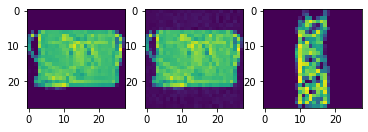

-2.106801748275757


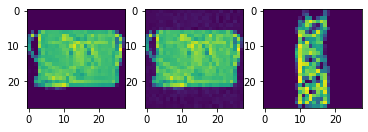

-2.348905563354492


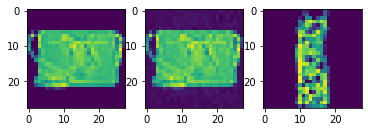

-2.572709560394287


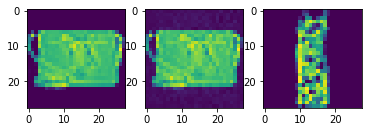

-2.776822566986084


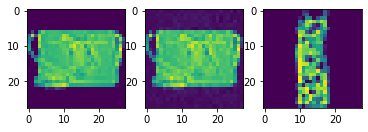

-2.959944725036621


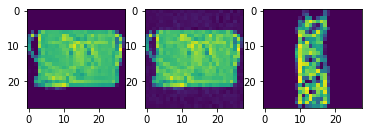

-3.120934009552002


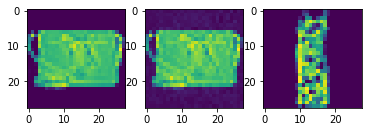

-3.2587943077087402


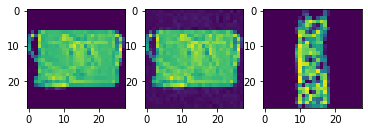

-3.37269926071167


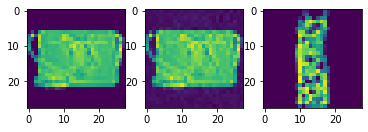

-3.462083339691162


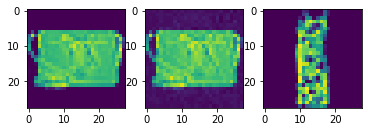

-3.526543140411377


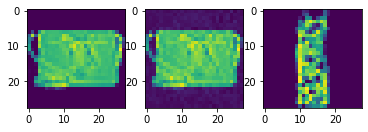

-3.5658488273620605


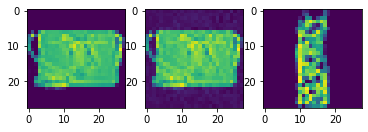

-3.5800185203552246


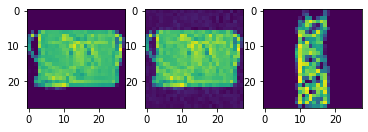

-3.569349527359009


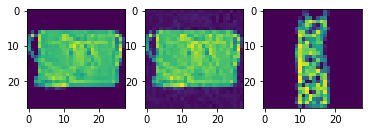

-3.5341992378234863


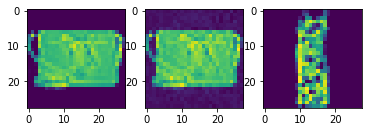

-3.4751670360565186


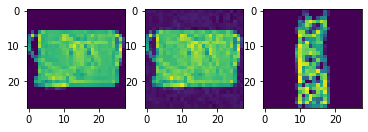

-3.3929495811462402


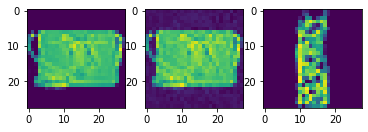

-3.2884068489074707


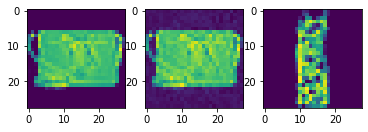

-3.1625051498413086


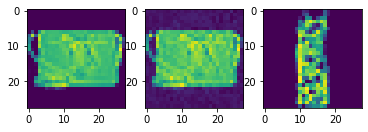

-3.0162878036499023


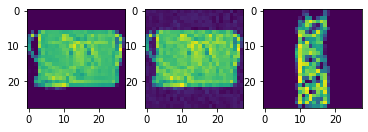

-2.8508617877960205


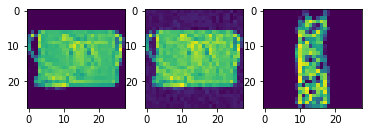

-2.667405366897583


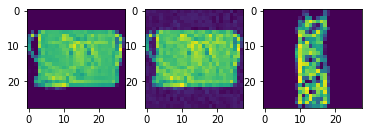

-2.4672017097473145


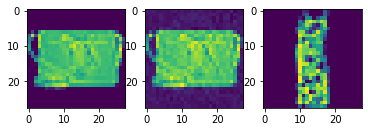

-2.251706123352051


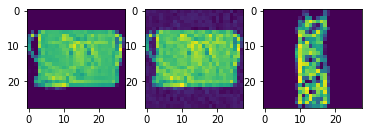

-2.022432804107666


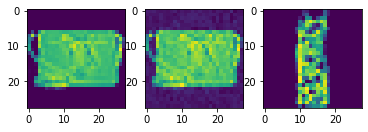

-1.7809981107711792


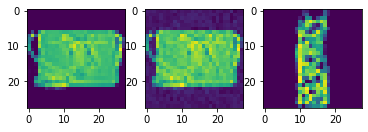

-1.5290420055389404


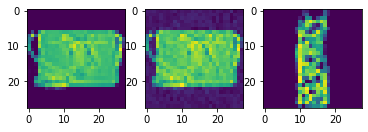

-1.268174648284912


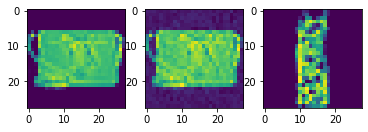

-1.0000226497650146


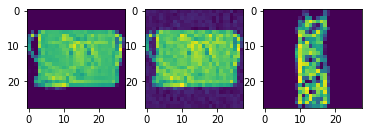

-0.7261191606521606


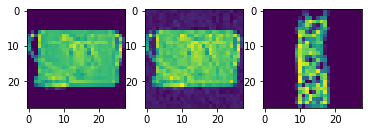

-0.44792628288269043


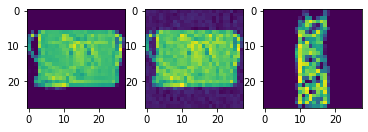

-0.16683495044708252


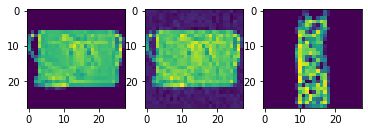

0.11588865518569946


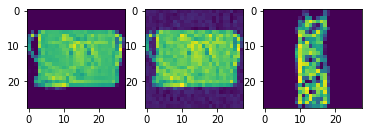

0.3990781307220459


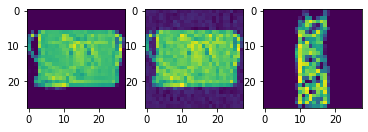

0.681603193283081


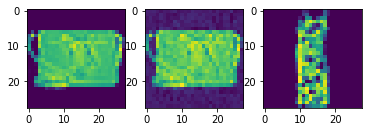

0.9624074101448059


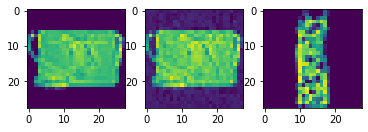

1.240572452545166


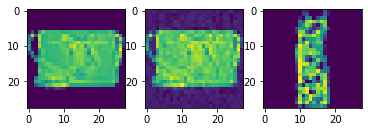

1.5152771472930908


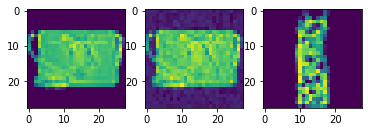

1.7857425212860107


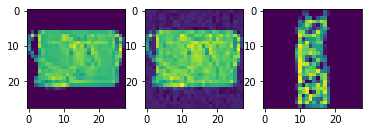

2.051297426223755


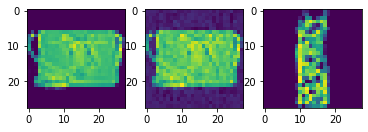

2.3113203048706055


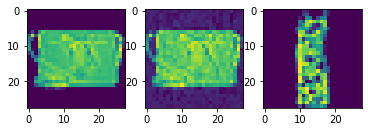

2.5652122497558594


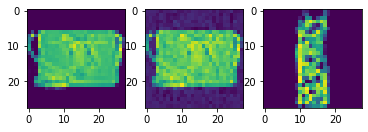

2.8124022483825684


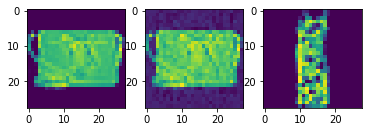

3.052344799041748


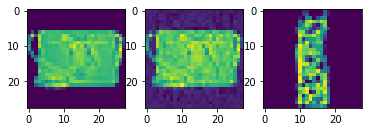

3.2845234870910645


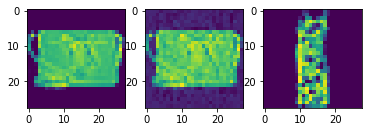

3.5084638595581055


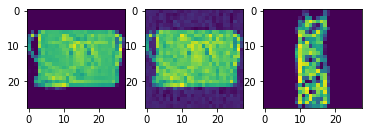

3.7237348556518555


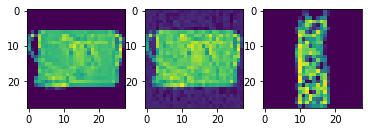

3.9300289154052734


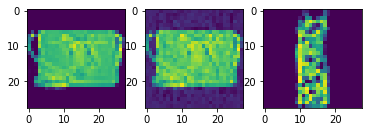

4.127063751220703


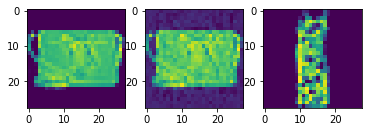

4.314583778381348


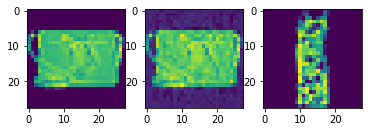

4.492329120635986


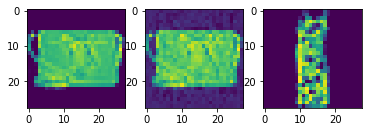

4.660079479217529


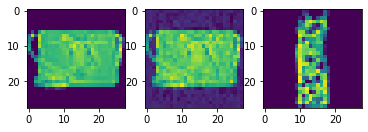

4.817638874053955


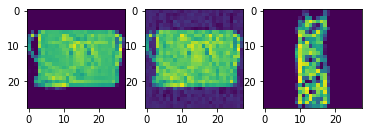

4.964812755584717


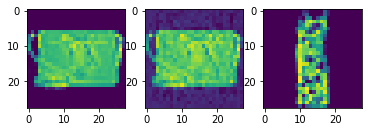

5.101435661315918


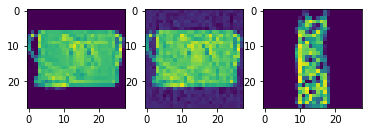

5.227360248565674


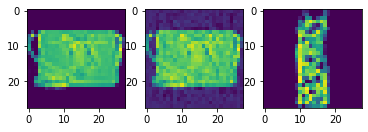

5.342452526092529


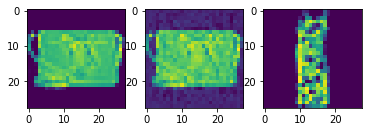

5.446591854095459


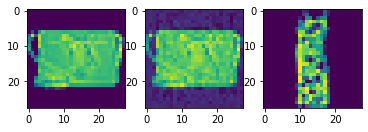

5.539695739746094


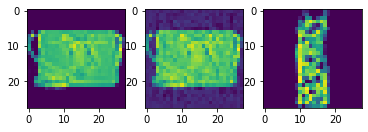

5.6217169761657715


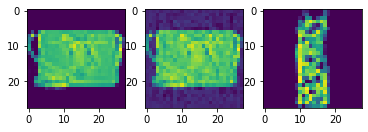

5.692643165588379


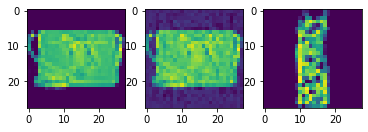

5.752487659454346


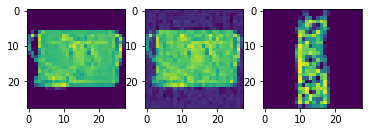

5.801298141479492


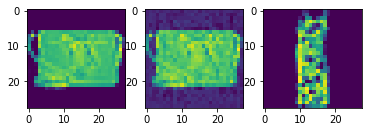

5.839176177978516


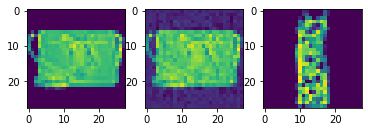

5.866264343261719


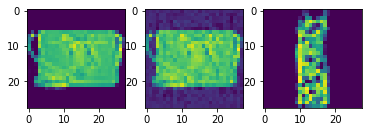

5.882757186889648


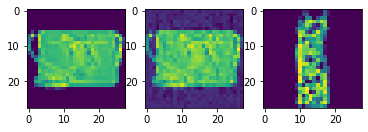

5.888833045959473


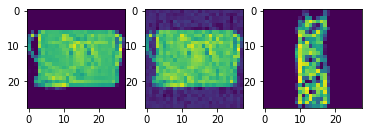

5.884721279144287


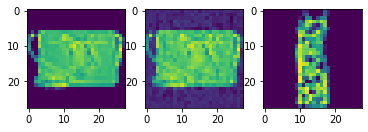

5.870702743530273


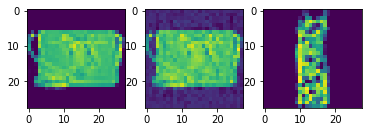

5.847110748291016


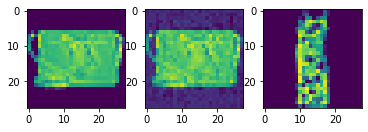

5.814289093017578


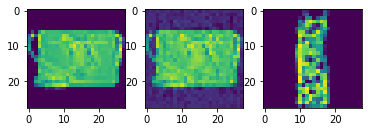

5.772603988647461


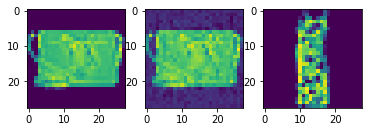

5.722412109375


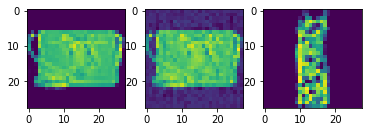

5.664090156555176


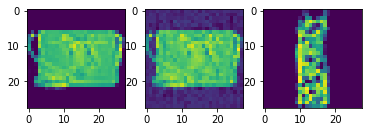

5.598033905029297


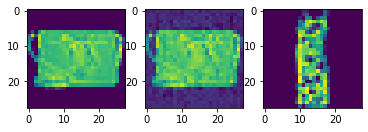

5.524625301361084


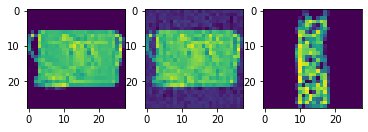

5.444235801696777


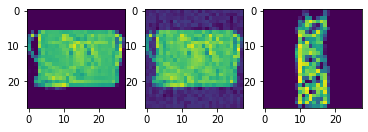

5.357290267944336


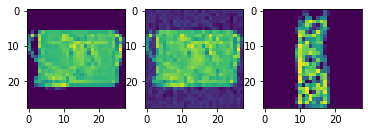

5.264230728149414


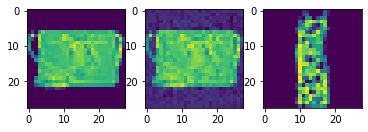

5.165477752685547


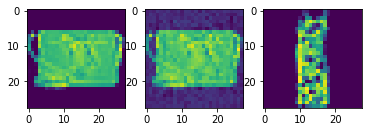

5.061377048492432


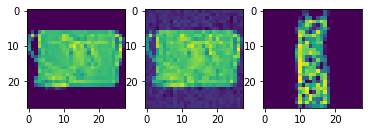

4.9522294998168945


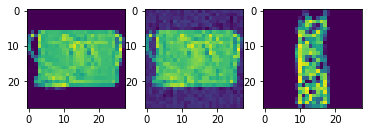

4.838315010070801


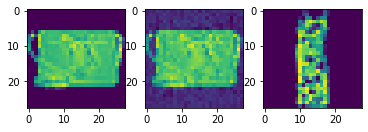

4.719905853271484


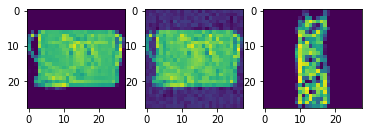

4.5972514152526855


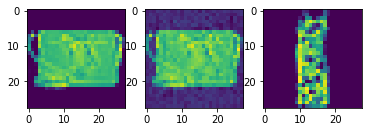

4.470604419708252


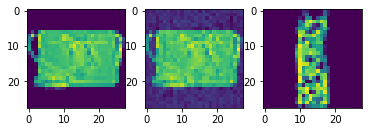

4.3401947021484375


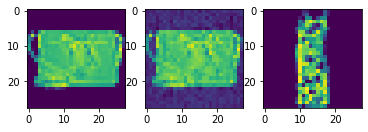

4.206264495849609


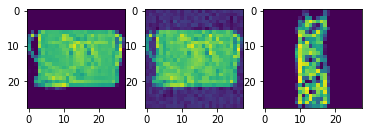

4.0690813064575195


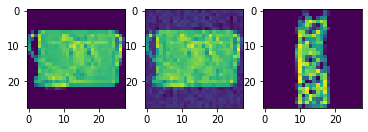

3.9289538860321045


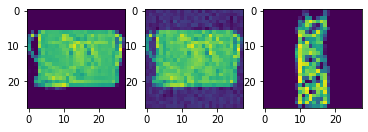

3.786193370819092


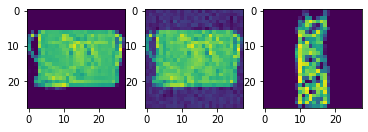

3.6410913467407227


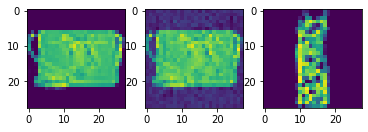

3.493934154510498


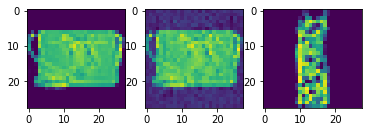

3.344982385635376


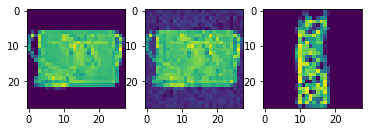

3.1944708824157715


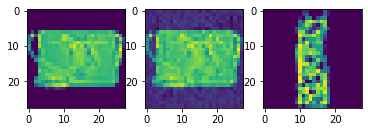

3.042607069015503


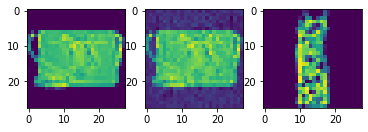

2.889585018157959


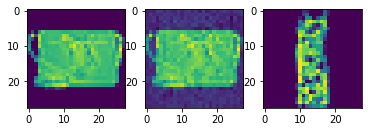

2.735546350479126


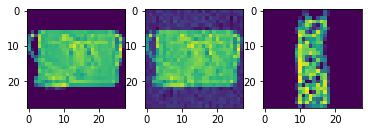

2.580601930618286


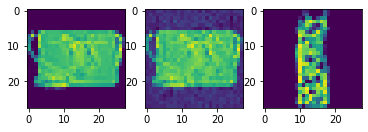

2.4248669147491455


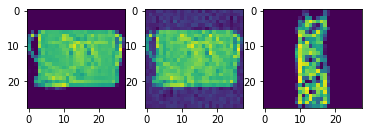

2.2684550285339355


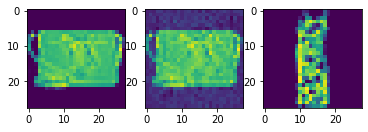

2.111454963684082


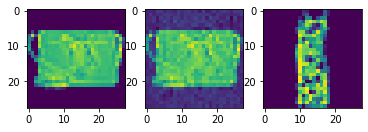

1.9539659023284912


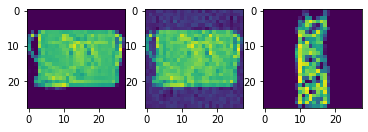

1.7960970401763916


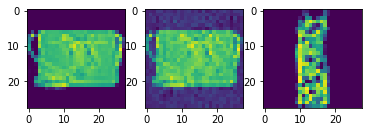

1.6379246711730957


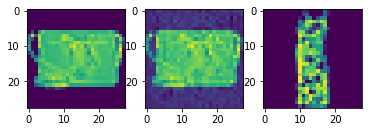

1.4795401096343994


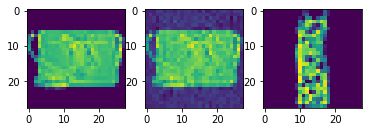

1.3210535049438477


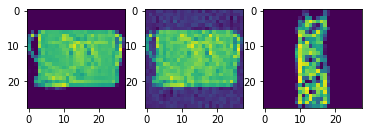

1.1625920534133911


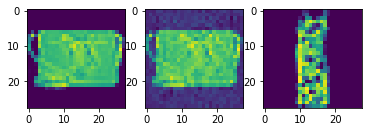

1.0043044090270996


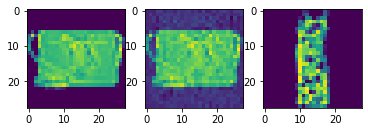

0.8463776111602783


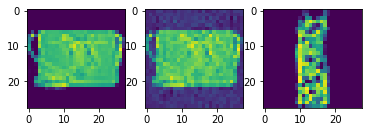

0.6890074014663696


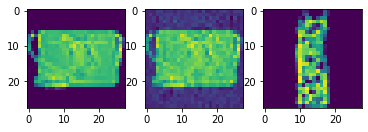

0.5323688983917236


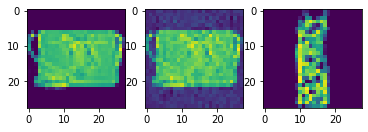

0.37663692235946655


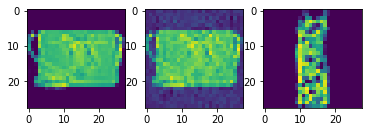

0.22200000286102295


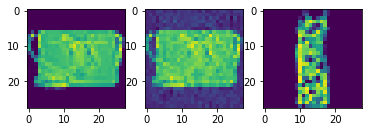

0.06863239407539368


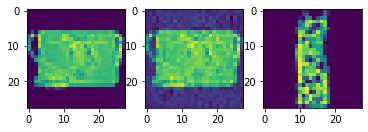

-0.08326083421707153


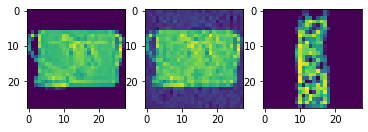

-0.23345577716827393


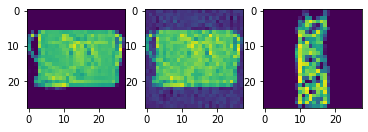

-0.3817421793937683


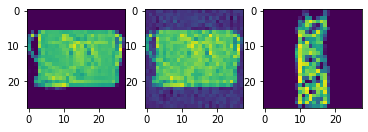

-0.5279166102409363


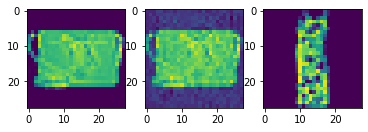

-0.6718040704727173


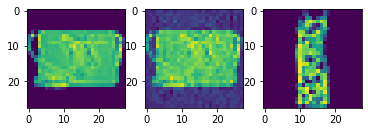

-0.8132423758506775


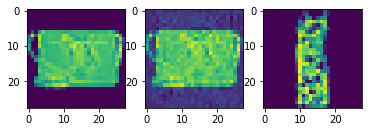

-0.9520963430404663


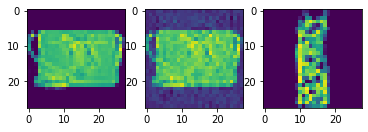

-1.0882258415222168


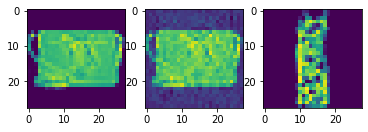

-1.2214951515197754


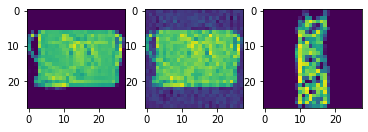

-1.3517804145812988


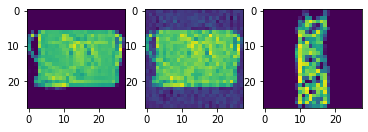

-1.4789403676986694


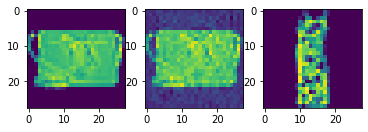

-1.6028494834899902


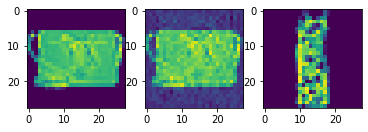

-1.7233870029449463


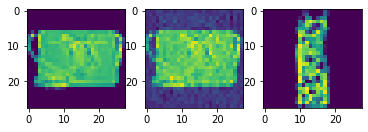

-1.8404536247253418


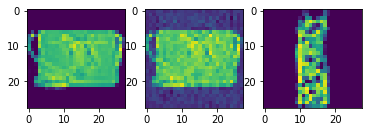

-1.9539543390274048


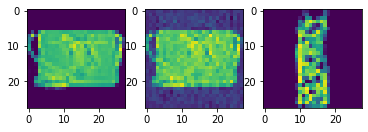

-2.0637998580932617


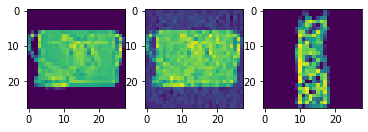

-2.169919013977051


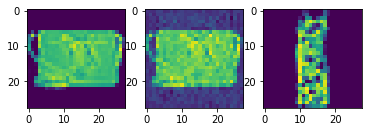

-2.272237777709961


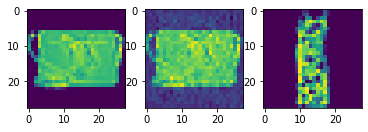

-2.3706893920898438


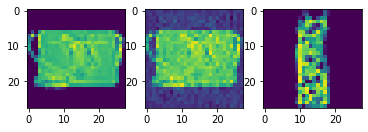

-2.465210437774658


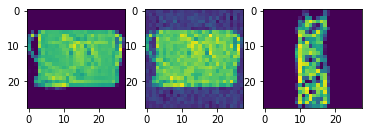

-2.5557546615600586


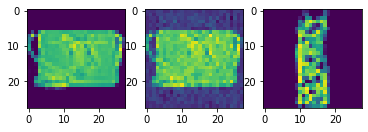

-2.6422886848449707


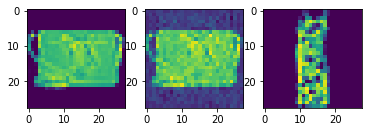

-2.7247846126556396


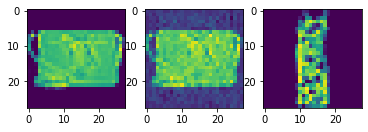

-2.803224563598633


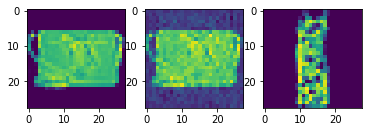

-2.8775832653045654


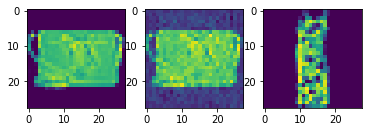

-2.9478304386138916


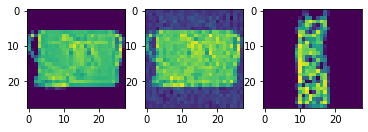

-3.013929605484009


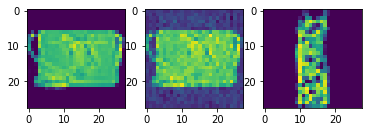

-3.0758371353149414


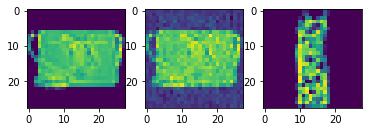

-3.1335015296936035


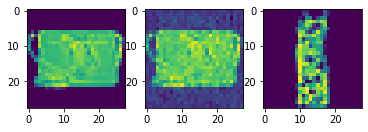

-3.1868743896484375


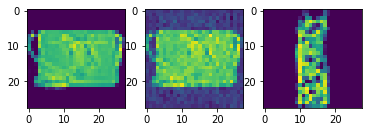

-3.2359094619750977


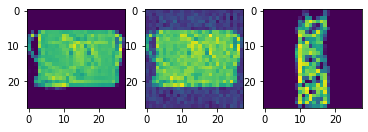

-3.2805593013763428


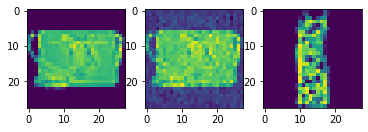

-3.320777654647827


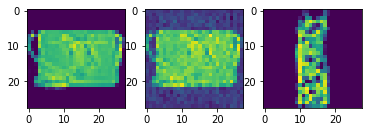

-3.35652494430542


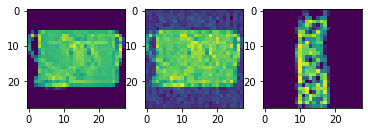

-3.38774037361145


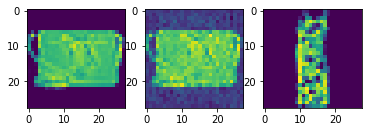

-3.4143857955932617


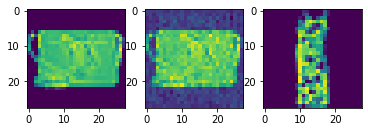

-3.4364473819732666


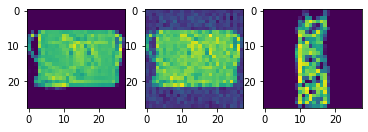

-3.4539144039154053


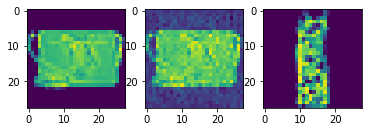

-3.4667930603027344


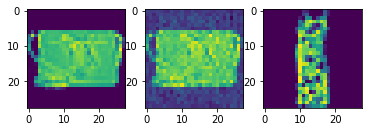

-3.4751081466674805


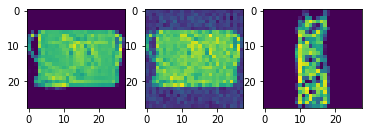

-3.4788992404937744


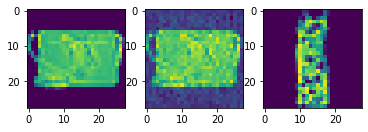

-3.478212833404541


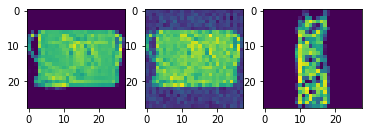

-3.4731016159057617


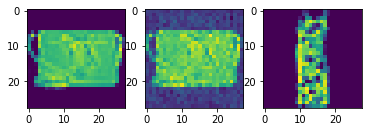

-3.4636216163635254


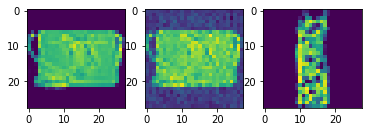

-3.4498255252838135


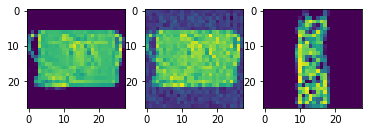

-3.4317591190338135


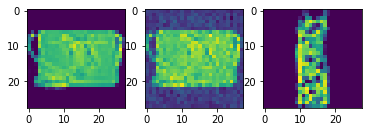

-3.409472942352295


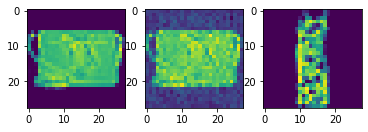

-3.3830132484436035


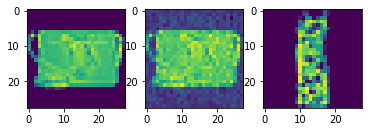

-3.3524184226989746


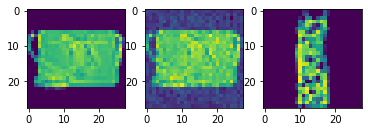

-3.317723512649536


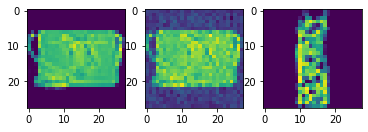

-3.2789528369903564


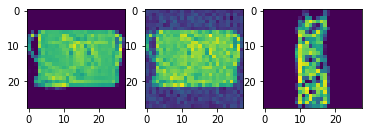

-3.2361249923706055


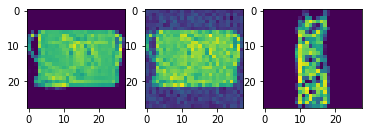

-3.1892547607421875


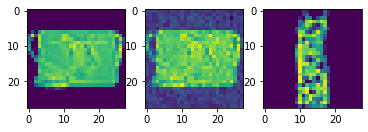

-3.138375997543335


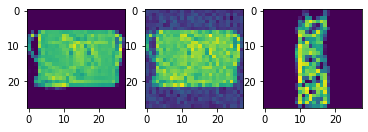

-3.0835232734680176


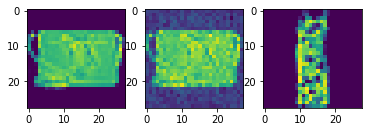

-3.024738311767578


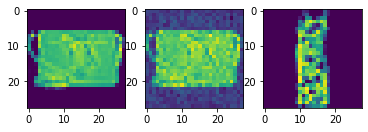

-2.962078332901001


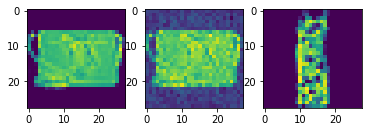

-2.8956124782562256


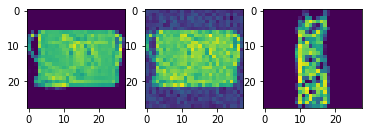

-2.825395107269287


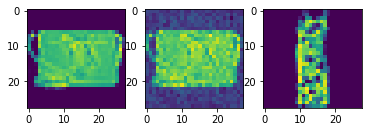

-2.7514922618865967


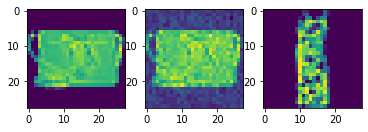

-2.6739749908447266


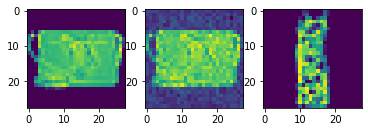

-2.592935085296631


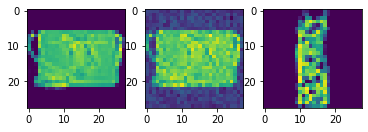

-2.5084686279296875


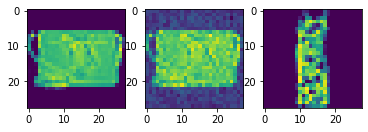

-2.4206788539886475


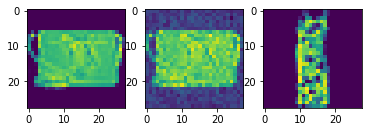

-2.3296728134155273


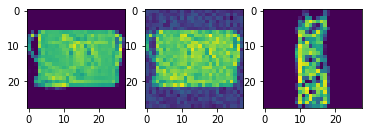

-2.2355527877807617


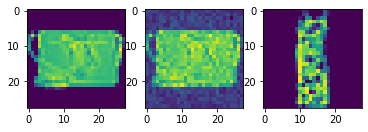

-2.1384425163269043


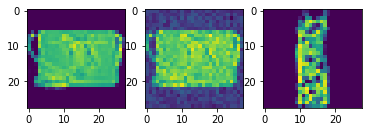

-2.0385000705718994


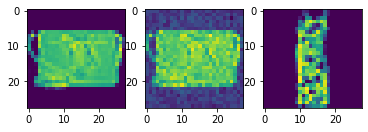

-1.9358935356140137


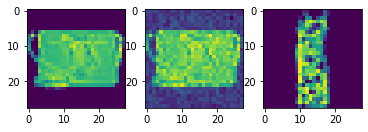

-1.8308072090148926


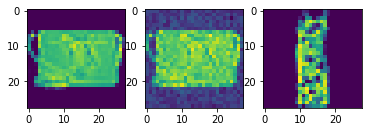

-1.72342050075531


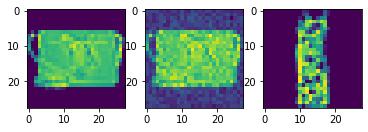

-1.6139057874679565


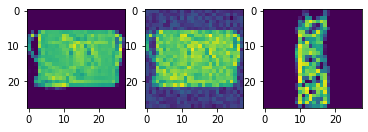

-1.5024371147155762


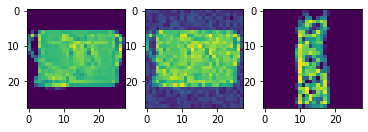

-1.3891798257827759


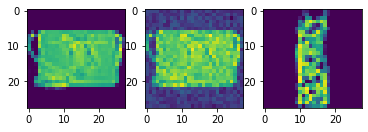

-1.2742862701416016


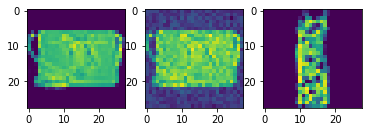

-1.1579055786132812


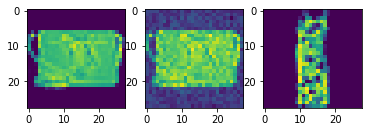

-1.040184497833252


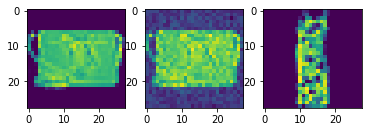

-0.9212665557861328


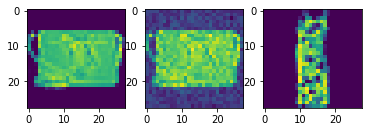

-0.8012956380844116


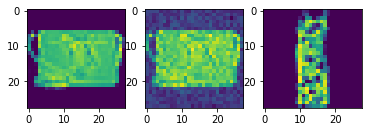

-0.6804211139678955


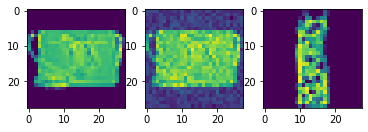

-0.5587791204452515


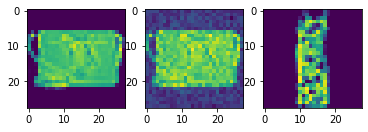

-0.436489999294281


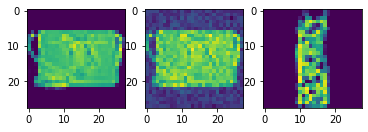

-0.31368809938430786


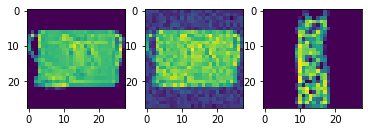

-0.19050192832946777


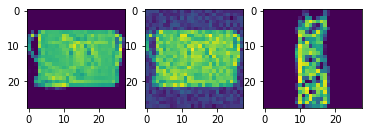

-0.06706845760345459


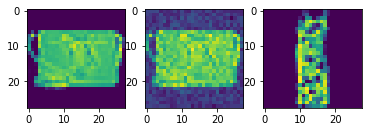

0.05648493766784668


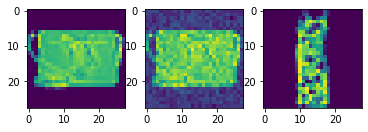

0.18004143238067627


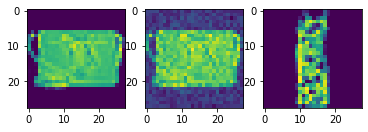

0.3034789562225342


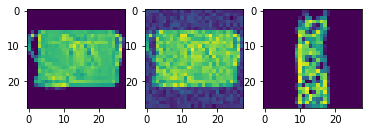

0.4266774654388428


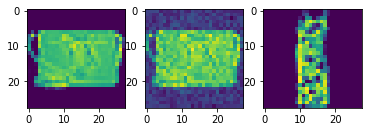

0.5495308637619019


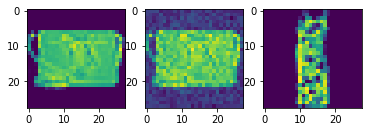

0.6719383001327515


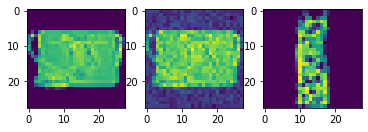

0.7938191890716553


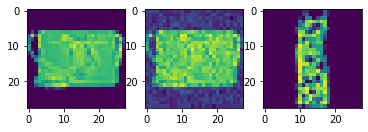

0.9150919914245605


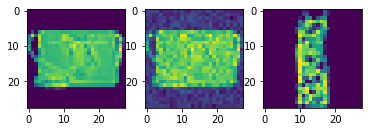

1.0356740951538086


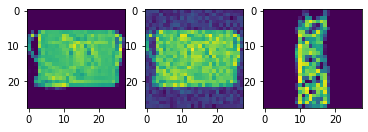

1.1554838418960571


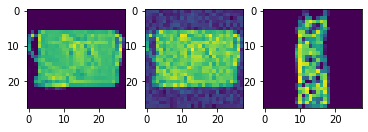

1.274451732635498


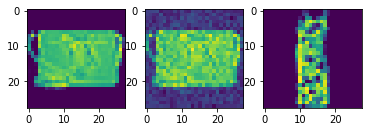

1.3925020694732666


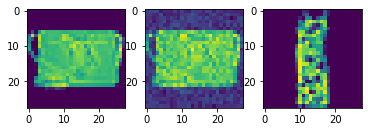

1.5095555782318115


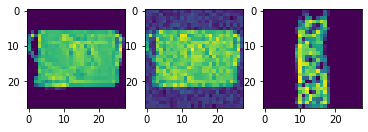

1.6255356073379517


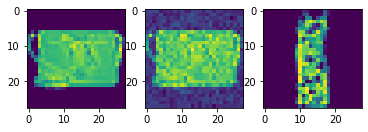

1.7403732538223267


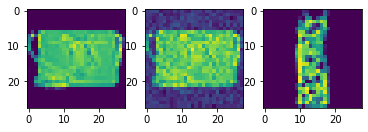

1.8540006875991821


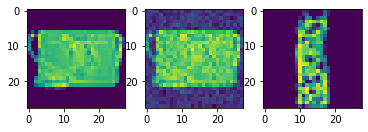

1.966349482536316


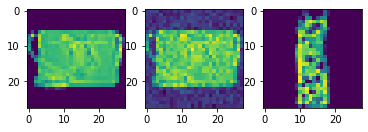

2.0773558616638184


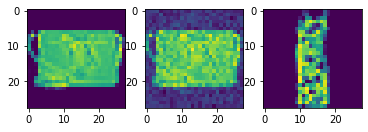

2.186957359313965


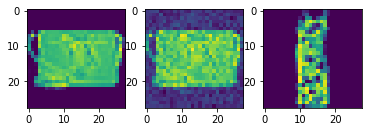

2.295088291168213


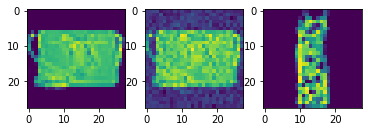

2.4016880989074707


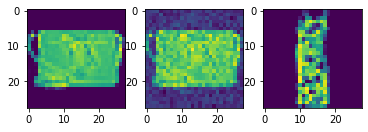

2.5066895484924316


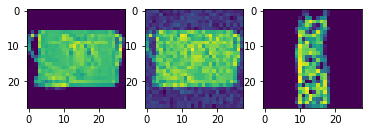

2.6100335121154785


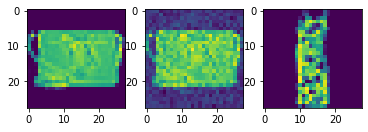

2.711660385131836


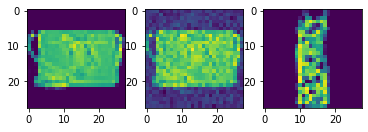

2.8115038871765137


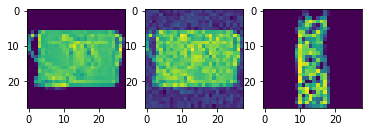

2.9095005989074707


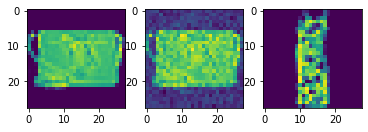

3.0055952072143555


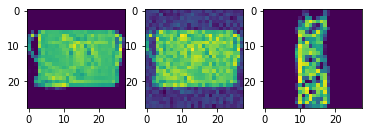

3.0997300148010254


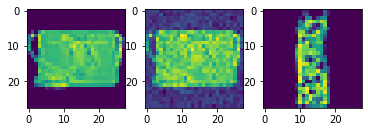

3.191865921020508


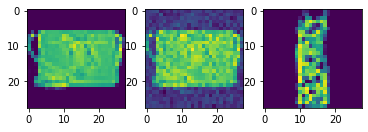

3.2819604873657227


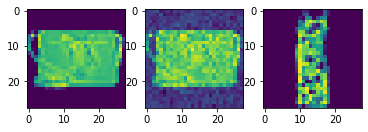

3.369988441467285


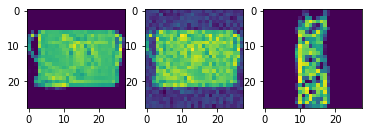

3.455911159515381


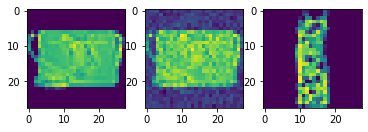

3.5396957397460938


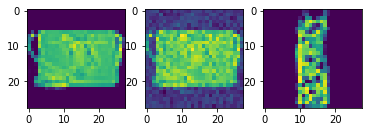

3.6213107109069824


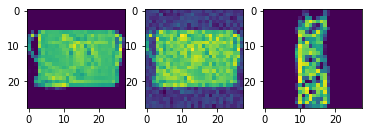

3.700732707977295


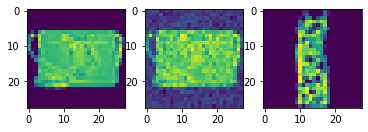

3.7779319286346436


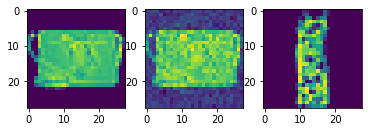

3.8528695106506348


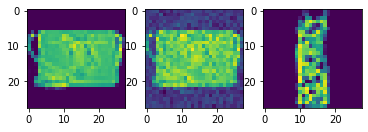

3.9255170822143555


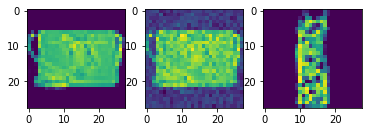

3.9958608150482178


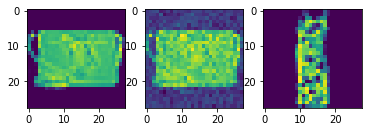

4.063901901245117


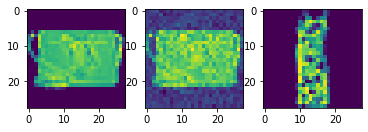

4.129639148712158


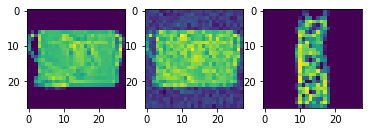

4.193066596984863


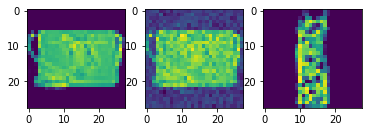

4.254188537597656


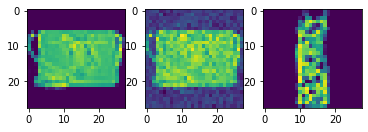

4.31300163269043


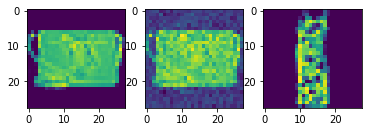

4.369515895843506


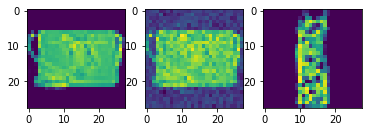

4.423738956451416


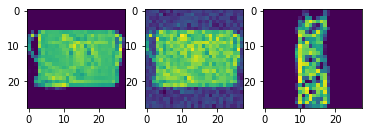

4.475680828094482


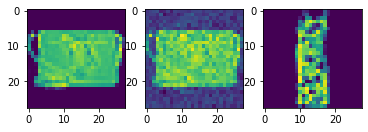

4.525355339050293


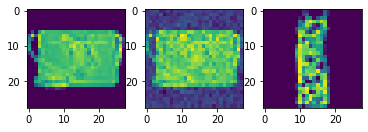

4.572786331176758


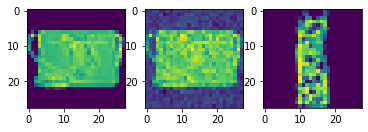

4.618007659912109


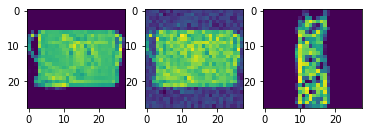

4.661062240600586


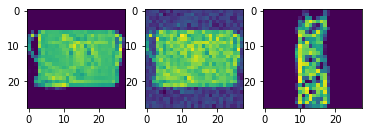

4.701990127563477


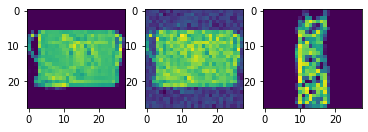

4.740833759307861


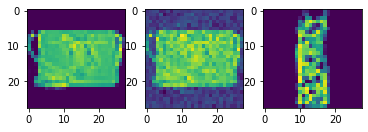

4.777661323547363


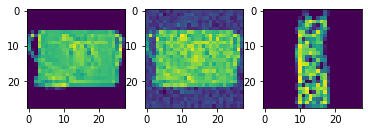

4.8125319480896


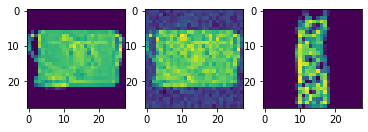

4.845497131347656


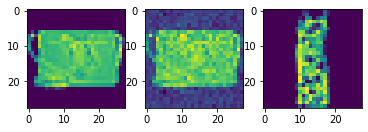

4.8766021728515625


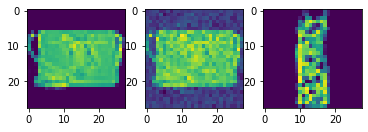

4.90588903427124


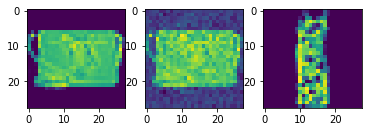

4.933384418487549


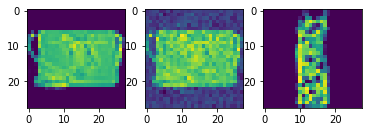

4.959104537963867


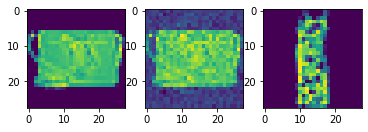

4.983058929443359


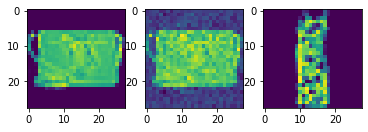

5.005247116088867


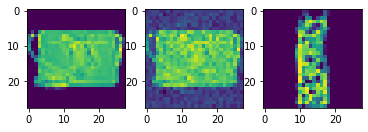

5.025660991668701


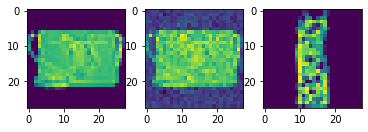

5.044285774230957


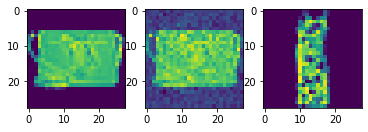

5.061099529266357


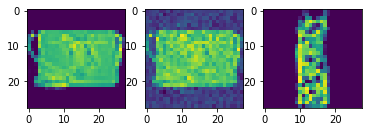

5.076076030731201


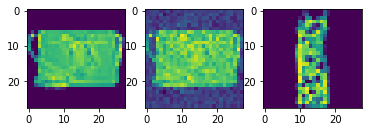

5.089197635650635


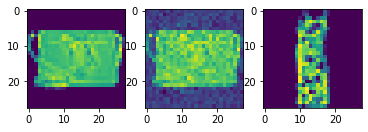

5.100455284118652


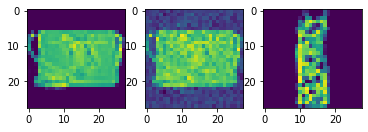

5.109833717346191


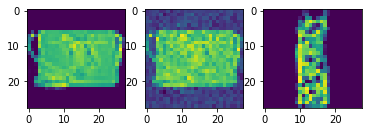

5.117344856262207


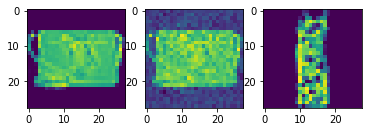

5.122997283935547


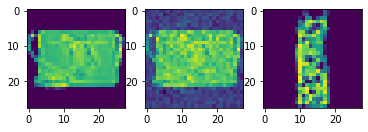

5.12679386138916


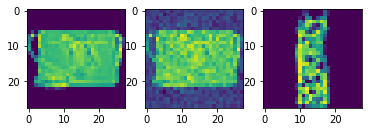

5.128749847412109


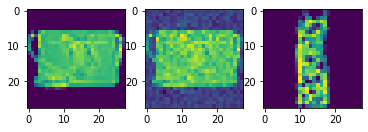

5.128870964050293


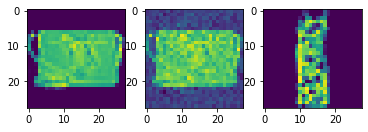

5.127161502838135


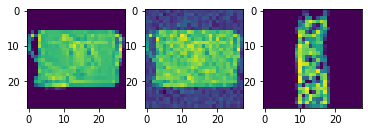

5.12362813949585


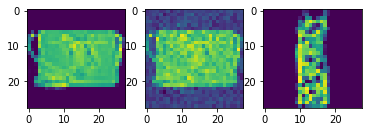

5.118283748626709


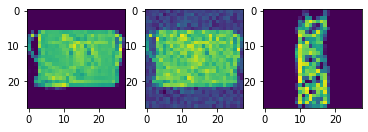

5.111148357391357


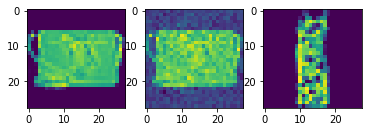

5.102228164672852


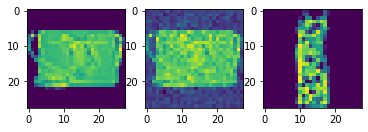

5.091525077819824


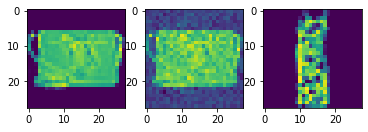

5.079049587249756


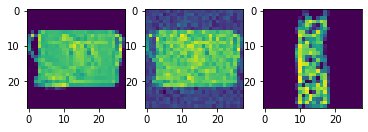

5.064815521240234


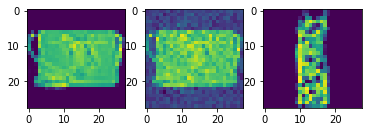

5.048828601837158


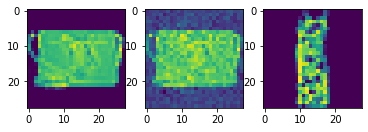

5.031098365783691


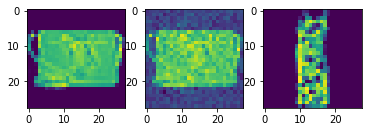

5.011638641357422


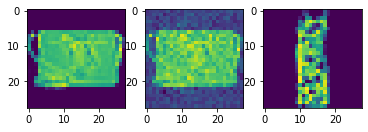

4.9904632568359375


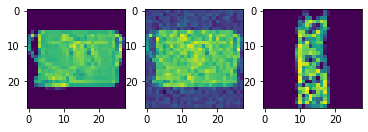

4.967591285705566


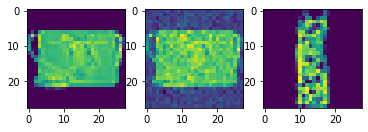

4.943044662475586


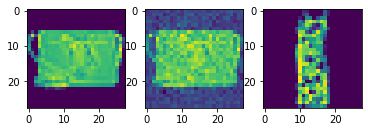

4.91684103012085


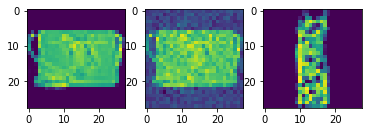

4.889005661010742


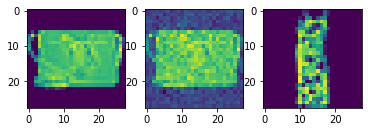

4.859561920166016


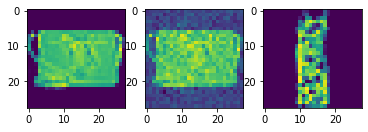

4.828531265258789


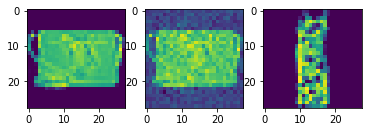

4.795950889587402


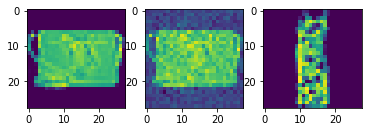

4.76185417175293


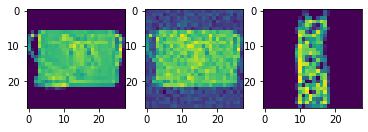

4.7262773513793945


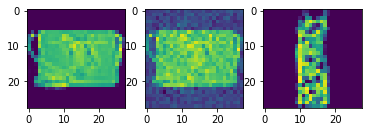

4.689257621765137


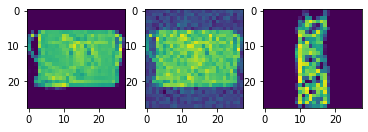

4.650843620300293


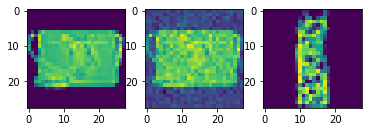

4.611079216003418


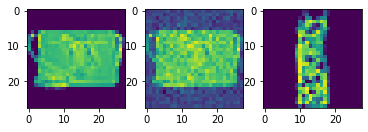

4.570023536682129


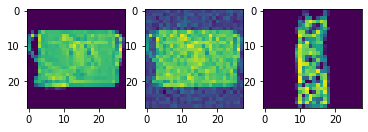

4.527736186981201


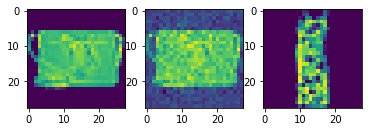

4.484282493591309


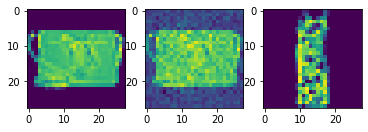

4.439727306365967


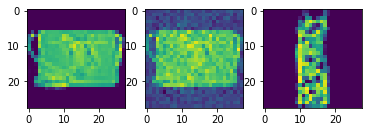

4.394138336181641


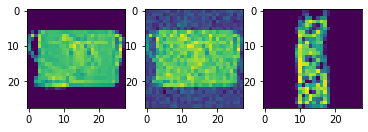

4.34758186340332


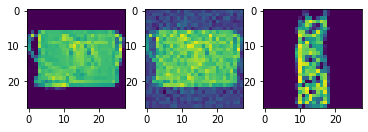

4.300127029418945


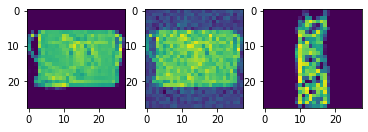

4.251845359802246


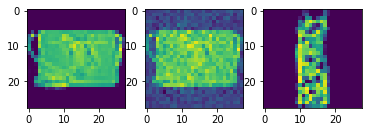

4.202815532684326


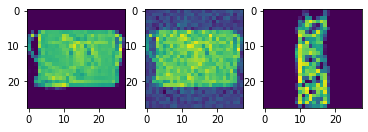

4.153117656707764


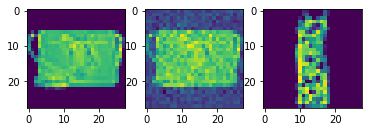

4.102822303771973


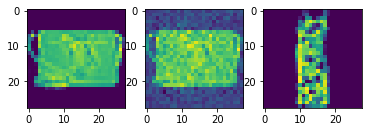

4.052000522613525


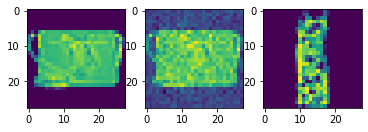

4.000725746154785


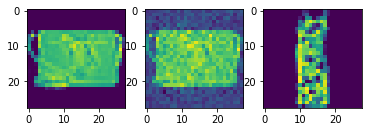

3.9490604400634766


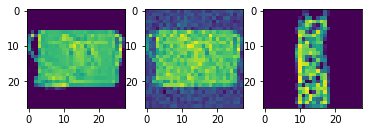

3.897062063217163


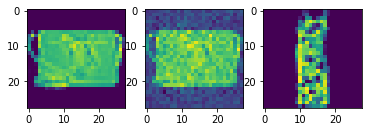

3.8447861671447754


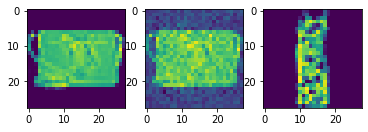

3.7922863960266113


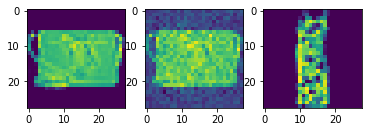

3.7396187782287598


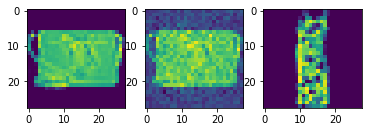

3.686835527420044


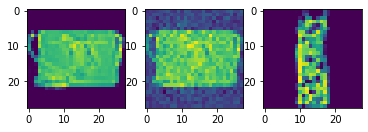

3.633993625640869


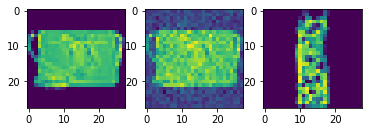

3.5811500549316406


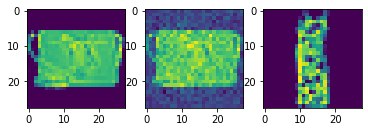

3.5283584594726562


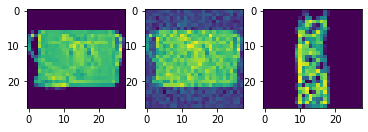

3.4756712913513184


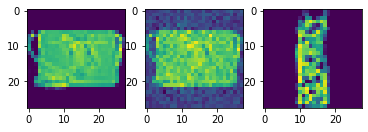

3.423145294189453


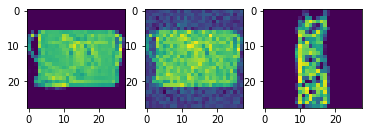

3.3708462715148926


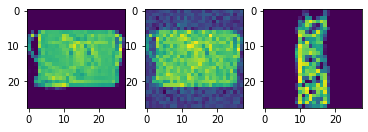

3.3188400268554688


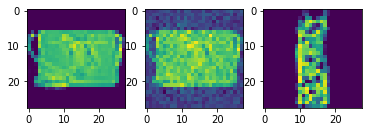

3.26719069480896


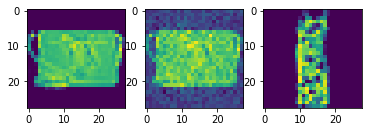

3.2159533500671387


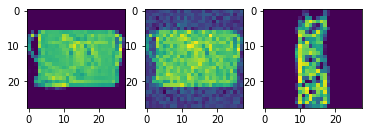

3.16518497467041


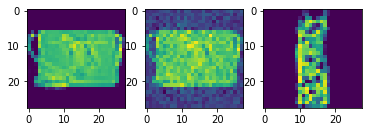

3.1149401664733887


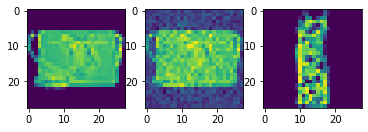

3.065276622772217


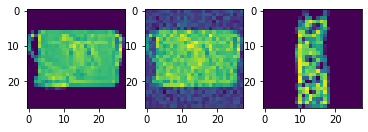

3.016247510910034


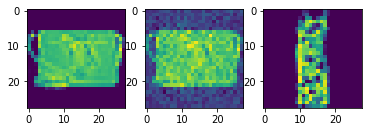

2.9679079055786133


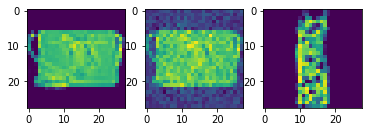

2.9203100204467773


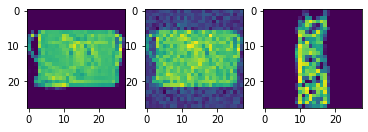

2.873504161834717


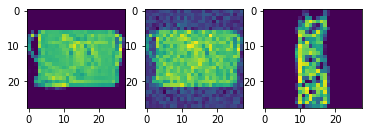

2.827531576156616


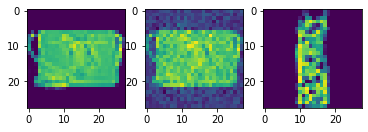

2.7824251651763916


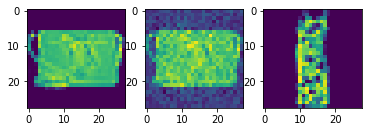

2.7382190227508545


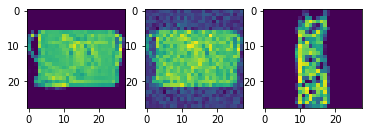

2.694941282272339


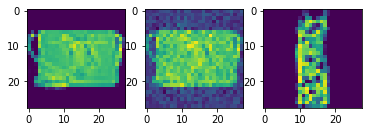

2.652623176574707


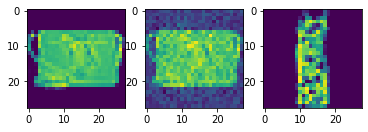

2.6113011837005615


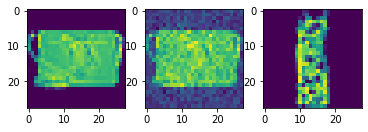

2.5710084438323975


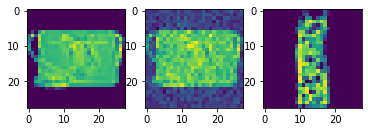

2.53178071975708


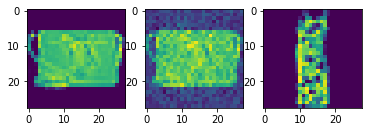

2.4936609268188477


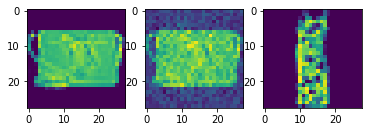

2.4566943645477295


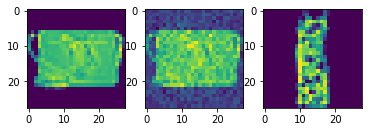

2.4209141731262207


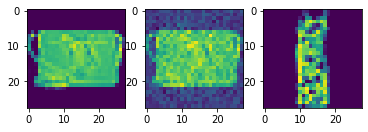

2.386343002319336


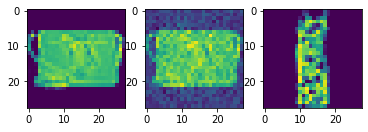

2.3530077934265137


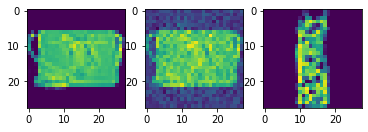

2.320919990539551


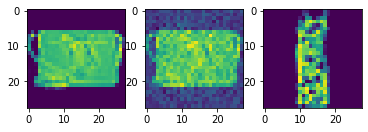

2.29009747505188


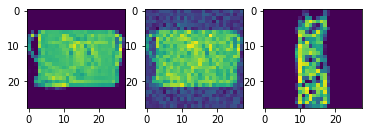

2.2605507373809814


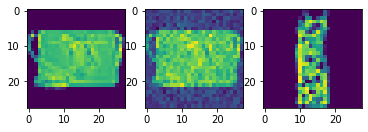

2.2322964668273926


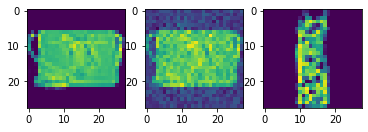

2.2053444385528564


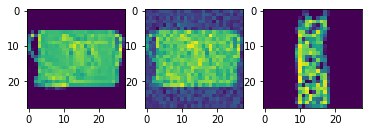

2.179694414138794


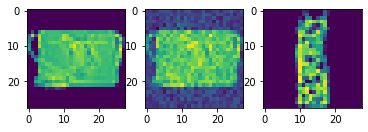

2.155343532562256


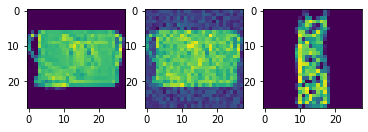

2.132280111312866


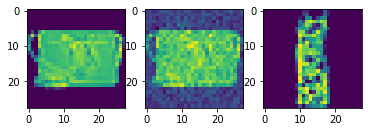

2.1104941368103027


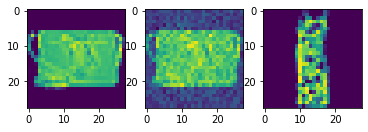

2.089982271194458


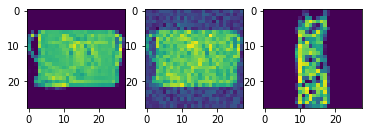

2.070735454559326


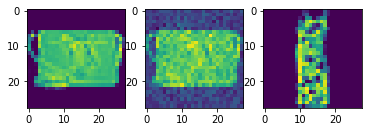

2.0527455806732178


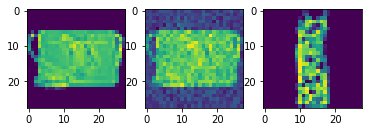

2.0359983444213867


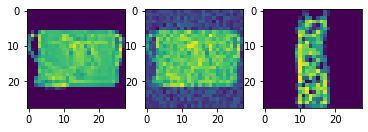

2.0204718112945557


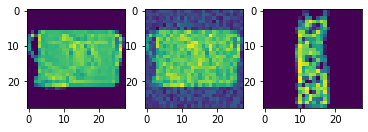

2.006150245666504


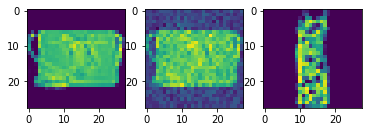

1.993006944656372


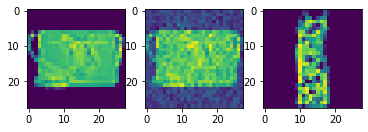

1.9810125827789307


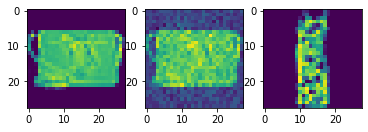

1.970136284828186


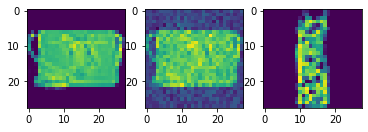

1.960338830947876


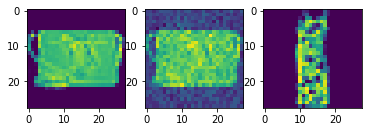

1.9515881538391113


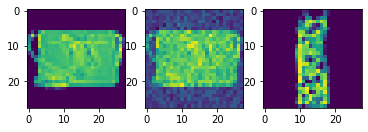

1.9438467025756836


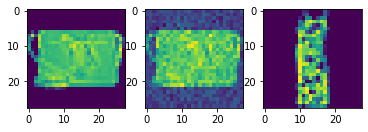

1.9370888471603394


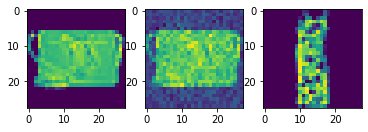

1.9312825202941895


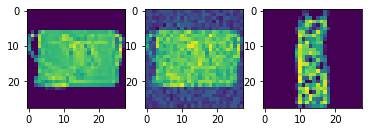

1.9264028072357178


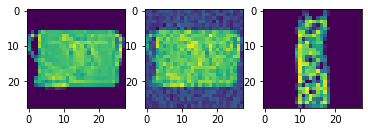

1.922416090965271


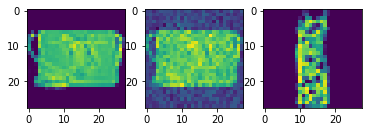

1.919297218322754


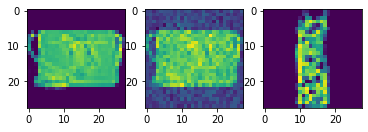

1.9170165061950684


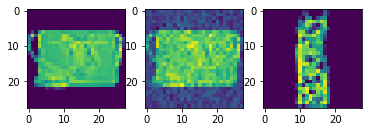

3 8 3


In [207]:
#Experiment 3
# Taking a query and changing it to target class by minimising loss function 

import matplotlib.pyplot as plt
cf_before = cf_image.detach().clone().numpy()
cf_image_copy = cf_image.detach().clone().numpy()
for i in range(2000):
    if (numpy.argmax(model(cf_image.unsqueeze(0)).detach().numpy()) == query_label):
        break
    output = model(cf_image.unsqueeze(0))
    loss_cf = pdist(cf_image, torch.tensor(cf_before)).sum() + 0.1*error(output, torch.tensor(query_label).unsqueeze(0))

    loss_cf.backward()
    optimizer_cf.step()
    diff = cf_image.detach().numpy() - cf_before
    print(diff.sum().item())
    
    plt.figure()
    plt.subplot(1,3,1)
    plt.imshow(cf_before[0,:,:])
    plt.subplot(1,3,2)
#     plt.imshow(diff[0,:,:])
    plt.imshow(cf_image.detach().clone().numpy()[0,:,:])
    plt.subplot(1,3,3)
    plt.imshow(query_image[0,:,:])
    plt.show()

print(numpy.argmax(model(cf_image.unsqueeze(0)).detach().numpy()), cf_label, query_label) 